## **Primer union**

### **Importar librerias**

In [45]:
import pandas as pd 
import numpy as np 

from unidecode import unidecode
import unicodedata
import re

import missingno as msno

In [46]:
pd.set_option("display.max_columns",None)

### **Lectura de datos**

In [47]:
df_act_economica=          pd.read_csv("actividadeconomica202411.csv",sep=";")
df_concesion_quioscos=      pd.read_excel("concesionesquioscos2023.xlsx")
df_fuentes=                 pd.read_csv("fuentesmascotas202411.csv", sep=";")
df_terrazas=                pd.read_csv("terrazas202411.csv",sep=";")
df_pequeñosnegocios=        pd.read_excel("pequeñoscomercios.xlsx")
df_locales2024=             pd.read_csv("locales202411.csv",sep=";")
bdcp_info= pd.read_excel("distr_barrios_codpostal.xlsx")

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15508\1939966007.py:1: DtypeWarning: Columns (37,42,44) have mixed types. Specify dtype option on import or set low_memory=False.
  df_act_economica=          pd.read_csv("actividadeconomica202411.csv",sep=";")
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15508\1939966007.py:6: DtypeWarning: Columns (37) have mixed types. Specify dtype option on import or set low_memory=False.
  df_locales2024=             pd.read_csv("locales202411.csv",sep=";")


### **EDA/Exploratory Data Analysis**

##### **_Empezamos con df_act_economica y df_pequeñosnegocios_**

In [48]:
df_act_economica.shape

(221173, 47)

In [49]:
df_pequeñosnegocios.shape

(1990, 6)

In [50]:
df_act_economica["desc_seccion"].value_counts()

desc_seccion
COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS     53505
HOSTELERÍA                                                                                28414
OTROS SERVICIOS                                                                           16656
ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES                                         10515
ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS                                         10379
ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES                                             8791
EDUCACIÓN                                                                                  6552
TRANSPORTE Y ALMACENAMIENTO                                                                4525
INDUSTRIA MANUFACTURERA                                                                    4358
ACTIVIDADES ARTÍSTICAS, RECREATIVAS Y DE ENTRETENIMIENTO                                   3981
CONSTRUCCIÓN               

In [51]:
df_act_economica.head(2)

,id_local,id_distrito_local,desc_distrito_local,id_barrio_local,desc_barrio_local,cod_barrio_local,id_seccion_censal_local,desc_seccion_censal_local,coordenada_x_local,coordenada_y_local,id_tipo_acceso_local,desc_tipo_acceso_local,id_situacion_local,desc_situacion_local,id_vial_edificio,clase_vial_edificio,desc_vial_edificio,id_ndp_edificio,id_clase_ndp_edificio,nom_edificio,num_edificio,cal_edificio,secuencial_local_PC,id_vial_acceso,clase_vial_acceso,desc_vial_acceso,id_ndp_acceso,id_clase_ndp_acceso,nom_acceso,num_acceso,cal_acceso,coordenada_x_agrupacion,coordenada_y_agrupacion,id_agrupacion,nombre_agrupacion,id_tipo_agrup,desc_tipo_agrup,id_planta_agrupado,id_local_agrupado,rotulo,id_seccion,desc_seccion,id_division,desc_division,id_epigrafe,desc_epigrafe,fx_carga
0,10000097,1.0,CENTRO,104.0,JUSTICIA,4.0,1077.0,77,440851.6,4474857.5,1,Puerta Calle,1,Abierto,81800.0,CALLE,AUGUSTO FIGUEROA ...,11004589,1,NUM,37.0,,20,437400.0,CALLE,LIBERTAD ...,11004588.0,1.0,NUM,31.0,,NaN,NaN,NaN,NaN,NaN,NaN,1,02,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276
1,10000150,1.0,CENTRO,106.0,SOL,6.0,1121.0,121,440044.6,4474063.5,1,Puerta Calle,1,Abierto,498000.0,PLAZA,MAYOR ...,11007683,1,NUM,1.0,,10,498000.0,PLAZA,MAYOR ...,11007683.0,1.0,NUM,1.0,,NaN,NaN,NaN,NaN,NaN,NaN,1,04,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276


In [52]:
df_act_economica["desc_vial_edificio"].value_counts()

desc_vial_edificio
ALCALA                                                2489
CASTELLANA                                            2424
BRAVO MURILLO                                         1509
SERRANO                                               1132
VELAZQUEZ                                             1063
                                                      ... 
FRAMBUESA                                                1
VITIGUDINO                                               1
EL LUCERO DEL ALBA                                       1
VENDIMIADOR                                              1
SAN MACARIO                                              1
Name: count, Length: 6368, dtype: int64

In [53]:
df_act_economica["clase_vial_acceso"].value_counts()

clase_vial_acceso
CALLE                       182051
AVENIDA                      18253
PASEO                         9160
PLAZA                         6498
CAMINO                         877
CARRETERA                      873
RONDA                          770
TRAVESIA                       763
GLORIETA                       560
BULEVAR                        321
PASAJE                         259
CARRERA                        187
CUESTA                         174
COSTANILLA                     156
CALLEJON                       114
AUTOVIA                         73
PLAZUELA                        25
PASADIZO                        14
COLONIA                         13
GALERIA                          8
PISTA                            7
CAÑADA                           5
PARTICULAR                       5
ACCESO                           2
PARQUE                           1
Name: count, dtype: int64

In [54]:
df_act_economica["desc_distrito_local"].value_counts()

desc_distrito_local
CENTRO                  24815
SALAMANCA               18092
CARABANCHEL             15344
TETUAN                  15232
CIUDAD LINEAL           14251
CHAMBERI                14232
PUENTE DE VALLECAS      12444
CHAMARTIN               12254
LATINA                  11486
FUENCARRAL-EL PARDO     10574
HORTALEZA                9043
SAN BLAS-CANILLEJAS      8762
ARGANZUELA               8706
VILLAVERDE               8562
MONCLOA-ARAVACA          7625
RETIRO                   7153
USERA                    7033
VILLA DE VALLECAS        6381
BARAJAS                  3290
MORATALAZ                3169
VICALVARO                2724
Name: count, dtype: int64

In [55]:
df_pequeñosnegocios["Unnamed: 2"]

0                NOMBRE DE VÍA
1                    CL ORENSE
2                CL FUENCARRAL
3            CL NÚÑEZ DEL ARCE
4          CL TIMOTEO DOMINGO 
                 ...          
1985         TRAVESIA DE RONDA
1986           AV MEDITERRÁNEO
1987    CL HACIENDA DE PAVONES
1988          PZ JULIAN MARIAS
1989     CL FEDERICO GUTIÉRREZ
Name: Unnamed: 2, Length: 1990, dtype: object

In [56]:
df_pequeñosnegocios.head(10)

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5
0,NOMBRE COMERCIAL / RAZÓN SOCIAL,SECTOR,NOMBRE DE VÍA,NÚMERO,LOCALIZACIÓN,CÓDIGO POSTAL
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,CL ORENSE,11,NaN,28020
2,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,CL FUENCARRAL,145,NaN,28010
3,12 ROOMS,HOTELES,CL NÚÑEZ DEL ARCE,9,NaN,28012
4,A & J ZAPATOS,CALZADO,CL TIMOTEO DOMINGO,1,"C/V CL ALCALÁ, 342",28017
5,A SU MEDIDA,TINTORERÍAS Y LAVANDERÍAS,CL ZARAGOZA,6,NaN,28012
6,A TOLA DE MI GITANA,TEXTIL,CL ARGUMOSA,9,NaN,28012
7,A.M. TECNICAR,TALLERES DE REPARACIÓN DE AUTOMÓVILES,CL CRISTOBAL BORDIU,3,NaN,28003
8,A.R. PIEL C.S.,TEXTIL,DOCTOR CASTELO,6,NaN,28009
9,ABARDEEN,TEXTIL,CL HERMOSILLA,42,NaN,28001


In [57]:
df_pequeñosnegocios["Unnamed: 5"].value_counts()

Unnamed: 5
28004            100
28010             87
28005             78
28045             69
28027             68
28012             65
28017             64
28020             64
28007             61
28013             58
28001             56
28015             54
28029             53
28026             53
28021             48
28038             48
28028             47
28032             46
28030             46
28047             45
28025             45
28018             45
28002             45
28008             40
28011             40
28009             40
28041             39
28043             37
28003             37
28006             34
28019             33
28039             32
28044             30
28042             29
28022             27
28016             26
28053             24
28031             24
28014             20
28033             19
28037             16
28036             16
28024             14
28035             13
28034             13
28023             12
28054              7
28

In [58]:
df_act_economica["id_vial_acceso"]

0         437400.0
1         498000.0
2         262000.0
3         253200.0
4          68300.0
            ...   
221168    332100.0
221169    332100.0
221170    610000.0
221171    204150.0
221172    325300.0
Name: id_vial_acceso, Length: 221173, dtype: float64

### **Preprocesamiento de datos**

In [59]:
# Aqui vamos a crear una variable nueva y le asignaremos un diccionario dentro con el nombre de las columnas que queremos modificar y el nuevo 
# nombre que le asignaremos a esas columnas. Empezamos creando una variable nueva usando nuestra podersoa imaginacion despues el operador de 
# asignacio y finalmente  abrimos un diccionario y dentro escribrimos primero el nombre de la columna que vamos a modificar rodeado de comillas 
# dobles seguido de dobles puntos y despues el nuevo nombre que le vamos a asignar a esa columna que escribimos antes de los dos puntos despues 
# si haremos mas modificaciones solo separamos cada siguiente columna con una coma.


nuevas_col= {
    "id_seccion"    :"id_SECTOR",
    "desc_seccion"  :"SECTOR",
    "rotulo"        :"NOMBRE COMERCIAL / RAZÓN SOCIAL",
    "id_vial_acceso":"id_NOMBRE_DE_VÍA",
    "clase_vial_acceso": "clase_NOMBRE_DE_VIA",
    "desc_vial_acceso" :"NOMBRE DE VÍA"

}
# Aqui vamos a aplicar lo que creamos atras. Llamamos a la variable que tiene las columnas que queremos renombrar y le seguimos con un operador 
# de asignacion. Despues hacemos la magia de cambios de nombres. llamamos a la misma variable y le aplicamos el metodo .rename( ) dentro del meto 
# do .rename() o sea dentro de sus parentesis vamos a colocar un parametro llamado columns= que nos ayudara a especificar que lo que vamos a cambiar 
# van a ser efectivamente los nombres de las columnsa y ya despues le pasamos al parametro la variable donde tenemos el diccionario con los nombres 
# de las columnas y sus nuevos nombres. 

df_act_economica1=df_act_economica.rename(columns=nuevas_col)


In [60]:
# Aqui estamos modificando el nombre de las columnas pero de una forma distinta. Empezamos llamando a la variabe que tiene las columnas que queremos
# modificar y le pasamos el atributo de seleccion de columnas que es .columns ahora le sigue un operador de asignacion y llamamos a la misma variable 
# de antes  y a esa misma variable le aplicamos algo a lo que se le llamam slicing y utilizamos el .iloc[] para hacer el slicing por los indices. 
# resultado al final que cambiamos los nombres de las columans por la primera fila del dataframe. 

df_pequeñosnegocios.columns = df_pequeñosnegocios.iloc[0]
# Ahora con esta parte lo que vamos a hacer es eliminar la fila que no tiene un valor relevante y por la cual reemplazamos por la primera fila y que antes 
# era el nombre de las columnas. llamamos a la variable, pasamos un operador de asignacion  y a eso le sigue otra llamada a la misma variable que llamamos
# atras y finalmente hacemos un slicing como en el codigo anterior pero aqui le decimos que se quede desde el segundo valor o sea 1 en adelante , dejando 
# el valor 0 eliminado siendo el valor que efectivamente no tenia relavancia y queriamos eliminar. 

df_pequeñosnegocios = df_pequeñosnegocios[1:]

In [61]:
# Aqui he hecho el reseteo del indice de la variable df_pequeñosnegocios. lo cual me ayuda a restaurar el indice a su estado "normal" y ordenado como 
# deberia despues de haber eliminado una fila en el bloque anterior. Primero se llama a la variable, despues se llama a nuestro amigue el metodo .re 
# set_index() y dentro colocamos dos parametros el primero es drop= con un valor igual a True para eliminar la numeracion anterior y el inplace= con 
# el valor igual a True que nos ayuda a hacer que el cambio se aplique a la variable que se busca modificar sin tener que asignarla de nuevo a la misma 
# variable o sea escribir mas codigo.

df_pequeñosnegocios.reset_index(drop=True,inplace=True)

In [62]:
df_pequeñosnegocios

,NOMBRE COMERCIAL / RAZÓN SOCIAL,SECTOR,NOMBRE DE VÍA,NÚMERO,LOCALIZACIÓN,CÓDIGO POSTAL
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,CL ORENSE,11,NaN,28020
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,CL FUENCARRAL,145,NaN,28010
2,12 ROOMS,HOTELES,CL NÚÑEZ DEL ARCE,9,NaN,28012
3,A & J ZAPATOS,CALZADO,CL TIMOTEO DOMINGO,1,"C/V CL ALCALÁ, 342",28017
4,A SU MEDIDA,TINTORERÍAS Y LAVANDERÍAS,CL ZARAGOZA,6,NaN,28012
...,...,...,...,...,...,...
1984,ZAPATOS RUTH ARCOS,CALZADO,TRAVESIA DE RONDA,8,NaN,28022
1985,ZAPATOS RUTH ARCOS,CALZADO,AV MEDITERRÁNEO,109,NaN,28007
1986,ZAPTOS JAVIER TORRES,CALZADO,CL HACIENDA DE PAVONES,4,NaN,28030
1987,ZELTARIA,TEXTIL,PZ JULIAN MARIAS,2,Local 5,28026


In [63]:
df_pequeñosnegocios["LOCALIZACIÓN"].value_counts()

LOCALIZACIÓN
C.C. ISLAZUL                         4
A                                    3
MERCADO CHAMARTÍN                    3
C.C. ARTURIO SORIA                   2
C.C. PLENILUNIO                      2
                                    ..
MERCADO DE ALAMEDA DE OSUNA PB L8    1
MERCADO DE VICÁLVARO SO L63          1
MERCADO DE VICÁLVARO SO L65          1
MERCADO DE VICÁLVAOR PB L15          1
Local 5                              1
Name: count, Length: 149, dtype: int64

In [64]:
df_pequeñosnegocios.head(3)

,NOMBRE COMERCIAL / RAZÓN SOCIAL,SECTOR,NOMBRE DE VÍA,NÚMERO,LOCALIZACIÓN,CÓDIGO POSTAL
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,CL ORENSE,11,NaN,28020
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,CL FUENCARRAL,145,NaN,28010
2,12 ROOMS,HOTELES,CL NÚÑEZ DEL ARCE,9,NaN,28012


In [65]:
# Aqui estaba eliminando las iniciales pero ahora se que puedo crear una tipologia aparte que me ayude a identificar las calles y avenidas. 

# columna_iterar= "NOMBRE DE VÍA"
# df_pequeñosnegocios[columna_iterar] = df_pequeñosnegocios[columna_iterar].replace((r"\bCL\b"),"",regex=True )

# df_pequeñosnegocios[columna_iterar] = df_pequeñosnegocios[columna_iterar].replace((r"\bAV\b"),"",regex=True )

In [66]:
df_act_economica1.shape

(221173, 47)

|Acciones                                                    |Estado                        |
|------------------------------------------------------------|------------------------------|
|df_pequeñosnegocios:Agregarle columna barrio.               | LISTO                        |
|df_pequeñosnegocios:Deducir barrio por Codigo Postal        | LISTO                        |
|df_pequeñosnegocios: Deducir Distrito por Codigo Postal     | LISTO                        |
|df_pequeñosnegocios: Deducir el cod_barrio por barrio       | LISTO                        |
|df_pequeñosnegocios: Deducir el cod_barrio_2 por barrio     | LISTO                        |
|df_pequeñosnegocios: Deducir el cod_distrito por distrito   | LISTO                        |
|df_pequeñosnegocios: Eliminar columa Numero.                |            LISTO                  |
|df_pequeñosngocios : Eliminar columna Localizacion          |              LISTO               |
|df_pequeñosnegocios: Crear columna tipologia con la columna nombre via|        LISTO           |



In [67]:
df_pequeñosnegocios= df_pequeñosnegocios.dropna(subset="CÓDIGO POSTAL")

In [68]:
df_pequeñosnegocios["CÓDIGO POSTAL"].isna().sum()

0

In [69]:
# Aqui vamos a crear las columnas nuevas en el dataframe para despues agregarles los valores. 

df_pequeñosnegocios["barrio"]       =np.nan
df_pequeñosnegocios["cod_barrio"]   =np.nan
df_pequeñosnegocios["cod_barrio_2"] =np.nan
df_pequeñosnegocios["distrito"]     =np.nan
df_pequeñosnegocios["cod_distrito"] =np.nan

# Aqui vamos hacer el recorrido del dataframe de referencia para empezar a asignar el barrio y de ahi todos los valores de cod_barrio,cod_barrio_2,
# distrito,cod_distrito tomando de ayuda el codigo postal del dataframe original.

def asignar_valores_por_codigo_postal(df_pequeños_negocios, bdcp_info):
    # Iteramos sobre las filas del dataframe original
    for idx, fila in df_pequeños_negocios.iterrows():
        codigo_postal = fila["CÓDIGO POSTAL"]
        
        # Buscamos la coincidencia en el dataframe de referencia
        coincidencia = bdcp_info[bdcp_info["codigo_Postal"] == codigo_postal]
        
        if not coincidencia.empty:
            # Extraemos los valores de las columnas del dataframe de referencia
            nombre_barrio = coincidencia.iloc[0]["nombre_barrio"]
            cod_barrio = coincidencia.iloc[0]["cod_barrio"]
            cod_barrio_2 = coincidencia.iloc[0]["cod_barrio_2"]
            nombre_distrito = coincidencia.iloc[0]["nombre_distrito"]
            cod_distrito = coincidencia.iloc[0]["cod_distrito"]
            
            # Asignamos los valores a las columnas correspondientes en el dataframe original
            df_pequeños_negocios.at[idx, "barrio"] = nombre_barrio
            df_pequeños_negocios.at[idx, "cod_barrio"] = cod_barrio
            df_pequeños_negocios.at[idx, "cod_barrio_2"] = cod_barrio_2
            df_pequeños_negocios.at[idx, "distrito"] = nombre_distrito
            df_pequeños_negocios.at[idx, "cod_distrito"] = cod_distrito
        else:
            # Si no hay coincidencia, dejamos los valores en blanco (NaN)
            df_pequeños_negocios.at[idx, "barrio"] = pd.NA
            df_pequeños_negocios.at[idx, "cod_barrio"] = pd.NA
            df_pequeños_negocios.at[idx, "cod_barrio_2"] = pd.NA
            df_pequeños_negocios.at[idx, "distrito"] = pd.NA
            df_pequeños_negocios.at[idx, "cod_distrito"] = pd.NA

    return df_pequeños_negocios
df_pequeñosnegocios = asignar_valores_por_codigo_postal(df_pequeñosnegocios, bdcp_info)


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15508\542222504.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pequeñosnegocios["barrio"]       =np.nan
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15508\542222504.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pequeñosnegocios["cod_barrio"]   =np.nan
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15508\542222504.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

In [70]:
nulos_barrio= df_pequeñosnegocios[df_pequeñosnegocios["barrio"].isna()]
valores_codigo_postal= nulos_barrio["CÓDIGO POSTAL"].unique()
valores_codigo_postal

array([28022, 28051, 28036, 28054, 28050], dtype=object)

In [71]:
df_pequeñosnegocios["barrio"].isna().sum()

60

In [72]:
df_pequeñosnegocios= df_pequeñosnegocios.dropna(subset="barrio")

In [73]:
df_pequeñosnegocios["barrio"].isna().sum()

0

In [74]:
df_pequeñosnegocios["NÚMERO"].value_counts()

NÚMERO
3           74
2           69
5           60
4           58
9           56
            ..
246          1
KM 7,100     1
103          1
6 y 8        1
81 B         1
Name: count, Length: 261, dtype: int64

In [75]:
df_pequeñosnegocios["LOCALIZACIÓN"].value_counts()

LOCALIZACIÓN
A                                     3
MERCADO CHAMARTÍN                     3
GALERÍA COMERCIAL LA LAGUNA PB L28    2
MERCADO DE LA PAZ PB L93              2
C.C. ARTURIO SORIA                    2
                                     ..
MERCADO LOS ÁNGELES PB L3             1
MERCADO DE ALAMEDA DE OSUNA PB L8     1
MERCADO DE VICÁLVARO SO L63           1
MERCADO DE VICÁLVARO SO L65           1
Local 5                               1
Name: count, Length: 144, dtype: int64

In [76]:
df_pequeñosnegocios["LOCALIZACIÓN"].isna().sum()

1768

In [77]:
df_pequeñosnegocios = df_pequeñosnegocios.drop(columns=["NÚMERO","LOCALIZACIÓN"])

In [78]:
df_pequeñosnegocios.head(5)

,NOMBRE COMERCIAL / RAZÓN SOCIAL,SECTOR,NOMBRE DE VÍA,CÓDIGO POSTAL,barrio,cod_barrio,cod_barrio_2,distrito,cod_distrito
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,CL ORENSE,28020,Cuatro Caminos,62.0,2.0,Tetuán,6.0
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,CL FUENCARRAL,28010,Trafalgar,73.0,3.0,Chamberí,7.0
2,12 ROOMS,HOTELES,CL NÚÑEZ DEL ARCE,28012,Embajadores,12.0,2.0,Centro,1.0
3,A & J ZAPATOS,CALZADO,CL TIMOTEO DOMINGO,28017,Pueblo Nuevo,152.0,2.0,Ciudad Lineal,15.0
4,A SU MEDIDA,TINTORERÍAS Y LAVANDERÍAS,CL ZARAGOZA,28012,Embajadores,12.0,2.0,Centro,1.0


In [79]:
df_pequeñosnegocios["NOMBRE DE VÍA"].value_counts()

NOMBRE DE VÍA
CL BRAVO MURILLO         26
CL ALCALA                21
CL MARCELO USERA         17
CL EMBAJADORES           15
CL FUENCARRAL            14
                         ..
PZ FONSAGRADA             1
PO DE LOS TALLERES        1
AV PIO XII                1
CL NARCISO SERRA          1
CL FEDERICO GUTIÉRREZ     1
Name: count, Length: 1077, dtype: int64

In [80]:
# Aqui creo la nueva columna.
df_pequeñosnegocios["tipologia_via"]=np.nan


# Ahora vamos a crear la funcion que extraera la primer palabra de la columa nombre de via y lo pasara a tipologia_via.

def extraer_tipologia_via(df_pequeñosnegocios, columna_original, columna_destino):
    """
    Extrae la primera palabra de cada valor en una columna del DataFrame y la asigna a otra columna,
    eliminándola del texto original.

    Args:
        df_pequeñosnegocios (pd.DataFrame): El DataFrame que contiene las columnas.
        columna_original (str): El nombre de la columna de donde se extraerá la palabra.
        columna_destino (str): El nombre de la columna donde se asignará la palabra extraída.

    Returns:
        pd.DataFrame: El DataFrame actualizado.
    """
    def procesar_fila(valor):
        if pd.notna(valor) and isinstance(valor, str):
            palabras = valor.split()
            if palabras:
                primera_palabra = palabras[0]
                resto_texto = ' '.join(palabras[1:])
                return primera_palabra, resto_texto
        return None, valor

    # Aplicar la función fila por fila
    df_pequeñosnegocios[[columna_destino, columna_original]] = df_pequeñosnegocios[columna_original].apply(
        lambda x: pd.Series(procesar_fila(x))
    )

    return df_pequeñosnegocios

# Ejemplo de uso:
# Suponiendo que ya tienes el dataframe df_pequeñosnegocios con la columna "NOMBRE DE VÍA"
df_pequeñosnegocios = extraer_tipologia_via(df_pequeñosnegocios, "NOMBRE DE VÍA", "tipologia_via")


In [81]:
df_pequeñosnegocios

,NOMBRE COMERCIAL / RAZÓN SOCIAL,SECTOR,NOMBRE DE VÍA,CÓDIGO POSTAL,barrio,cod_barrio,cod_barrio_2,distrito,cod_distrito,tipologia_via
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,ORENSE,28020,Cuatro Caminos,62.0,2.0,Tetuán,6.0,CL
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,FUENCARRAL,28010,Trafalgar,73.0,3.0,Chamberí,7.0,CL
2,12 ROOMS,HOTELES,NÚÑEZ DEL ARCE,28012,Embajadores,12.0,2.0,Centro,1.0,CL
3,A & J ZAPATOS,CALZADO,TIMOTEO DOMINGO,28017,Pueblo Nuevo,152.0,2.0,Ciudad Lineal,15.0,CL
4,A SU MEDIDA,TINTORERÍAS Y LAVANDERÍAS,ZARAGOZA,28012,Embajadores,12.0,2.0,Centro,1.0,CL
...,...,...,...,...,...,...,...,...,...,...
1983,ZAPATOS RUTH ARCOS,CALZADO,CIUDAD DE BARCELONA,28007,Pacífico,31.0,1.0,Retiro,3.0,CL
1985,ZAPATOS RUTH ARCOS,CALZADO,MEDITERRÁNEO,28007,Pacífico,31.0,1.0,Retiro,3.0,AV
1986,ZAPTOS JAVIER TORRES,CALZADO,HACIENDA DE PAVONES,28030,Pavones,141.0,1.0,Moratalaz,14.0,CL
1987,ZELTARIA,TEXTIL,JULIAN MARIAS,28026,Almendrales,124.0,4.0,Usera,12.0,PZ


---

####  **A este punto ya trabaje el archivo df_pequeñosnegocios y esta listo para unirse**

---

|Acciones                                                    |Estado                        |
|------------------------------------------------------------|------------------------------|
|df_act_economica1:Eliminar columna id_local               |      LISTO                 |
|df_act_economica1:Cambiar nombre id_distrito_local por cod_distrito       |LISTO                        |
|df_act_economica1:Cambiar el nombre de desc_dsitrito_local a distrito |  LISTO                      |
|df_act_economica1: Cambiar el nombre id_barrio_local por cod_barrio     |  LISTO                     |
|df_act_economica1: Cambiar el nombre desc_barrio_local por barrio    |   LISTO                    |
|df_act_economica1: Cambiar el nombre cod_barrio_local por cod_barrio   | LISTO                      |
|df_act_economica1: Eliminar columna id_vial_edificio               |    LISTO                          |
|df_act_economica1 :   Eliminar columna id_NOMBRE_DE_VÍA	     |   LISTO                          |
|df_act_economica1: Cambiar nombre clase_vial_edificio	 a tipologia_via |  LISTO      |



In [82]:
df_act_economica1.head(2)

,id_local,id_distrito_local,desc_distrito_local,id_barrio_local,desc_barrio_local,cod_barrio_local,id_seccion_censal_local,desc_seccion_censal_local,coordenada_x_local,coordenada_y_local,id_tipo_acceso_local,desc_tipo_acceso_local,id_situacion_local,desc_situacion_local,id_vial_edificio,clase_vial_edificio,desc_vial_edificio,id_ndp_edificio,id_clase_ndp_edificio,nom_edificio,num_edificio,cal_edificio,secuencial_local_PC,id_NOMBRE_DE_VÍA,clase_NOMBRE_DE_VIA,NOMBRE DE VÍA,id_ndp_acceso,id_clase_ndp_acceso,nom_acceso,num_acceso,cal_acceso,coordenada_x_agrupacion,coordenada_y_agrupacion,id_agrupacion,nombre_agrupacion,id_tipo_agrup,desc_tipo_agrup,id_planta_agrupado,id_local_agrupado,NOMBRE COMERCIAL / RAZÓN SOCIAL,id_SECTOR,SECTOR,id_division,desc_division,id_epigrafe,desc_epigrafe,fx_carga
0,10000097,1.0,CENTRO,104.0,JUSTICIA,4.0,1077.0,77,440851.6,4474857.5,1,Puerta Calle,1,Abierto,81800.0,CALLE,AUGUSTO FIGUEROA ...,11004589,1,NUM,37.0,,20,437400.0,CALLE,LIBERTAD ...,11004588.0,1.0,NUM,31.0,,NaN,NaN,NaN,NaN,NaN,NaN,1,02,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276
1,10000150,1.0,CENTRO,106.0,SOL,6.0,1121.0,121,440044.6,4474063.5,1,Puerta Calle,1,Abierto,498000.0,PLAZA,MAYOR ...,11007683,1,NUM,1.0,,10,498000.0,PLAZA,MAYOR ...,11007683.0,1.0,NUM,1.0,,NaN,NaN,NaN,NaN,NaN,NaN,1,04,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276


In [83]:
economica_nuevos_nombres={
    "id_distrito_local":"cod_distrito",
    "desc_distrito_local":"distrito",
    "desc_barrio_local": "barrio",
    "cod_barrio_local":"cod_barrio",
    "clase_vial_edificio":"tipologia_via",
    "desc_vial_edificio":"nombre_via"
}

df_act_economica1 = df_act_economica1.rename(columns=economica_nuevos_nombres)

In [84]:
df_act_economica1 = df_act_economica1.rename(columns={"desc_vial_edificio":"nombre_via"})

In [85]:
df_act_economica1.head(3)

,id_local,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,id_seccion_censal_local,desc_seccion_censal_local,coordenada_x_local,coordenada_y_local,id_tipo_acceso_local,desc_tipo_acceso_local,id_situacion_local,desc_situacion_local,id_vial_edificio,tipologia_via,nombre_via,id_ndp_edificio,id_clase_ndp_edificio,nom_edificio,num_edificio,cal_edificio,secuencial_local_PC,id_NOMBRE_DE_VÍA,clase_NOMBRE_DE_VIA,NOMBRE DE VÍA,id_ndp_acceso,id_clase_ndp_acceso,nom_acceso,num_acceso,cal_acceso,coordenada_x_agrupacion,coordenada_y_agrupacion,id_agrupacion,nombre_agrupacion,id_tipo_agrup,desc_tipo_agrup,id_planta_agrupado,id_local_agrupado,NOMBRE COMERCIAL / RAZÓN SOCIAL,id_SECTOR,SECTOR,id_division,desc_division,id_epigrafe,desc_epigrafe,fx_carga
0,10000097,1.0,CENTRO,104.0,JUSTICIA,4.0,1077.0,77,440851.6,4474857.5,1,Puerta Calle,1,Abierto,81800.0,CALLE,AUGUSTO FIGUEROA ...,11004589,1,NUM,37.0,,20,437400.0,CALLE,LIBERTAD ...,11004588.0,1.0,NUM,31.0,,NaN,NaN,NaN,NaN,NaN,NaN,1,02,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276
1,10000150,1.0,CENTRO,106.0,SOL,6.0,1121.0,121,440044.6,4474063.5,1,Puerta Calle,1,Abierto,498000.0,PLAZA,MAYOR ...,11007683,1,NUM,1.0,,10,498000.0,PLAZA,MAYOR ...,11007683.0,1.0,NUM,1.0,,NaN,NaN,NaN,NaN,NaN,NaN,1,04,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276
2,10000224,1.0,CENTRO,102.0,EMBAJADORES,2.0,1035.0,35,0.0,0.0,0,Agrupado,1,Abierto,262000.0,CALLE,EMBAJADORES ...,11002143,1,NUM,41.0,,0,262000.0,CALLE,EMBAJADORES ...,11002143.0,1.0,NUM,41.0,,440295.6,4473246.5,99000057.0,MERCADO MUNICIPAL DE SAN FERNANDO,12.0,Mercado Municipal,1,01,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276


In [86]:
df_act_economica1["id_barrio_local"].isna().sum()

1

In [87]:
columnas_dejar= ["cod_distrito","distrito","id_barrio_local","barrio","cod_barrio","tipologia_via","nombre_via","NOMBRE COMERCIAL / RAZÓN SOCIAL",
                 "id_SECTOR","SECTOR","id_division","desc_division","id_epigrafe","desc_epigrafe","fx_carga"]

df_act_economica_nuevo= df_act_economica1[columnas_dejar]

In [88]:
df_act_economica_nuevo.head(3)

,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,tipologia_via,nombre_via,NOMBRE COMERCIAL / RAZÓN SOCIAL,id_SECTOR,SECTOR,id_division,desc_division,id_epigrafe,desc_epigrafe,fx_carga
0,1.0,CENTRO,104.0,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276
1,1.0,CENTRO,106.0,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276
2,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,EMBAJADORES ...,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276


<Axes: >

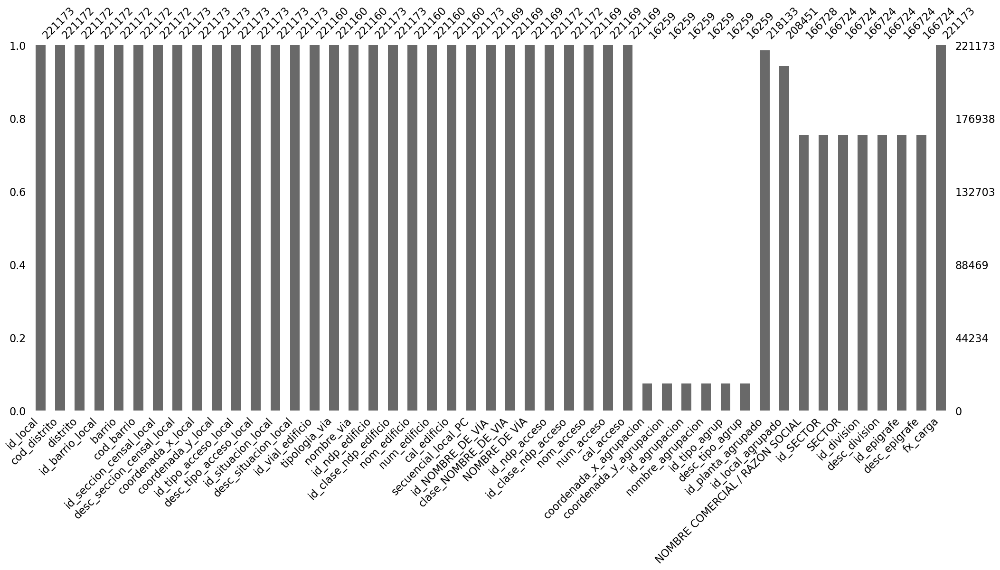

In [89]:
msno.bar(df_act_economica1)

In [90]:
nuevos_nombres_economica= {
    "fx_carga":"fecha_carga",
    "id_SECTOR":"id_sector",
    "SECTOR":"sector",
"NOMBRE COMERCIAL / RAZÓN SOCIAL":"nombre_comercial/razon_social"
}
df_act_economica_nuevo= df_act_economica_nuevo.rename(columns=nuevos_nombres_economica)

In [91]:
df_act_economica_nuevo.head(3)

,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,tipologia_via,nombre_via,nombre_comercial/razon_social,id_sector,sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga
0,1.0,CENTRO,104.0,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276
1,1.0,CENTRO,106.0,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276
2,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,EMBAJADORES ...,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276


<Axes: >

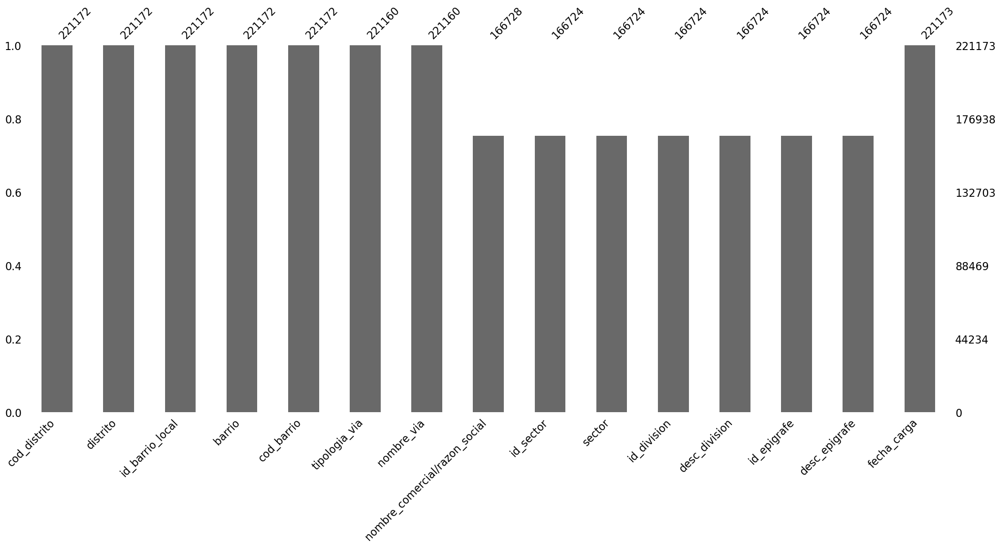

In [92]:
msno.bar(df_act_economica_nuevo)

In [93]:
# Aqui despues de ver el grafico no nos serviran los datos que no tengan en que sector pertenecen, asi que eliminaremos todos esos nulos para solo 
# dejar con los que verdaderamente podremos trabajar.

df_act_economica_nuevo=df_act_economica_nuevo.dropna(subset="id_sector")

In [94]:
df_act_economica_nuevo.shape

(166724, 15)

<Axes: >

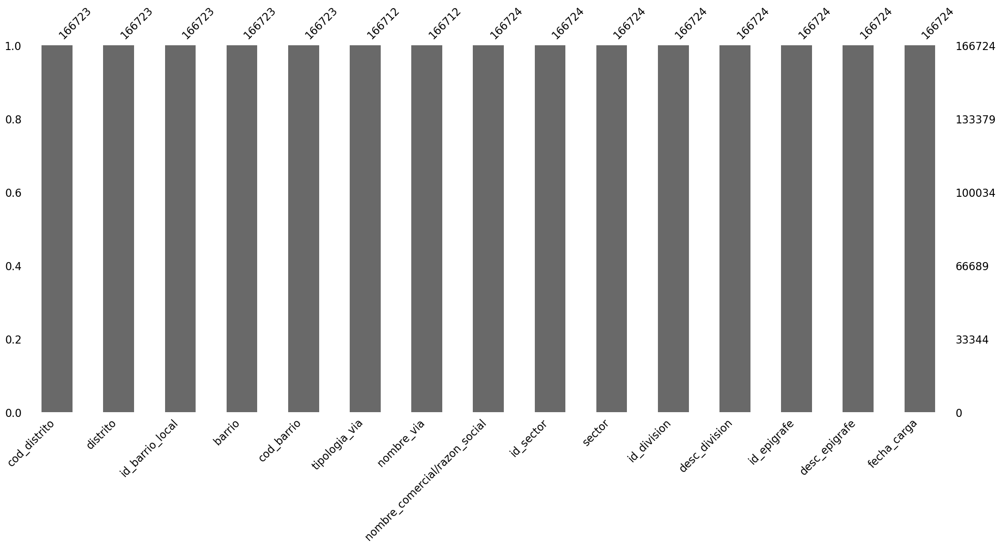

In [95]:
msno.bar(df_act_economica_nuevo)

In [96]:
df_act_economica_nuevo["sector"].value_counts()

sector
COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS     53505
HOSTELERÍA                                                                                28414
OTROS SERVICIOS                                                                           16656
ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES                                         10515
ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS                                         10379
ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES                                             8791
EDUCACIÓN                                                                                  6552
TRANSPORTE Y ALMACENAMIENTO                                                                4525
INDUSTRIA MANUFACTURERA                                                                    4358
ACTIVIDADES ARTÍSTICAS, RECREATIVAS Y DE ENTRETENIMIENTO                                   3981
CONSTRUCCIÓN                     

In [97]:
df_act_economica_nuevo["desc_division"].value_counts()

desc_division
COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS                     45591
SERVICIOS DE COMIDAS Y BEBIDAS                                                          22322
OTROS SERVICIOS PERSONALES                                                              11645
ACTIVIDADES ADMINISTRATIVAS DE OFICINA Y OTRAS ACTIVIDADES AUXILIARES A LAS EMPRESAS     8560
ACTIVIDADES SANITARIAS                                                                   7500
                                                                                        ...  
INDUSTRIA DEL TABACO                                                                        3
SILVICULTURA Y EXPLOTACIÓN FORESTAL                                                         3
ACTIVIDADES DE APOYO A LAS INDUSTRIAS EXTRACTIVAS                                           2
EXTRACCIÓN DE MINERALES METÁLICOS                                                           1
COQUERÍAS Y REFINO DE PETRÓLEO                

In [98]:
df_act_economica_nuevo["desc_epigrafe"].value_counts()

desc_epigrafe
ACTIVIDADES ADMINISTRATIVAS Y AUXILIARES DE OFICINA Y SERVICIOS DE REPROGRAFIA    8249
SERVICIO DE PELUQUERIA                                                            5826
BAR RESTAURANTE                                                                   4790
BAR CON COCINA                                                                    4543
COMERCIO AL POR MENOR DE PRENDAS DE VESTIR EN ESTABLECIMIENTOS ESPECIALIZADOS     4203
                                                                                  ... 
PISCINA PRIVADA DE TEMPORADA                                                         1
PISCINAS PUBLICAS CLIMATIZADAS/TEMPORADA                                             1
EXTRACCION DE MINERALES METALICOS                                                    1
PISCINA PRIVADA CLIMATIZADA                                                          1
ELABORACION Y ENVASADO DE HUEVOS                                                     1
Name: count, Length: 455, dty

In [99]:
# Vamos a filtrar los valores que son SIN ACTIVIDAD para ver si los podemos salvar de alguna forma.

# Filtrar el dataframe para obtener las filas donde el sector es "SIN ACTIVIDAD"
sin_actividad = df_act_economica_nuevo[df_act_economica_nuevo['sector'] == 'SIN ACTIVIDAD']

# Seleccionar las columnas 'desc_epigrafe' y 'desc_division' de las filas filtradas
resultados = sin_actividad[['desc_epigrafe', 'desc_division']]

# Mostrar los resultados
resultados

,desc_epigrafe,desc_division
277,"PTE. CODIFICAR (ACTIV. EMPRESARIALES:INDUST,CO...",SIN ACTIVIDAD PTE. DE CODIFICAR
311,"PTE. CODIFICAR (ACTIV. EMPRESARIALES:INDUST,CO...",SIN ACTIVIDAD PTE. DE CODIFICAR
462,LOCAL SIN ACTIVIDAD,SIN ACTIVIDAD
464,LOCAL SIN ACTIVIDAD,SIN ACTIVIDAD
588,LOCAL SIN ACTIVIDAD,SIN ACTIVIDAD
...,...,...
220831,LOCAL SIN ACTIVIDAD,SIN ACTIVIDAD
220850,LOCAL SIN ACTIVIDAD,SIN ACTIVIDAD
220862,LOCAL SIN ACTIVIDAD,SIN ACTIVIDAD
220902,LOCAL SIN ACTIVIDAD,SIN ACTIVIDAD


In [100]:
resultados.value_counts()

desc_epigrafe                                                                  desc_division                  
LOCAL SIN ACTIVIDAD                                                            SIN ACTIVIDAD                      3645
PTE. CODIFICAR (ACTIV. EMPRESARIALES:INDUST,COMERCIAL,DE SERVICIOS Y MINERAS)  SIN ACTIVIDAD PTE. DE CODIFICAR      23
PTE. CODIFICAR (OTROS PROF. RELACIONADOS CON SERVICIOS)                        SIN ACTIVIDAD PTE. DE CODIFICAR       4
Name: count, dtype: int64

In [101]:
df_act_economica_nuevo= df_act_economica_nuevo[df_act_economica_nuevo["sector"]!="SIN ACTIVIDAD"]

In [102]:
df_act_economica_nuevo.shape

(163052, 15)

In [103]:
df_act_economica_nuevo["sector"].value_counts()

sector
COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS     53505
HOSTELERÍA                                                                                28414
OTROS SERVICIOS                                                                           16656
ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES                                         10515
ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS                                         10379
ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES                                             8791
EDUCACIÓN                                                                                  6552
TRANSPORTE Y ALMACENAMIENTO                                                                4525
INDUSTRIA MANUFACTURERA                                                                    4358
ACTIVIDADES ARTÍSTICAS, RECREATIVAS Y DE ENTRETENIMIENTO                                   3981
CONSTRUCCIÓN                     

In [104]:
df_act_economica_nuevo.head(3)

,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,tipologia_via,nombre_via,nombre_comercial/razon_social,id_sector,sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga
0,1.0,CENTRO,104.0,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276
1,1.0,CENTRO,106.0,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276
2,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,EMBAJADORES ...,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276


In [105]:
df_pequeñosnegocios.head(3)

,NOMBRE COMERCIAL / RAZÓN SOCIAL,SECTOR,NOMBRE DE VÍA,CÓDIGO POSTAL,barrio,cod_barrio,cod_barrio_2,distrito,cod_distrito,tipologia_via
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,ORENSE,28020,Cuatro Caminos,62.0,2.0,Tetuán,6.0,CL
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,FUENCARRAL,28010,Trafalgar,73.0,3.0,Chamberí,7.0,CL
2,12 ROOMS,HOTELES,NÚÑEZ DEL ARCE,28012,Embajadores,12.0,2.0,Centro,1.0,CL


In [106]:
nuevos_names={
    "NOMBRE COMERCIAL / RAZÓN SOCIAL":"nombre_comercial/razon_social",
    "SECTOR"                         :"sector",
    "NOMBRE DE VÍA"                  :"nombre_via",
    "CÓDIGO POSTAL"                  :"codigo_postal"
}
df_pequeñosnegocios=df_pequeñosnegocios.rename(columns=nuevos_names)

In [107]:
df_pequeñosnegocios.head(3)

,nombre_comercial/razon_social,sector,nombre_via,codigo_postal,barrio,cod_barrio,cod_barrio_2,distrito,cod_distrito,tipologia_via
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,ORENSE,28020,Cuatro Caminos,62.0,2.0,Tetuán,6.0,CL
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,FUENCARRAL,28010,Trafalgar,73.0,3.0,Chamberí,7.0,CL
2,12 ROOMS,HOTELES,NÚÑEZ DEL ARCE,28012,Embajadores,12.0,2.0,Centro,1.0,CL


In [108]:
df_act_economica_nuevo.head(3)

,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,tipologia_via,nombre_via,nombre_comercial/razon_social,id_sector,sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga
0,1.0,CENTRO,104.0,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276
1,1.0,CENTRO,106.0,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276
2,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,EMBAJADORES ...,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276


In [109]:
# df_act_economica_nuevo["codigo_postal"]=np.nan           Modificar esta linea si da error al volver a cargar.

# Vamos a asignarles los valores  a la columna codigo_postal tomando en cuenta los valores de bdcp_info. Ahora se modifico para que tambien 
# filtre sin importar los espacios entre las palabras.  

def limpiar_texto(texto):
    """
    Función para limpiar el texto: convertir a minúsculas, eliminar acentos, 
    eliminar espacios extra, caracteres especiales y quitar espacios entre palabras.
    """
    if isinstance(texto, str):
        # Convertir a minúsculas
        texto = texto.lower()
        # Eliminar acentos
        texto = unidecode(texto)
        # Eliminar caracteres especiales (dejando solo letras y números)
        texto = re.sub(r'[^a-zA-Z0-9\s]', '', texto)
        # Eliminar espacios extra
        texto = " ".join(texto.split())
        # Eliminar espacios entre palabras (ej. "Peña Grande" -> "peñagrande")
        texto = texto.replace(" ", "")
    return texto

def asignar_codigo_postal(df_original, df_referencia):
    """
    Función para asignar el código postal del dataframe de referencia a las filas del dataframe original
    basándose en la coincidencia exacta de los valores de 'barrio' en el dataframe original y 'nombre_barrio' en
    el dataframe de referencia.
    
    Parámetros:
    - df_original: DataFrame original con columna 'barrio' y 'codigo_postal'.
    - df_referencia: DataFrame de referencia con columnas 'nombre_barrio' y 'codigo_Postal'.
    
    Retorna:
    - DataFrame original con la columna 'codigo_postal' actualizada.
    """
    # Limpiamos y normalizamos los valores de las columnas 'barrio' y 'nombre_barrio'
    df_original['barrio_limpio'] = df_original['barrio'].apply(limpiar_texto)
    df_referencia['nombre_barrio_limpio'] = df_referencia['nombre_barrio'].apply(limpiar_texto)
    
    # Función para encontrar el código postal correspondiente
    def obtener_codigo_postal(barrio):
        barrio_limpio = limpiar_texto(barrio)
        
        # Buscar en la columna 'nombre_barrio_limpio' del dataframe de referencia
        match = df_referencia[df_referencia['nombre_barrio_limpio'] == barrio_limpio]
        
        if not match.empty:
            # Si encontramos coincidencia, devolver el código postal
            return match.iloc[0]['codigo_Postal']
        else:
            # Si no encontramos coincidencia, devolver NaN
            return pd.NA
    
    # Aplicamos la función para asignar el código postal
    df_original['codigo_postal'] = df_original['barrio'].apply(obtener_codigo_postal)
    
    # Eliminar columnas auxiliares
    df_original.drop(columns=['barrio_limpio'], inplace=True)
    df_referencia.drop(columns=['nombre_barrio_limpio'], inplace=True)
    
    return df_original

# Llamar a la función para asignar el código postal
df_act_economica_nuevo = asignar_codigo_postal(df_act_economica_nuevo, bdcp_info)

In [110]:
df_act_economica_nuevo.head()

,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,tipologia_via,nombre_via,nombre_comercial/razon_social,id_sector,sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga,codigo_postal
0,1.0,CENTRO,104.0,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276,28004
1,1.0,CENTRO,106.0,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276,28013
2,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,EMBAJADORES ...,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276,28012
3,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,DUQUE DE FERNAN NUÑEZ ...,CARNICERIA M LOPEZ,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2024-08-08 03:30:13.347624,28012
4,1.0,CENTRO,106.0,SOL,6.0,CALLE,ARENAL ...,EL PATIO,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",471902,COMERCIO AL POR MENOR DE PRODUCTOS DE PRECIO U...,2023-04-27 08:46:58.072276,28013


In [111]:
df_act_economica_nuevo.head(5)

,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,tipologia_via,nombre_via,nombre_comercial/razon_social,id_sector,sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga,codigo_postal
0,1.0,CENTRO,104.0,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276,28004
1,1.0,CENTRO,106.0,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276,28013
2,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,EMBAJADORES ...,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276,28012
3,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,DUQUE DE FERNAN NUÑEZ ...,CARNICERIA M LOPEZ,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2024-08-08 03:30:13.347624,28012
4,1.0,CENTRO,106.0,SOL,6.0,CALLE,ARENAL ...,EL PATIO,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",471902,COMERCIO AL POR MENOR DE PRODUCTOS DE PRECIO U...,2023-04-27 08:46:58.072276,28013


In [112]:
df_act_economica_nuevo["codigo_postal"].value_counts()

codigo_postal
28015    7436
28001    6676
28013    6155
28020    5910
28021    5858
28027    5840
28037    5669
28025    5447
28002    5043
28012    4611
28010    4467
28006    4379
28019    4028
28047    3665
28016    3554
28028    3546
28029    3341
28039    3290
28003    3099
28004    3073
28045    3025
28041    3005
28018    2957
28007    2894
28026    2727
28053    2651
28011    2650
28017    2619
28033    2531
28043    2508
28030    2504
28005    2456
28034    2305
28014    2205
28009    2192
28042    2055
28008    1892
28055    1868
28035    1787
28038    1603
28031    1482
28044    1375
28023    1354
28040    1120
28046    1055
28024     733
28032     705
28049     632
28048     165
Name: count, dtype: int64

In [113]:
df_act_economica_nuevo["codigo_postal"].isna().sum()

10910

In [114]:
barrios_sin_codigo_postal = df_act_economica_nuevo[df_act_economica_nuevo['codigo_postal'].isna()]
barrios_sin_codigo_postal["barrio"].value_counts()

barrio
CASCO H.VALLECAS        3183
EL PILAR                2039
PALOS DE LA FRONTERA    1717
CASCO H.VICALVARO       1338
LOS JERONIMOS            761
COSTILLARES              737
CASCO H.BARAJAS          458
EL SALVADOR              371
AMPOSTA                  305
Name: count, dtype: int64

In [115]:
barrios_sin_codigo_postal = df_act_economica_nuevo[df_act_economica_nuevo['codigo_postal'].isna()]
barrios_sin_codigo_postal["barrio"].value_counts()

barrio
CASCO H.VALLECAS        3183
EL PILAR                2039
PALOS DE LA FRONTERA    1717
CASCO H.VICALVARO       1338
LOS JERONIMOS            761
COSTILLARES              737
CASCO H.BARAJAS          458
EL SALVADOR              371
AMPOSTA                  305
Name: count, dtype: int64

In [116]:
barrios_sin_codigo_postal = df_act_economica_nuevo[df_act_economica_nuevo['codigo_postal'].isna()]
barrios_sin_codigo_postal["barrio"].value_counts()

barrio
CASCO H.VALLECAS        3183
EL PILAR                2039
PALOS DE LA FRONTERA    1717
CASCO H.VICALVARO       1338
LOS JERONIMOS            761
COSTILLARES              737
CASCO H.BARAJAS          458
EL SALVADOR              371
AMPOSTA                  305
Name: count, dtype: int64

In [117]:
def asignar_codigo_postal_especifico(df_act_economica_nuevo, bdcp_info):
    """
    Asigna el código postal correspondiente a los barrios específicos:
    'CASCO H.VALLECAS' -> 'Casco Histórico de Vallecas'
    'CASCO H.VICALVARO' -> 'Casco Histórico de Vicálvaro'
    
    Parámetros:
    - df_act_economica_nuevo: DataFrame original con la columna 'barrio' y 'codigo_postal'.
    - bdcp_info: DataFrame de referencia con las columnas 'nombre_barrio' y 'codigo_Postal'.
    
    Retorna:
    - DataFrame original con la columna 'codigo_postal' actualizada para los barrios específicos.
    """
    # Limpiar y normalizar los valores
    df_act_economica_nuevo['barrio_limpio'] = df_act_economica_nuevo['barrio'].apply(limpiar_texto)
    bdcp_info['nombre_barrio_limpio'] = bdcp_info['nombre_barrio'].apply(limpiar_texto)
    
    # Diccionario con los mapeos de los barrios específicos
    mapeo_barrio = {
        "cascovalleycas": "cascohistoricodevallecas",
        "cascovicalvaro": "cascohistoricodevicalvaro"
    }
    
    # Asignar el código postal solo para los barrios específicos
    def asignar_codigo_postal(barrio):
        barrio_limpio = limpiar_texto(barrio)
        
        if barrio_limpio in mapeo_barrio:
            # Buscar el barrio limpio en el dataframe de referencia
            match = bdcp_info[bdcp_info['nombre_barrio_limpio'] == mapeo_barrio[barrio_limpio]]
            if not match.empty:
                return match.iloc[0]['codigo_Postal']
        return pd.NA  # Si no coincide con los valores especificados
    
    # Aplicar la asignación
    df_act_economica_nuevo['codigo_postal'] = df_act_economica_nuevo['barrio'].apply(asignar_codigo_postal)
    
    # Eliminar la columna auxiliar
    df_act_economica_nuevo.drop(columns=['barrio_limpio'], inplace=True)
    bdcp_info.drop(columns=['nombre_barrio_limpio'], inplace=True)
    

In [118]:
df_act_economica_nuevo.head()

,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,tipologia_via,nombre_via,nombre_comercial/razon_social,id_sector,sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga,codigo_postal
0,1.0,CENTRO,104.0,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276,28004
1,1.0,CENTRO,106.0,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276,28013
2,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,EMBAJADORES ...,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276,28012
3,1.0,CENTRO,102.0,EMBAJADORES,2.0,CALLE,DUQUE DE FERNAN NUÑEZ ...,CARNICERIA M LOPEZ,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2024-08-08 03:30:13.347624,28012
4,1.0,CENTRO,106.0,SOL,6.0,CALLE,ARENAL ...,EL PATIO,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",471902,COMERCIO AL POR MENOR DE PRODUCTOS DE PRECIO U...,2023-04-27 08:46:58.072276,28013


In [119]:
df_act_economica_nuevo["id_barrio_local"].value_counts()

id_barrio_local
102.0     4611
105.0     3878
401.0     3827
602.0     3807
106.0     3295
          ... 
1402.0     118
1903.0     105
2002.0     101
1508.0      58
802.0       30
Name: count, Length: 131, dtype: int64

In [120]:
df_act_economica_nuevo["barrio"]

0         JUSTICIA            
1         SOL                 
2         EMBAJADORES         
3         EMBAJADORES         
4         SOL                 
                  ...         
221165    CASCO H.VALLECAS    
221166    CASCO H.VALLECAS    
221167    CASCO H.VALLECAS    
221168    CUATRO CAMINOS      
221169    CUATRO CAMINOS      
Name: barrio, Length: 163052, dtype: object

In [121]:
df_act_economica_nuevo["id_barrio_local"].isna().sum()

1

In [122]:
df_act_economica_nuevo= df_act_economica_nuevo.dropna(subset=["id_barrio_local"])

In [123]:
df_act_economica_nuevo["id_barrio_local"].isna().sum()

0

In [124]:
def eliminar_un_cero(df, columna):
    """
    Elimina solo un cero de cada valor en la columna especificada del dataframe.
    
    Parámetros:
    - df: DataFrame en el que se va a realizar la operación.
    - columna: Nombre de la columna en la que se eliminará un cero por valor.
    
    Retorna:
    - DataFrame con la columna actualizada.
    """
    def eliminar_cero(valor):
        if isinstance(valor, str) and '0' in valor:
            # Eliminar el primer cero encontrado
            return valor.replace('0', '', 1)
        elif isinstance(valor, (int, float)):
            # Convertir a cadena para manejar el caso de números
            valor_str = str(int(valor))
            if '0' in valor_str:
                return int(valor_str.replace('0', '', 1))
        return valor  # Si no contiene ceros, retornar tal cual
    
    df[columna] = df[columna].apply(eliminar_cero)
    return df

# Aplicamos la función al dataframe y la columna específica
df_act_economica_nuevo = eliminar_un_cero(df_act_economica_nuevo, 'id_barrio_local')

In [125]:
df_act_economica_nuevo

,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,tipologia_via,nombre_via,nombre_comercial/razon_social,id_sector,sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga,codigo_postal
0,1.0,CENTRO,14,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276,28004
1,1.0,CENTRO,16,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276,28013
2,1.0,CENTRO,12,EMBAJADORES,2.0,CALLE,EMBAJADORES ...,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276,28012
3,1.0,CENTRO,12,EMBAJADORES,2.0,CALLE,DUQUE DE FERNAN NUÑEZ ...,CARNICERIA M LOPEZ,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2024-08-08 03:30:13.347624,28012
4,1.0,CENTRO,16,SOL,6.0,CALLE,ARENAL ...,EL PATIO,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",471902,COMERCIO AL POR MENOR DE PRODUCTOS DE PRECIO U...,2023-04-27 08:46:58.072276,28013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221165,18.0,VILLA DE VALLECAS,181,CASCO H.VALLECAS,1.0,CALLE,CUARENTA Y UNO MERCAMADRID ...,FRUTAS NIQUI MADRID IMPORT J3.B,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,46.0,COMERCIO AL POR MAYOR E INTERMEDIARIOS DEL COM...,463102.0,ALMACEN Y DISTRIBUCION DE FRUTAS Y HORTALIZAS ...,2023-04-27 08:47:43.473268,<NA>
221166,18.0,VILLA DE VALLECAS,181,CASCO H.VALLECAS,1.0,AVENIDA,VILLA DE VALLECAS MERCAMADRID ...,ASPY PREVENCIÓN [J4] [ZONA A],K,ACTIVIDADES FINANCIERAS Y DE SEGUROS,65.0,"SEGUROS, REASEGUROS Y FONDOS DE PENSIONES, EXC...",651001.0,SEGUROS,2023-04-27 08:47:43.473268,<NA>
221167,18.0,VILLA DE VALLECAS,181,CASCO H.VALLECAS,1.0,AVENIDA,VILLA DE VALLECAS MERCAMADRID ...,ASEPEYO [J4] [ZONA B],Q,ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES,86.0,ACTIVIDADES SANITARIAS,861002.0,CLINICAS MEDICAS,2023-04-27 08:47:43.473268,<NA>
221168,6.0,TETUAN,62,CUATRO CAMINOS,2.0,AVENIDA,GENERAL PERON ...,ALQUILER VEHICULOS APARCAMIENTO PÚBLICO,N,ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES,77.0,ACTIVIDADES DE ALQUILER,771001.0,ALQUILER DE VEHICULOS DE MOTOR,2023-04-27 08:47:43.988912,28020


In [126]:
def completar_codigo_postal(df_original, df_referencia):
    """
    Completa los valores nulos en la columna 'codigo_postal' del dataframe original
    usando los valores de la columna 'codigo_Postal' del dataframe de referencia,
    basado en coincidencias exactas entre 'id_barrio_local' del original y 'cod_barrio' del de referencia.
    
    Parámetros:
    - df_original: DataFrame original con columnas 'id_barrio_local' y 'codigo_postal'.
    - df_referencia: DataFrame de referencia con columnas 'cod_barrio' y 'codigo_Postal'.
    
    Retorna:
    - Un nuevo DataFrame con la columna 'codigo_postal' actualizada.
    """
    # Crear una copia del dataframe original para trabajar
    df_resultado = df_original.copy()

    # Crear un diccionario para acceso rápido a los códigos postales del dataframe de referencia
    mapa_codigos = dict(zip(df_referencia['cod_barrio'], df_referencia['codigo_Postal']))

    # Función para actualizar el valor de 'codigo_postal'
    def actualizar_codigo_postal(row):
        if pd.isna(row['codigo_postal']):  # Verificar si es nulo
            return mapa_codigos.get(row['id_barrio_local'], row['codigo_postal'])
        return row['codigo_postal']

    # Aplicar la función fila por fila
    df_resultado['codigo_postal'] = df_resultado.apply(actualizar_codigo_postal, axis=1)

    return df_resultado

df_act_economica_mod = completar_codigo_postal(df_act_economica_nuevo, bdcp_info)


In [127]:
df_act_economica_mod["codigo_postal"].isna().sum()

0

In [128]:
df_act_economica_mod.head(2)

,cod_distrito,distrito,id_barrio_local,barrio,cod_barrio,tipologia_via,nombre_via,nombre_comercial/razon_social,id_sector,sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga,codigo_postal
0,1.0,CENTRO,14,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276,28004
1,1.0,CENTRO,16,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276,28013


In [129]:
df_act_economica_mod = df_act_economica_mod.rename(columns={"id_barrio_local":"cod_barrio","cod_barrio":"cod_barrio_2"})

In [130]:
df_act_economica_mod.isna().sum()

cod_distrito                      0
distrito                          0
cod_barrio                        0
barrio                            0
cod_barrio_2                      0
tipologia_via                    11
nombre_via                       11
nombre_comercial/razon_social     0
id_sector                         0
sector                            0
id_division                       0
desc_division                     0
id_epigrafe                       0
desc_epigrafe                     0
fecha_carga                       0
codigo_postal                     0
dtype: int64

In [131]:
df_pequeñosnegocios["tipologia_via"].unique()

array(['CL', 'DOCTOR', 'CTRA', 'PZ', 'AV', 'BU', 'PO', 'COSTANILLA',
       'CALLEJÓN', 'CTRA.', 'RONDA', 'RAFAEL', 'CAMINO', 'MANUEL',
       'PASAJE', 'MARTINEZ', 'CUESTA', 'SALAS', 'PRINCIPE', 'GTA', 'GTA.',
       'TRAVESIA', 'AV.', 'CARRETERA', 'Pº', 'RD', 'GT', 'LUIS',
       'AGUSTIN', 'PZ.', 'PLAZA', 'TORRES', 'GENERAL', 'LATINA', 'ALONSO',
       'MCDO'], dtype=object)

In [132]:
df_act_economica_mod["tipologia_via"].unique()

array(['CALLE                   ', 'PLAZA                   ',
       'PASEO                   ', 'CARRERA                 ',
       'RONDA                   ', 'AVENIDA                 ',
       'TRAVESIA                ', 'CUESTA                  ',
       'COSTANILLA              ', 'CALLEJON                ',
       'GLORIETA                ', 'CARRETERA               ',
       'AUTOVIA                 ', 'PISTA                   ',
       'CAMINO                  ', nan, 'PASAJE                  ',
       'BULEVAR                 ', 'PLAZUELA                ',
       'PARTICULAR              ', 'PASADIZO                ',
       'CAÑADA                  ', 'COLONIA                 ',
       'GALERIA                 '], dtype=object)

In [133]:
# Aqui hay un reemplazamiento multiple de valores. Tambien pude haber hecho un diccionario y colocarlos directamente al metodo 
# .replace

df_pequeñosnegocios= df_pequeñosnegocios.replace("CL","CALLE",regex=True)

df_pequeñosnegocios= df_pequeñosnegocios.replace("AV","AVENIDA",regex=True)
df_pequeñosnegocios= df_pequeñosnegocios.replace("AV.","AVENIDA",regex=True)

df_pequeñosnegocios= df_pequeñosnegocios.replace("CTRA.","CARRETERA",regex=True)
df_pequeñosnegocios= df_pequeñosnegocios.replace("CTRA","CARRETERA",regex=True)

df_pequeñosnegocios= df_pequeñosnegocios.replace("PZ.","PLAZA",regex=True)
df_pequeñosnegocios= df_pequeñosnegocios.replace("PZ","PLAZA",regex=True)

df_pequeñosnegocios= df_pequeñosnegocios.replace("PO","PASEO",regex=True)
df_pequeñosnegocios= df_pequeñosnegocios.replace("Pº","PASEO",regex=True)

df_pequeñosnegocios= df_pequeñosnegocios.replace("GTA.","GLORIETA",regex=True)
df_pequeñosnegocios= df_pequeñosnegocios.replace("GTA","GLORIETA",regex=True)
df_pequeñosnegocios= df_pequeñosnegocios.replace("GT","GLORIETA",regex=True)

df_pequeñosnegocios= df_pequeñosnegocios.replace("RD","RONDA",regex=True)

df_pequeñosnegocios= df_pequeñosnegocios.replace("BU","BULEVAR",regex=True)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15508\729299675.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_pequeñosnegocios= df_pequeñosnegocios.replace("CL","CALLE",regex=True)


In [134]:
df_pequeñosnegocios["tipologia_via"].unique()

array(['CALLE', 'DOCTOR', 'CARRETERA', 'PLAZA', 'AVENIDANIDA', 'BULEVAR',
       'PASEO', 'COSTANILLA', 'CALLEJÓN', 'RONDA', 'RAFAEL', 'CAMINO',
       'MANUEL', 'PASAJE', 'MARTINEZ', 'CUESTA', 'SALAS', 'PRINCIPE',
       'GLORIETA', 'TRAVENIDANIDAESIA', 'AVENIDANIDA.', 'LUIS', 'AGUSTIN',
       'TORRES', 'GENERAL', 'LATINA', 'ALONSO', 'MCDO'], dtype=object)

In [135]:
df_pequeñosnegocios.head(2)

,nombre_comercial/razon_social,sector,nombre_via,codigo_postal,barrio,cod_barrio,cod_barrio_2,distrito,cod_distrito,tipologia_via
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,ORENSE,28020,Cuatro Caminos,62.0,2.0,Tetuán,6.0,CALLE
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,FUENCARRAL,28010,Trafalgar,73.0,3.0,Chamberí,7.0,CALLE


<Axes: xlabel='0'>

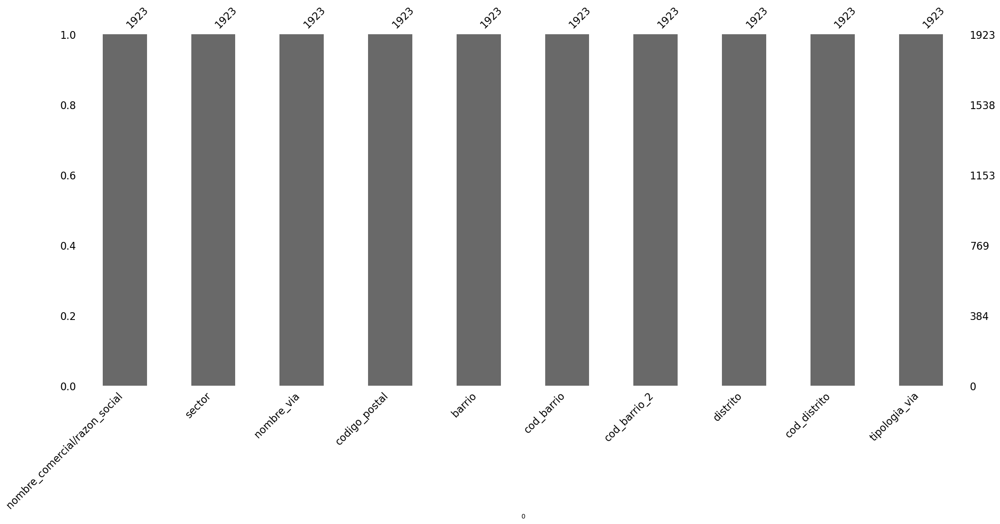

In [136]:
msno.bar(df_pequeñosnegocios)

In [137]:
df_act_economica_mod.head(2)

,cod_distrito,distrito,cod_barrio,barrio,cod_barrio_2,tipologia_via,nombre_via,nombre_comercial/razon_social,id_sector,sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga,codigo_postal
0,1.0,CENTRO,14,JUSTICIA,4.0,CALLE,AUGUSTO FIGUEROA ...,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276,28004
1,1.0,CENTRO,16,SOL,6.0,PLAZA,MAYOR ...,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276,28013


In [138]:
df_act_economica_mod.shape

(163051, 16)

In [139]:
df_pequeñosnegocios.shape

(1923, 10)

<Axes: >

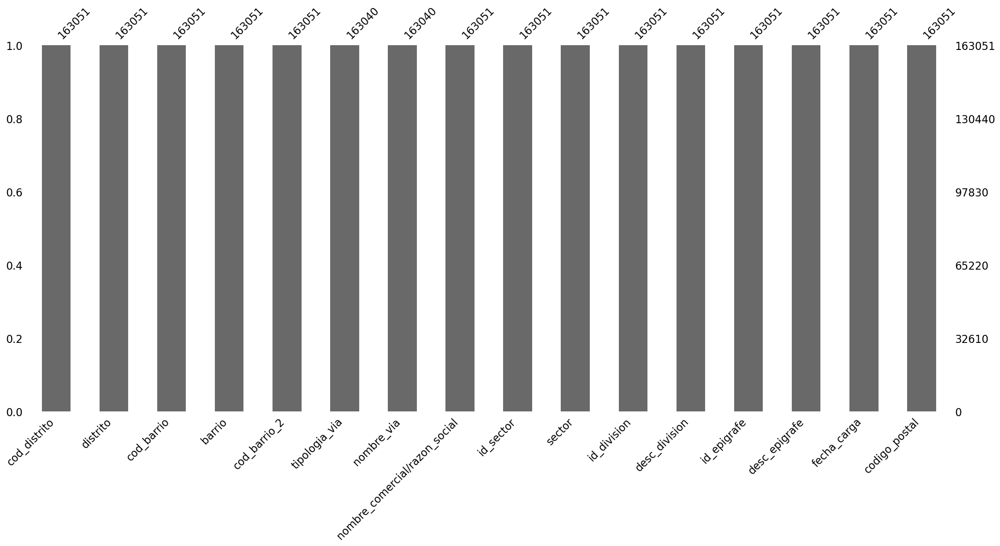

In [140]:
msno.bar(df_act_economica_mod)

In [141]:
act_eco_df_pequeñosnegocios= pd.concat([df_pequeñosnegocios,df_act_economica_mod],ignore_index=True)

In [142]:
act_eco_df_pequeñosnegocios.shape

(164974, 16)

In [143]:
act_eco_df_pequeñosnegocios=act_eco_df_pequeñosnegocios.drop_duplicates(keep= "first", ignore_index=True)

In [144]:
act_eco_df_pequeñosnegocios.shape

(160432, 16)

In [145]:
act_eco_df_pequeñosnegocios

,nombre_comercial/razon_social,sector,nombre_via,codigo_postal,barrio,cod_barrio,cod_barrio_2,distrito,cod_distrito,tipologia_via,id_sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,ORENSE,28020,Cuatro Caminos,62.0,2.0,Tetuán,6.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,FUENCARRAL,28010,Trafalgar,73.0,3.0,Chamberí,7.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
2,12 ROOMS,HOTELES,NÚÑEZ DEL ARCE,28012,Embajadores,12.0,2.0,Centro,1.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
3,A & J ZAPATOS,CALZADO,TIMOTEO DOMINGO,28017,Pueblo Nuevo,152.0,2.0,Ciudad Lineal,15.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
4,A SU MEDIDA,TINTORERÍAS Y LAVENIDANIDAANDERÍAS,ZARAGOZA,28012,Embajadores,12.0,2.0,Centro,1.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160427,HIPERUSERA MERCAMADRID G.3.3,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,VILLA DE VALLECAS MERCAMADRID ...,28031,CASCO H.VALLECAS,181.0,1.0,VILLA DE VALLECAS,18.0,AVENIDA,G,46.0,COMERCIO AL POR MAYOR E INTERMEDIARIOS DEL COM...,463905.0,ALMACEN DE DISTRIBUCION POLIVALENTE A TEMPERAT...,2023-04-27 08:47:43.473268
160428,FRUTAS NIQUI MADRID IMPORT J3.B,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,CUARENTA Y UNO MERCAMADRID ...,28031,CASCO H.VALLECAS,181.0,1.0,VILLA DE VALLECAS,18.0,CALLE,G,46.0,COMERCIO AL POR MAYOR E INTERMEDIARIOS DEL COM...,463102.0,ALMACEN Y DISTRIBUCION DE FRUTAS Y HORTALIZAS ...,2023-04-27 08:47:43.473268
160429,ASPY PREVENCIÓN [J4] [ZONA A],ACTIVIDADES FINANCIERAS Y DE SEGUROS,VILLA DE VALLECAS MERCAMADRID ...,28031,CASCO H.VALLECAS,181.0,1.0,VILLA DE VALLECAS,18.0,AVENIDA,K,65.0,"SEGUROS, REASEGUROS Y FONDOS DE PENSIONES, EXC...",651001.0,SEGUROS,2023-04-27 08:47:43.473268
160430,ASEPEYO [J4] [ZONA B],ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES,VILLA DE VALLECAS MERCAMADRID ...,28031,CASCO H.VALLECAS,181.0,1.0,VILLA DE VALLECAS,18.0,AVENIDA,Q,86.0,ACTIVIDADES SANITARIAS,861002.0,CLINICAS MEDICAS,2023-04-27 08:47:43.473268


--------------------------------------------------------------------------------------------------------------------------------------------------------

## **Segunda Union**

##### **_concesionesquioscos2023 y locales202411_**


##### **_df_concesion_quioscos  /  df_locales2024_**

### **Lectura de datos**

In [146]:
df_concesion_quioscos=      pd.read_excel("concesionesquioscos2023.xlsx")
df_locales2024=             pd.read_csv("locales202411.csv",sep=";")

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15508\3778184583.py:2: DtypeWarning: Columns (37) have mixed types. Specify dtype option on import or set low_memory=False.
  df_locales2024=             pd.read_csv("locales202411.csv",sep=";")


### **EDA/ Exploratory Data Analysis**

In [147]:
df_act_economica.equals(df_locales2024) 

False

In [148]:
df_act_economica.shape

(221173, 47)

In [149]:
df_locales2024.shape

(200909, 46)

In [150]:
# # Aqui estuve checando si los valores eran iguales convirtiendo algunos tipos de columnas y haciendo analisis de comparacion despues de eliminar la 
# # diferencia de columnas y filas. ...... Dio error despues de correrlo de nuevo, asi que comente todo. No inversion de tiempo extra innecesaria.

# df_act_economica['cod_postal'] = df_act_economica['cod_postal'].astype(str)
# df_locales2024['cod_postal'] = df_locales2024['cod_postal'].astype(str)

# # Ajustar columnas
# missing_cols_in_df_act = [col for col in df_locales2024.columns if col not in df_act_economica.columns]
# missing_cols_in_df_locales = [col for col in df_act_economica.columns if col not in df_locales2024.columns]

# # Agregar columnas faltantes con valores NaN
# for col in missing_cols_in_df_act:
#     df_act_economica[col] = pd.NA
# for col in missing_cols_in_df_locales:
#     df_locales2024[col] = pd.NA

# # Ordenar columnas para garantizar consistencia
# df_act_economica = df_act_economica[df_locales2024.columns]

# # Ajustar filas: encontrar la intersección de filas comunes
# common_rows = pd.merge(df_act_economica, df_locales2024, how='inner')

# # Comparar de nuevo después de ajustes
# are_equal = df_act_economica.equals(df_locales2024)


In [151]:
df_act_economica.head()

,id_local,id_distrito_local,desc_distrito_local,id_barrio_local,desc_barrio_local,cod_barrio_local,id_seccion_censal_local,desc_seccion_censal_local,coordenada_x_local,coordenada_y_local,id_tipo_acceso_local,desc_tipo_acceso_local,id_situacion_local,desc_situacion_local,id_vial_edificio,clase_vial_edificio,desc_vial_edificio,id_ndp_edificio,id_clase_ndp_edificio,nom_edificio,num_edificio,cal_edificio,secuencial_local_PC,id_vial_acceso,clase_vial_acceso,desc_vial_acceso,id_ndp_acceso,id_clase_ndp_acceso,nom_acceso,num_acceso,cal_acceso,coordenada_x_agrupacion,coordenada_y_agrupacion,id_agrupacion,nombre_agrupacion,id_tipo_agrup,desc_tipo_agrup,id_planta_agrupado,id_local_agrupado,rotulo,id_seccion,desc_seccion,id_division,desc_division,id_epigrafe,desc_epigrafe,fx_carga
0,10000097,1.0,CENTRO,104.0,JUSTICIA,4.0,1077.0,77,440851.6,4474857.5,1,Puerta Calle,1,Abierto,81800.0,CALLE,AUGUSTO FIGUEROA ...,11004589,1,NUM,37.0,,20,437400.0,CALLE,LIBERTAD ...,11004588.0,1.0,NUM,31.0,,NaN,NaN,NaN,NaN,NaN,NaN,1,02,"GRACIAS, PADRE",I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561001,RESTAURANTE,2023-04-27 08:46:58.072276
1,10000150,1.0,CENTRO,106.0,SOL,6.0,1121.0,121,440044.6,4474063.5,1,Puerta Calle,1,Abierto,498000.0,PLAZA,MAYOR ...,11007683,1,NUM,1.0,,10,498000.0,PLAZA,MAYOR ...,11007683.0,1.0,NUM,1.0,,NaN,NaN,NaN,NaN,NaN,NaN,1,04,CAFE LOS ARCOS BAR,I,HOSTELERÍA,56,SERVICIOS DE COMIDAS Y BEBIDAS,561005,BAR CON COCINA,2023-04-27 08:46:58.072276
2,10000224,1.0,CENTRO,102.0,EMBAJADORES,2.0,1035.0,35,0.0,0.0,0,Agrupado,1,Abierto,262000.0,CALLE,EMBAJADORES ...,11002143,1,NUM,41.0,,0,262000.0,CALLE,EMBAJADORES ...,11002143.0,1.0,NUM,41.0,,440295.6,4473246.5,99000057.0,MERCADO MUNICIPAL DE SAN FERNANDO,12.0,Mercado Municipal,1,01,PAIS DE LOS CEVICHES L01/ANTIGUO PUESTO 70,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2023-04-27 08:46:58.072276
3,10000226,1.0,CENTRO,102.0,EMBAJADORES,2.0,1059.0,59,0.0,0.0,0,Agrupado,4,Cerrado,253200.0,CALLE,DUQUE DE FERNAN NUÑEZ ...,20004950,1,NUM,4.0,,0,253200.0,CALLE,DUQUE DE FERNAN NUÑEZ ...,20004950.0,1.0,NUM,4.0,,440706.6,4473659.5,99000065.0,MERCADO MUNICIPAL ANTON MARTIN,12.0,Mercado Municipal,1,40,CARNICERIA M LOPEZ,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",472201,COMERCIO AL POR MENOR DE CARNICERIA,2024-08-08 03:30:13.347624
4,10000258,1.0,CENTRO,106.0,SOL,6.0,1123.0,123,440127.6,4474277.5,1,Puerta Calle,1,Abierto,68300.0,CALLE,ARENAL ...,11007805,1,NUM,7.0,,20,68300.0,CALLE,ARENAL ...,11007805.0,1.0,NUM,7.0,,NaN,NaN,NaN,NaN,NaN,NaN,1,02,EL PATIO,G,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,47,"COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE...",471902,COMERCIO AL POR MENOR DE PRODUCTOS DE PRECIO U...,2023-04-27 08:46:58.072276


<Axes: >

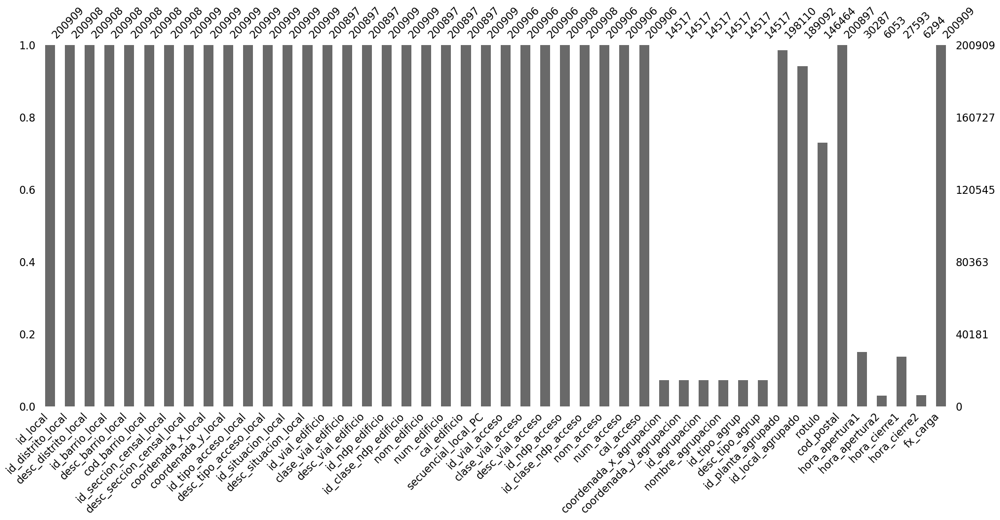

In [152]:
msno.bar(df_locales2024)

<Axes: >

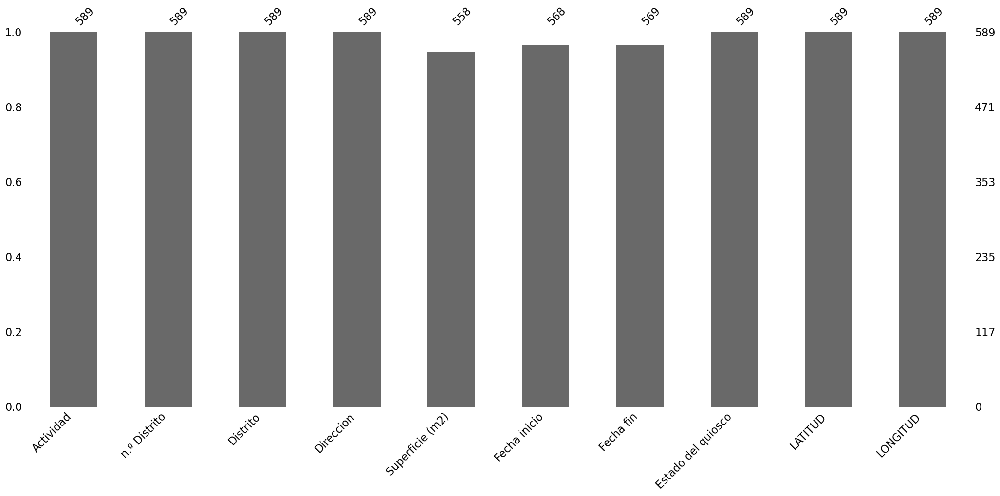

In [153]:
msno.bar(df_concesion_quioscos)

In [154]:
df_concesion_quioscos

,Actividad,n.º Distrito,Distrito,Direccion,Superficie (m2),Fecha inicio,Fecha fin,Estado del quiosco,LATITUD,LONGITUD
0,PRENSA,1,CENTRO,"ALCALÁ, 42",8,2000-03-15 00:00:00,2029-09-15 00:00:00,ABIERTO,40.418601,-3.696697
1,PRENSA,1,CENTRO,"ALCALÁ, 47 / BARQUILLO",7,2003-06-13 00:00:00,2033-06-13 00:00:00,ABIERTO,40.418987,-3.695639
2,PRENSA,1,CENTRO,"ALCALÁ, 50",6,2000-03-15 00:00:00,2029-09-15 00:00:00,ABIERTO,40.419369,-3.691525
3,PRENSA,1,CENTRO,"ATOCHA, 58",5.7,2003-03-20 00:00:00,2033-03-20 00:00:00,ABIERTO,40.412143,-3.698779
4,PRENSA,1,CENTRO,"ATOCHA, 80",3,2000-03-15 00:00:00,2029-09-15 00:00:00,ABIERTO,40.411199,-3.696918
...,...,...,...,...,...,...,...,...,...,...
584,PRENSA,21,BARAJAS,"AV CANTABRIA, 35",7.61,2014-09-15 00:00:00,2029-09-15 00:00:00,ABIERTO,40.457287,-3.587222
585,PRENSA,21,BARAJAS,"AV LOGROÑO, 361",5.93,2015-05-13 00:00:00,2040-05-04 00:00:00,CERRADO,40.475484,-3.582527
586,PRENSA,21,BARAJAS,"CL BALANDRO, 36",8.01,2014-09-15 00:00:00,2029-09-15 00:00:00,ABIERTO,40.454826,-3.589434
587,PRENSA,21,BARAJAS,"PO ALAMEDA DE OSUNA, 63",6.64,2014-09-15 00:00:00,2029-09-15 00:00:00,ABIERTO,40.456629,-3.591787


In [155]:
df_concesion_quioscos.duplicated().sum()

0

In [156]:
df_concesion_quiosco= df_concesion_quioscos.drop(columns=["Fecha inicio","Fecha fin","Estado del quiosco","LATITUD","LONGITUD",
                                                          "Superficie (m2)"])

In [157]:
df_concesion_quiosco

,Actividad,n.º Distrito,Distrito,Direccion
0,PRENSA,1,CENTRO,"ALCALÁ, 42"
1,PRENSA,1,CENTRO,"ALCALÁ, 47 / BARQUILLO"
2,PRENSA,1,CENTRO,"ALCALÁ, 50"
3,PRENSA,1,CENTRO,"ATOCHA, 58"
4,PRENSA,1,CENTRO,"ATOCHA, 80"
...,...,...,...,...
584,PRENSA,21,BARAJAS,"AV CANTABRIA, 35"
585,PRENSA,21,BARAJAS,"AV LOGROÑO, 361"
586,PRENSA,21,BARAJAS,"CL BALANDRO, 36"
587,PRENSA,21,BARAJAS,"PO ALAMEDA DE OSUNA, 63"


In [158]:
df_concesion_quiosco["Actividad"].value_counts()

Actividad
PRENSA               474
HOSTELERIA            63
LIBROS                29
TABACO Y LOTERIAS      6
TABACO                 6
TABACO Y TIMBRE        3
HOSTELERÍA             3
TABACO                 2
LOTERIAS               2
FLORES                 1
Name: count, dtype: int64

In [159]:
cambio_nombres_quiosco= {
    "Actividad":"sector",
    "n.º Distrito":"cod_distrito",
    "Distrito":"distrito",
    "Direccion":"nombre_via"
}
df_concesion_quiosco=df_concesion_quiosco.rename(columns=cambio_nombres_quiosco)

In [160]:
df_concesion_quiosco

,sector,cod_distrito,distrito,nombre_via
0,PRENSA,1,CENTRO,"ALCALÁ, 42"
1,PRENSA,1,CENTRO,"ALCALÁ, 47 / BARQUILLO"
2,PRENSA,1,CENTRO,"ALCALÁ, 50"
3,PRENSA,1,CENTRO,"ATOCHA, 58"
4,PRENSA,1,CENTRO,"ATOCHA, 80"
...,...,...,...,...
584,PRENSA,21,BARAJAS,"AV CANTABRIA, 35"
585,PRENSA,21,BARAJAS,"AV LOGROÑO, 361"
586,PRENSA,21,BARAJAS,"CL BALANDRO, 36"
587,PRENSA,21,BARAJAS,"PO ALAMEDA DE OSUNA, 63"


In [161]:
df_concesion_quiosco["tipologia_via"]= np.nan

In [162]:
df_concesion_quiosco["nombre_via"].value_counts()

nombre_via
ALCALÁ, 42                  1
OLIVA DE PLASENCIA, 1       1
Pº COMANDANTE FORTEA, 38    1
Pº PUERTA DEL ÁNGEL, 12     1
Pº PUERTA DEL ÁNGEL, 14     1
                           ..
PO CASTELLANA, 18           1
PO CASTELLANA, 2            1
PO MARQUES DE ZAFRA, 31     1
PZ AMERICA ESPAÑOLA, 2      1
PO DEL ZURRÓN, 14           1
Name: count, Length: 589, dtype: int64

In [163]:
# Definir el diccionario de abreviaturas y sus correspondientes descripciones en mayúsculas
abreviaturas = {
    'AV': 'AVENIDA',
    'AV.': 'AVENIDA',
    'CL': 'CALLE',
    'CTRA': 'CARRETERA',
    'CTRA.': 'CARRETERA',
    'PZ': 'PLAZA',
    'PZ.': 'PLAZA',
    'BU': 'BULEVAR',
    'PO': 'PASEO',
    'GTA': 'GLORIETA',
    'GTA.': 'GLORIETA',
    'Pº': 'PASEO',
    'RD': 'RONDA',
    'MCDO.': 'MERCADO'
}

# Función para asignar el tipo de vía y limpiar el texto de la abreviatura
def asignar_tipologia_via_y_limpiar(nombre_via):
    # Recorrer las abreviaturas y verificar si se encuentran en 'nombre_via'
    for abreviatura, tipologia in abreviaturas.items():
        if abreviatura in nombre_via:
            # Si se encuentra la abreviatura, la extraemos y asignamos la descripción
            # Eliminar la abreviatura del texto original
            nombre_via_limpio = nombre_via.replace(abreviatura, "").strip()
            return nombre_via_limpio, tipologia
    # Si no encuentra ninguna abreviatura, retorna el texto original y NaN
    return nombre_via, pd.NA

# Aplicar la función a la columna 'nombre_via' y crear las columnas 'tipologia_via' y 'nombre_via_limpio'
df_concesion_quiosco[['nombre_via_limpio', 'tipologia_via']] = df_concesion_quiosco['nombre_via'].apply(lambda x: pd.Series(asignar_tipologia_via_y_limpiar(x)))


In [164]:
df_concesion_quiosco["tipologia_via"].value_counts()

tipologia_via
CALLE       110
AVENIDA      91
PASEO        38
PLAZA        22
RONDA        12
GLORIETA      2
BULEVAR       1
Name: count, dtype: int64

In [165]:
df_concesion_quiosco.head(3)

,sector,cod_distrito,distrito,nombre_via,tipologia_via,nombre_via_limpio
0,PRENSA,1,CENTRO,"ALCALÁ, 42",<NA>,"ALCALÁ, 42"
1,PRENSA,1,CENTRO,"ALCALÁ, 47 / BARQUILLO",<NA>,"ALCALÁ, 47 / BARQUILLO"
2,PRENSA,1,CENTRO,"ALCALÁ, 50",<NA>,"ALCALÁ, 50"


In [166]:
df_concesion_quiosco["nombre_via_limpio"].value_counts()

nombre_via_limpio
ALCALÁ, 42               1
OLIVA DE PLASENCIA, 1    1
COMANDANTE FORTEA, 38    1
PUERTA DEL ÁNGEL, 12     1
PUERTA DEL ÁNGEL, 14     1
                        ..
CASTELLANA, 18           1
CASTELLANA, 2            1
MARQUES DE ZAFRA, 31     1
AMERICA ESPAÑOLA, 2      1
DEL ZURRÓN, 14           1
Name: count, Length: 589, dtype: int64

In [167]:
df_concesion_quiosco = df_concesion_quiosco.drop(columns=["nombre_via"])

In [168]:
df_concesion_quiosco = df_concesion_quiosco.rename(columns={"nombre_via_limpio":"nombre_via"})

In [169]:
act_eco_df_pequeñosnegocios.head(3)

,nombre_comercial/razon_social,sector,nombre_via,codigo_postal,barrio,cod_barrio,cod_barrio_2,distrito,cod_distrito,tipologia_via,id_sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,ORENSE,28020,Cuatro Caminos,62.0,2.0,Tetuán,6.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,FUENCARRAL,28010,Trafalgar,73.0,3.0,Chamberí,7.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
2,12 ROOMS,HOTELES,NÚÑEZ DEL ARCE,28012,Embajadores,12.0,2.0,Centro,1.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN


In [170]:
df_act_quiosco_pequeñosneg=pd.concat([act_eco_df_pequeñosnegocios,df_concesion_quiosco],ignore_index=True)

In [171]:
df_act_quiosco_pequeñosneg.duplicated().sum()

0

----

## **_Tercer Union_**


##### **_terrazas202411.csv con datos unidos hasta ahora_**

### **Lectura de datos**

In [172]:
df_fuentes=                 pd.read_csv("fuentesmascotas202411.csv", sep=";")
df_terrazas=                pd.read_csv("terrazas202411.csv",sep=";")

### **EDA/Exploratory Data Analysis**

In [173]:
df_terrazas.shape

(6467, 111)

<Axes: >

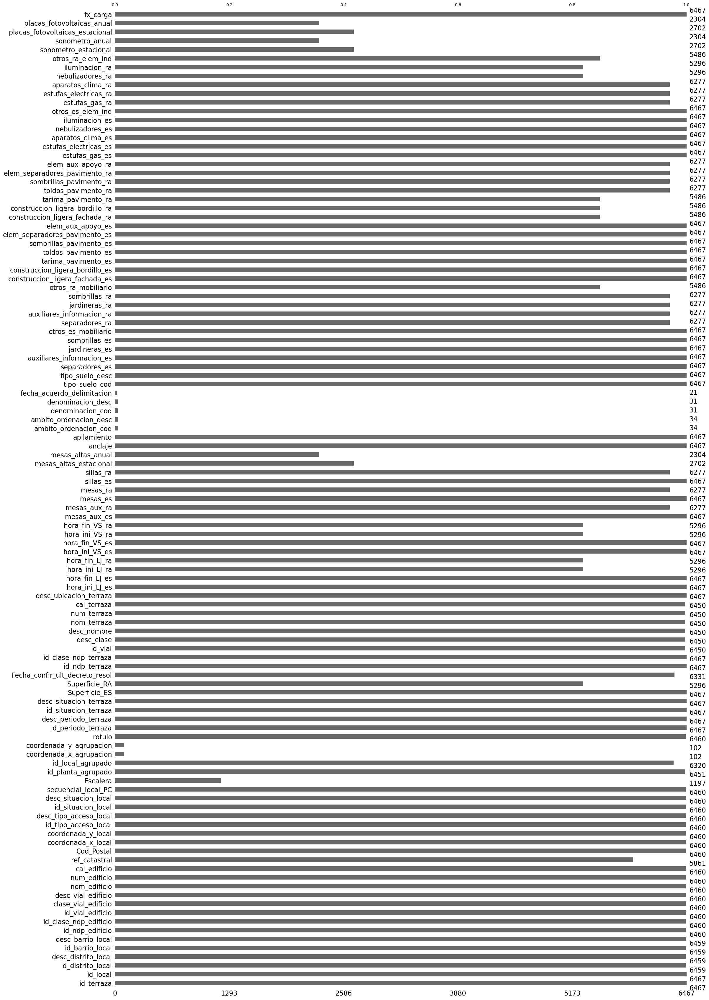

In [174]:
msno.bar(df_terrazas)

In [175]:
# df_act_quiosco_pequeñosneg.head(3)

In [176]:
df_terrazas.head()

,id_terraza,id_local,id_distrito_local,desc_distrito_local,id_barrio_local,desc_barrio_local,id_ndp_edificio,id_clase_ndp_edificio,id_vial_edificio,clase_vial_edificio,desc_vial_edificio,nom_edificio,num_edificio,cal_edificio,ref_catastral,Cod_Postal,coordenada_x_local,coordenada_y_local,id_tipo_acceso_local,desc_tipo_acceso_local,id_situacion_local,desc_situacion_local,secuencial_local_PC,Escalera,id_planta_agrupado,id_local_agrupado,coordenada_x_agrupacion,coordenada_y_agrupacion,rotulo,id_periodo_terraza,desc_periodo_terraza,id_situacion_terraza,desc_situacion_terraza,Superficie_ES,Superficie_RA,Fecha_confir_ult_decreto_resol,id_ndp_terraza,id_clase_ndp_terraza,id_vial,desc_clase,desc_nombre,nom_terraza,num_terraza,cal_terraza,desc_ubicacion_terraza,hora_ini_LJ_es,hora_fin_LJ_es,hora_ini_LJ_ra,hora_fin_LJ_ra,hora_ini_VS_es,hora_fin_VS_es,hora_ini_VS_ra,hora_fin_VS_ra,mesas_aux_es,mesas_aux_ra,mesas_es,mesas_ra,sillas_es,sillas_ra,mesas_altas_estacional,mesas_altas_anual,anclaje,apilamiento,ambito_ordenacion_cod,ambito_ordenacion_desc,denominacion_cod,denominacion_desc,fecha_acuerdo_delimitacion,tipo_suelo_cod,tipo_suelo_desc,separadores_es,auxiliares_informacion_es,jardineras_es,sombrillas_es,otros_es_mobiliario,separadores_ra,auxiliares_informacion_ra,jardineras_ra,sombrillas_ra,otros_ra_mobiliario,construccion_ligera_fachada_es,construccion_ligera_bordillo_es,tarima_pavimento_es,toldos_pavimento_es,sombrillas_pavimento_es,elem_separadores_pavimento_es,elem_aux_apoyo_es,construccion_ligera_fachada_ra,construccion_ligera_bordillo_ra,tarima_pavimento_ra,toldos_pavimento_ra,sombrillas_pavimento_ra,elem_separadores_pavimento_ra,elem_aux_apoyo_ra,estufas_gas_es,estufas_electricas_es,aparatos_clima_es,nebulizadores_es,iluminacion_es,otros_es_elem_ind,estufas_gas_ra,estufas_electricas_ra,aparatos_clima_ra,nebulizadores_ra,iluminacion_ra,otros_ra_elem_ind,sonometro_estacional,sonometro_anual,placas_fotovoltaicas_estacional,placas_fotovoltaicas_anual,fx_carga
0,34,270078567,4.0,SALAMANCA,404.0,GUINDALERA,11018555.0,1.0,35200.0,CALLE,ALONSO HEREDIA ...,NUM,25.0,,3065403VK4736E0001LJ,28028.0,442986.60,4476379.5,1.0,Puerta Calle,1.0,Abierto,10.0,NaN,1.0,04,NaN,NaN,BAR MARISQUERIA LUIS,1,Anual,1,Abierta,11.16,11.16,2014-04-04 10:03:37.793,11018555,1,35200.0,CALLE,ALONSO HEREDIA ...,NUM,25.0,,Calle peatonal,10:00:00,01:00:00,10:00:00,00:00:00,10:00:00,02:30:00,10:00:00,00:00:00,0,0.0,4,0.0,14,0.0,NaN,NaN,False,False,NaN,NaN,NaN,NaN,NaN,1,Suelo publico,0,0,0,2,False,0.0,0.0,0.0,0.0,False,False,False,False,0,0,0,0,False,False,False,0.0,0.0,0.0,0.0,0,0,0,0,0,False,0.0,0.0,0.0,0.0,0.0,False,NaN,NaN,NaN,NaN,2024-11-13 03:30:20.342264
1,36,40002021,4.0,SALAMANCA,404.0,GUINDALERA,11018545.0,1.0,10100.0,CALLE,AGUSTIN DURAN ...,NUM,10.0,,3165209VK4736E,28028.0,442972.60,4476350.5,1.0,Puerta Calle,1.0,Abierto,20.0,,1.0,,NaN,NaN,SAGAR,2,Estacional,1,Abierta,7.20,NaN,2014-04-07 09:03:47.69,11018548,1,35200.0,CALLE,ALONSO HEREDIA ...,NUM,22.0,,Calle peatonal,08:00:00,01:30:00,NaN,NaN,08:00:00,01:30:00,NaN,NaN,0,0.0,5,0.0,10,0.0,0.0,NaN,False,False,NaN,NaN,NaN,NaN,NaN,1,Suelo publico,0,0,0,0,False,0.0,0.0,0.0,0.0,NaN,False,False,False,0,0,0,0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0,0,0,0,0,False,0.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,0.0,NaN,2024-11-13 03:30:20.342264
2,62,180000735,18.0,VILLA DE VALLECAS,1801.0,CASCO H.VALLECAS,31005855.0,1.0,580300.0,CALLE,PEÑA RIVERA ...,NUM,30.0,,7296603VK4679E0101GD,28031.0,447137.53,4469405.5,1.0,Puerta Calle,1.0,Abierto,10.0,NaN,1.0,L3,NaN,NaN,BAR CANALEJAS,1,Anual,1,Abierta,14.50,14.50,2014-04-14 10:12:42.437,20072223,1,2246.0,CALLE,FUENTIDUEÑA ...,NUM,21.0,,Acera,08:00:00,01:00:00,08:00:00,00:00:00,08:00:00,01:30:00,08:00:00,00:00:00,0,0.0,5,5.0,18,18.0,0.0,0.0,False,False,NaN,NaN,NaN,NaN,NaN,1,Suelo publico,0,0,0,3,False,0.0,0.0,0.0,3.0,False,False,False,False,0,0,0,0,False,False,False,0.0,0.0,0.0,0.0,0,0,0,0,0,False,0.0,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.0,2024-11-13 03:30:20.961717
3,69,270380946,4.0,SALAMANCA,401.0,RECO

In [177]:
terrazas_columnas= ["fx_carga","tipo_suelo_desc","desc_ubicacion_terraza","desc_nombre","desc_clase","desc_periodo_terraza","rotulo","Cod_Postal",
                    "desc_vial_edificio","clase_vial_edificio","desc_barrio_local","id_barrio_local","desc_distrito_local","id_distrito_local"]

df_terrazas_nuevo= df_terrazas[terrazas_columnas]

In [178]:
df_terrazas_nuevo.head(3)

,fx_carga,tipo_suelo_desc,desc_ubicacion_terraza,desc_nombre,desc_clase,desc_periodo_terraza,rotulo,Cod_Postal,desc_vial_edificio,clase_vial_edificio,desc_barrio_local,id_barrio_local,desc_distrito_local,id_distrito_local
0,2024-11-13 03:30:20.342264,Suelo publico,Calle peatonal,ALONSO HEREDIA ...,CALLE,Anual,BAR MARISQUERIA LUIS,28028.0,ALONSO HEREDIA ...,CALLE,GUINDALERA,404.0,SALAMANCA,4.0
1,2024-11-13 03:30:20.342264,Suelo publico,Calle peatonal,ALONSO HEREDIA ...,CALLE,Estacional,SAGAR,28028.0,AGUSTIN DURAN ...,CALLE,GUINDALERA,404.0,SALAMANCA,4.0
2,2024-11-13 03:30:20.961717,Suelo publico,Acera,FUENTIDUEÑA ...,CALLE,Anual,BAR CANALEJAS,28031.0,PEÑA RIVERA ...,CALLE,CASCO H.VALLECAS,1801.0,VILLA DE VALLECAS,18.0


In [179]:
df_terrazas_nuevo["desc_distrito_local"].isna().sum()

8

In [180]:
df_terrazas_nuevo= df_terrazas_nuevo.dropna(subset=["desc_distrito_local"])

In [181]:
df_terrazas_nuevo["desc_barrio_local"].isna().sum()

0

In [182]:
df_terrazas_nuevo["desc_vial_edificio"].value_counts()

desc_vial_edificio
ALCALA                                                86
CASTELLANA                                            67
PRINCIPE DE VERGARA                                   57
SANTA ENGRACIA                                        53
BRAVO MURILLO                                         53
                                                      ..
HORNO DE LABRADORES                                    1
PLATERIA DE MARTINEZ                                   1
GRAFAL                                                 1
HUMILLADERO                                            1
TOMAS BRETON                                           1
Name: count, Length: 1763, dtype: int64

In [183]:
df_terrazas_nuevo["desc_vial_edificio"].isna().sum()

0

In [184]:
df_terrazas_nuevo["desc_nombre"].value_counts()

desc_nombre
ALCALA                                                97
SANTA ENGRACIA                                        59
PRINCIPE DE VERGARA                                   55
BRAVO MURILLO                                         55
CASTELLANA                                            53
                                                      ..
ADRADA DE HAZA                                         1
JOSE GARCIA GRANDA                                     1
JUAN ESPLANDIU                                         1
JOSE PAULETE                                           1
TOMAS BRETON                                           1
Name: count, Length: 1695, dtype: int64

In [185]:
df_terrazas_nuevo["desc_nombre"].isna().sum()

15

In [186]:
df_terrazas_nuevo["desc_ubicacion_terraza"].value_counts()

desc_ubicacion_terraza
Acera                                                 4962
Calle peatonal                                         420
Plaza peatonal                                         382
Otros                                                  232
Superficie en parcela privada                          187
Bulevar                                                114
Plaza con bandas permanentes de circulación rodada      85
Zona de estacionamiento                                 72
Calle sin salida                                         5
Name: count, dtype: int64

In [187]:
df_terrazas_nuevo["tipo_suelo_desc"].value_counts()

tipo_suelo_desc
Suelo publico    5808
Suelo privado     651
Name: count, dtype: int64

In [188]:
df_terrazas_nuevo.head(3)

,fx_carga,tipo_suelo_desc,desc_ubicacion_terraza,desc_nombre,desc_clase,desc_periodo_terraza,rotulo,Cod_Postal,desc_vial_edificio,clase_vial_edificio,desc_barrio_local,id_barrio_local,desc_distrito_local,id_distrito_local
0,2024-11-13 03:30:20.342264,Suelo publico,Calle peatonal,ALONSO HEREDIA ...,CALLE,Anual,BAR MARISQUERIA LUIS,28028.0,ALONSO HEREDIA ...,CALLE,GUINDALERA,404.0,SALAMANCA,4.0
1,2024-11-13 03:30:20.342264,Suelo publico,Calle peatonal,ALONSO HEREDIA ...,CALLE,Estacional,SAGAR,28028.0,AGUSTIN DURAN ...,CALLE,GUINDALERA,404.0,SALAMANCA,4.0
2,2024-11-13 03:30:20.961717,Suelo publico,Acera,FUENTIDUEÑA ...,CALLE,Anual,BAR CANALEJAS,28031.0,PEÑA RIVERA ...,CALLE,CASCO H.VALLECAS,1801.0,VILLA DE VALLECAS,18.0


In [189]:
df_terrazas_nuevo= df_terrazas_nuevo.drop(columns=["tipo_suelo_desc","desc_periodo_terraza","desc_vial_edificio","clase_vial_edificio",
                                                   "desc_ubicacion_terraza"])

In [190]:
df_terrazas_nuevo.head(3)

,fx_carga,desc_nombre,desc_clase,rotulo,Cod_Postal,desc_barrio_local,id_barrio_local,desc_distrito_local,id_distrito_local
0,2024-11-13 03:30:20.342264,ALONSO HEREDIA ...,CALLE,BAR MARISQUERIA LUIS,28028.0,GUINDALERA,404.0,SALAMANCA,4.0
1,2024-11-13 03:30:20.342264,ALONSO HEREDIA ...,CALLE,SAGAR,28028.0,GUINDALERA,404.0,SALAMANCA,4.0
2,2024-11-13 03:30:20.961717,FUENTIDUEÑA ...,CALLE,BAR CANALEJAS,28031.0,CASCO H.VALLECAS,1801.0,VILLA DE VALLECAS,18.0


In [191]:
terrazas_nuevos_nombres= {
    "rotulo": "nombre_comercial/razon_social",
    "desc_distrito_local":"distrito",
    "id_distrito_local":"cod_distrito",
    "desc_barrio_local":"barrio",
    "id_barrio_local":"cod_barrio",
    "desc_nombre"    :"nombre_via",
    "desc_clase"    :"tipologia_via",
    "Cod_Postal":    "codigo_postal",
    "fx_carga":"fecha_carga"
}
df_terrazas_nuevo = df_terrazas_nuevo.rename(columns=terrazas_nuevos_nombres)

In [192]:
df_terrazas_nuevo.head(3)

,fecha_carga,nombre_via,tipologia_via,nombre_comercial/razon_social,codigo_postal,barrio,cod_barrio,distrito,cod_distrito
0,2024-11-13 03:30:20.342264,ALONSO HEREDIA ...,CALLE,BAR MARISQUERIA LUIS,28028.0,GUINDALERA,404.0,SALAMANCA,4.0
1,2024-11-13 03:30:20.342264,ALONSO HEREDIA ...,CALLE,SAGAR,28028.0,GUINDALERA,404.0,SALAMANCA,4.0
2,2024-11-13 03:30:20.961717,FUENTIDUEÑA ...,CALLE,BAR CANALEJAS,28031.0,CASCO H.VALLECAS,1801.0,VILLA DE VALLECAS,18.0


In [193]:
nuevo_orden=["nombre_comercial/razon_social","distrito","cod_distrito","barrio","cod_barrio","nombre_via","tipologia_via","codigo_postal","fecha_carga"]
df_terrazas_nuevo= df_terrazas_nuevo[nuevo_orden]

In [194]:
df_terrazas_nuevo.head()

,nombre_comercial/razon_social,distrito,cod_distrito,barrio,cod_barrio,nombre_via,tipologia_via,codigo_postal,fecha_carga
0,BAR MARISQUERIA LUIS,SALAMANCA,4.0,GUINDALERA,404.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264
1,SAGAR,SALAMANCA,4.0,GUINDALERA,404.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264
2,BAR CANALEJAS,VILLA DE VALLECAS,18.0,CASCO H.VALLECAS,1801.0,FUENTIDUEÑA ...,CALLE,28031.0,2024-11-13 03:30:20.961717
3,EL ARBOL Y LA TOSTA,SALAMANCA,4.0,RECOLETOS,401.0,ALCALA ...,CALLE,28009.0,2024-11-13 03:30:20.342264
4,LA PINILLA II,VILLAVERDE,17.0,LOS ANGELES,1705.0,LA DEL MANOJO DE ROSAS ...,CALLE,28041.0,2024-11-13 03:30:20.499107


In [195]:
df_terrazas_nuevo["sector"]= "HOSTELERIA"

In [196]:
def eliminar_un_cero(df, columna):
    """
    Elimina solo un cero de cada valor en la columna especificada del dataframe.
    
    Parámetros:
    - df: DataFrame en el que se va a realizar la operación.
    - columna: Nombre de la columna en la que se eliminará un cero por valor.
    
    Retorna:
    - DataFrame con la columna actualizada.
    """
    def eliminar_cero(valor):
        if isinstance(valor, str) and '0' in valor:
            # Eliminar el primer cero encontrado
            return valor.replace('0', '', 1)
        elif isinstance(valor, (int, float)):
            # Convertir a cadena para manejar el caso de números
            valor_str = str(int(valor))
            if '0' in valor_str:
                return int(valor_str.replace('0', '', 1))
        return valor  # Si no contiene ceros, retornar tal cual
    
    df[columna] = df[columna].apply(eliminar_cero)
    return df

# Aplicamos la función al dataframe y la columna específica
df_terrazas_nuevo = eliminar_un_cero(df_terrazas_nuevo, 'cod_barrio')

In [197]:
df_terrazas_nuevo.head()

,nombre_comercial/razon_social,distrito,cod_distrito,barrio,cod_barrio,nombre_via,tipologia_via,codigo_postal,fecha_carga,sector
0,BAR MARISQUERIA LUIS,SALAMANCA,4.0,GUINDALERA,44,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA
1,SAGAR,SALAMANCA,4.0,GUINDALERA,44,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA
2,BAR CANALEJAS,VILLA DE VALLECAS,18.0,CASCO H.VALLECAS,181,FUENTIDUEÑA ...,CALLE,28031.0,2024-11-13 03:30:20.961717,HOSTELERIA
3,EL ARBOL Y LA TOSTA,SALAMANCA,4.0,RECOLETOS,41,ALCALA ...,CALLE,28009.0,2024-11-13 03:30:20.342264,HOSTELERIA
4,LA PINILLA II,VILLAVERDE,17.0,LOS ANGELES,175,LA DEL MANOJO DE ROSAS ...,CALLE,28041.0,2024-11-13 03:30:20.499107,HOSTELERIA


In [198]:
df_terrazas_nuevo["cod_barrio_2"]=np.nan

In [199]:
df_terrazas_nuevo.isna().sum()

nombre_comercial/razon_social       0
distrito                            0
cod_distrito                        0
barrio                              0
cod_barrio                          0
nombre_via                         15
tipologia_via                      15
codigo_postal                       0
fecha_carga                         0
sector                              0
cod_barrio_2                     6459
dtype: int64

In [200]:
def normalizar_texto(texto):
    """
    Función para normalizar el texto, eliminando espacios extra y pasando a minúsculas.
    """
    return str(texto).strip().lower()

def actualizar_cod_barrio(df_original, df_referencia):
    """
    Actualiza la columna 'cod_barrio_2' del dataframe original con la información del dataframe de referencia
    basado en la coincidencia entre 'barrio' y 'nombre_barrio', o entre 'codigo_postal' y 'codigo_Postal'.
    
    Parámetros:
    - df_original: dataframe original con las columnas 'barrio', 'codigo_postal', y 'cod_barrio_2'.
    - df_referencia: dataframe de referencia con las columnas 'nombre_barrio', 'codigo_Postal', y 'cod_barrio_2'.
    
    Retorna:
    - df_original actualizado con la columna 'cod_barrio_2' modificada.
    """
    # Normalizar las columnas de interés
    df_original['barrio_normalizado'] = df_original['barrio'].apply(normalizar_texto)
    df_referencia['nombre_barrio_normalizado'] = df_referencia['nombre_barrio'].apply(normalizar_texto)
    
    # Actualizar 'cod_barrio_2' en el dataframe original
    def asignar_cod_barrio(row):
        # Buscar coincidencia en 'nombre_barrio'
        coincidencia_barrio = df_referencia[df_referencia['nombre_barrio_normalizado'] == row['barrio_normalizado']]
        
        if not coincidencia_barrio.empty:
            # Si hay coincidencia en 'nombre_barrio', asignar 'cod_barrio_2'
            return coincidencia_barrio.iloc[0]['cod_barrio_2']
        
        # Si no hay coincidencia en 'nombre_barrio', buscar por 'codigo_postal'
        coincidencia_postal = df_referencia[df_referencia['codigo_Postal'] == row['codigo_postal']]
        
        if not coincidencia_postal.empty:
            # Si hay coincidencia en 'codigo_Postal', asignar 'cod_barrio_2'
            return coincidencia_postal.iloc[0]['cod_barrio_2']
        
        # Si no se encuentra coincidencia, mantener el valor original
        return row['cod_barrio_2']
    
    # Aplicar la función para actualizar la columna 'cod_barrio_2'
    df_original['cod_barrio_2'] = df_original.apply(asignar_cod_barrio, axis=1)
    
    # Eliminar las columnas auxiliares
    df_original.drop(columns=['barrio_normalizado'], inplace=True)
    df_referencia.drop(columns=['nombre_barrio_normalizado'], inplace=True)
    
    return df_original

In [201]:
df_terrazas_nuevo_actualizado = actualizar_cod_barrio(df_terrazas_nuevo, bdcp_info)

In [202]:
df_terrazas_nuevo_actualizado.head(2)

,nombre_comercial/razon_social,distrito,cod_distrito,barrio,cod_barrio,nombre_via,tipologia_via,codigo_postal,fecha_carga,sector,cod_barrio_2
0,BAR MARISQUERIA LUIS,SALAMANCA,4.0,GUINDALERA,44,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4.0
1,SAGAR,SALAMANCA,4.0,GUINDALERA,44,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4.0


In [203]:
def actualizar_cod_barrio_ultimo_digito(df):
    """
    Actualiza la columna 'cod_barrio_2' con el último dígito de los valores de la columna 'cod_barrio'.
    
    Parámetros:
    - df: dataframe que contiene la columna 'cod_barrio' y 'cod_barrio_2'.
    
    Retorna:
    - dataframe actualizado con la columna 'cod_barrio_2' modificada.
    """
    # Asegurarse de que los valores en 'cod_barrio' son convertibles a cadenas y tomar el último dígito
    df['cod_barrio_2'] = df['cod_barrio'].astype(str).str[-1]

    return df

In [204]:
df_terrazas_nuevo_actualizado = actualizar_cod_barrio_ultimo_digito(df_terrazas_nuevo)


In [205]:
df_terrazas_nuevo_actualizado

,nombre_comercial/razon_social,distrito,cod_distrito,barrio,cod_barrio,nombre_via,tipologia_via,codigo_postal,fecha_carga,sector,cod_barrio_2
0,BAR MARISQUERIA LUIS,SALAMANCA,4.0,GUINDALERA,44,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4
1,SAGAR,SALAMANCA,4.0,GUINDALERA,44,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4
2,BAR CANALEJAS,VILLA DE VALLECAS,18.0,CASCO H.VALLECAS,181,FUENTIDUEÑA ...,CALLE,28031.0,2024-11-13 03:30:20.961717,HOSTELERIA,1
3,EL ARBOL Y LA TOSTA,SALAMANCA,4.0,RECOLETOS,41,ALCALA ...,CALLE,28009.0,2024-11-13 03:30:20.342264,HOSTELERIA,1
4,LA PINILLA II,VILLAVERDE,17.0,LOS ANGELES,175,LA DEL MANOJO DE ROSAS ...,CALLE,28041.0,2024-11-13 03:30:20.499107,HOSTELERIA,5
...,...,...,...,...,...,...,...,...,...,...,...
6462,HABLANDO HUEVADAS,LATINA,10.0,LAS AGUILAS,107,FUENTE DE LIMA ...,CALLE,28024.0,2024-11-13 03:30:20.961717,HOSTELERIA,7
6463,CAZORLA RESTAURANTE,SALAMANCA,4.0,LISTA,45,MONTESA ...,CALLE,28006.0,2024-11-13 03:30:20.342264,HOSTELERIA,5
6464,LA FACTORIA,CHAMBERI,7.0,RIOS ROSAS,75,PONZANO ...,CALLE,28003.0,2024-11-13 03:30:20.961717,HOSTELERIA,5
6465,PASTELERIAS MANACOR,ARGANZUELA,2.0,PALOS DE LA FRONTERA,26,PALOS DE LA FRONTERA ...,CALLE,28045.0,2024-11-13 03:30:20.961717,HOSTELERIA,6


In [206]:
df_terrazas_nuevo_actualizado.isna().sum()

nombre_comercial/razon_social     0
distrito                          0
cod_distrito                      0
barrio                            0
cod_barrio                        0
nombre_via                       15
tipologia_via                    15
codigo_postal                     0
fecha_carga                       0
sector                            0
cod_barrio_2                      0
dtype: int64

In [207]:
df_act_quiosco_pequeñosneg.head(3)

,nombre_comercial/razon_social,sector,nombre_via,codigo_postal,barrio,cod_barrio,cod_barrio_2,distrito,cod_distrito,tipologia_via,id_sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,ORENSE,28020.0,Cuatro Caminos,62.0,2.0,Tetuán,6.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,FUENCARRAL,28010.0,Trafalgar,73.0,3.0,Chamberí,7.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
2,12 ROOMS,HOTELES,NÚÑEZ DEL ARCE,28012.0,Embajadores,12.0,2.0,Centro,1.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN


In [208]:
df_terrazas_nuevo_actualizado.duplicated().sum()

50

In [209]:
df_terrazas_nuevo_actualizado= df_terrazas_nuevo_actualizado.drop_duplicates()

In [210]:
df_terrazas_nuevo_actualizado.duplicated().sum()

0

In [211]:
df_terrazas_nuevo_actualizado.shape

(6409, 11)

In [212]:
df_act_quiosco_pequeñosneg.duplicated().sum()

0

In [213]:
df_act_quiosco_pequeñosneg.shape

(161021, 16)

In [214]:
ter_act_quios_peqnego= pd.concat([df_terrazas_nuevo_actualizado,df_act_quiosco_pequeñosneg],ignore_index=True)

In [215]:
ter_act_quios_peqnego

,nombre_comercial/razon_social,distrito,cod_distrito,barrio,cod_barrio,nombre_via,tipologia_via,codigo_postal,fecha_carga,sector,cod_barrio_2,id_sector,id_division,desc_division,id_epigrafe,desc_epigrafe
0,BAR MARISQUERIA LUIS,SALAMANCA,4.0,GUINDALERA,44.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4,NaN,NaN,NaN,NaN,NaN
1,SAGAR,SALAMANCA,4.0,GUINDALERA,44.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4,NaN,NaN,NaN,NaN,NaN
2,BAR CANALEJAS,VILLA DE VALLECAS,18.0,CASCO H.VALLECAS,181.0,FUENTIDUEÑA ...,CALLE,28031.0,2024-11-13 03:30:20.961717,HOSTELERIA,1,NaN,NaN,NaN,NaN,NaN
3,EL ARBOL Y LA TOSTA,SALAMANCA,4.0,RECOLETOS,41.0,ALCALA ...,CALLE,28009.0,2024-11-13 03:30:20.342264,HOSTELERIA,1,NaN,NaN,NaN,NaN,NaN
4,LA PINILLA II,VILLAVERDE,17.0,LOS ANGELES,175.0,LA DEL MANOJO DE ROSAS ...,CALLE,28041.0,2024-11-13 03:30:20.499107,HOSTELERIA,5,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167425,NaN,BARAJAS,21.0,NaN,NaN,"CANTABRIA, 35",AVENIDA,NaN,NaN,PRENSA,NaN,NaN,NaN,NaN,NaN,NaN
167426,NaN,BARAJAS,21.0,NaN,NaN,"LOGROÑO, 361",AVENIDA,NaN,NaN,PRENSA,NaN,NaN,NaN,NaN,NaN,NaN
167427,NaN,BARAJAS,21.0,NaN,NaN,"BALANDRO, 36",CALLE,NaN,NaN,PRENSA,NaN,NaN,NaN,NaN,NaN,NaN
167428,NaN,BARAJAS,21.0,NaN,NaN,"ALAMEDA DE OSUNA, 63",PASEO,NaN,NaN,PRENSA,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

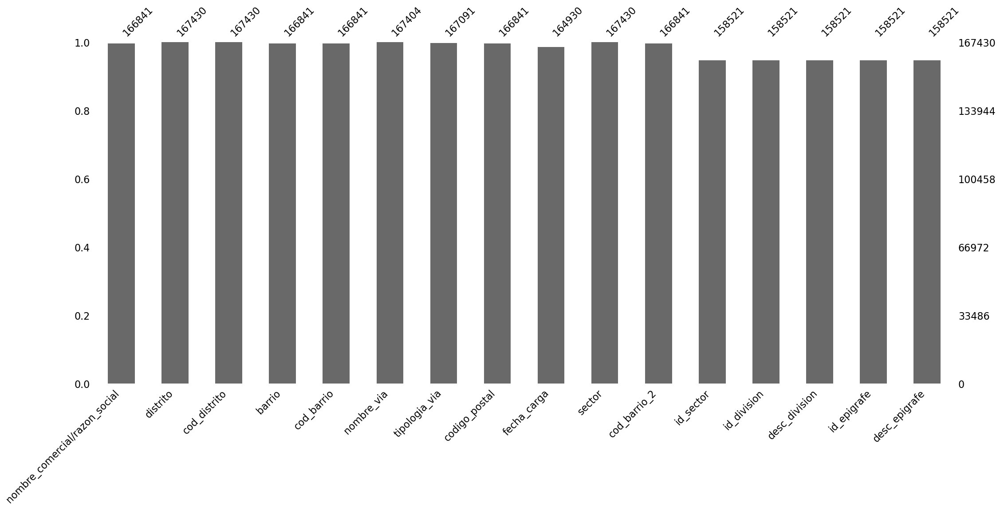

In [216]:
msno.bar(ter_act_quios_peqnego)

In [217]:
ter_act_quios_peqnego.columns

Index(['nombre_comercial/razon_social', 'distrito', 'cod_distrito', 'barrio',
       'cod_barrio', 'nombre_via', 'tipologia_via', 'codigo_postal',
       'fecha_carga', 'sector', 'cod_barrio_2', 'id_sector', 'id_division',
       'desc_division', 'id_epigrafe', 'desc_epigrafe'],
      dtype='object')

In [218]:
ter_act_quios_peqnego.head()

,nombre_comercial/razon_social,distrito,cod_distrito,barrio,cod_barrio,nombre_via,tipologia_via,codigo_postal,fecha_carga,sector,cod_barrio_2,id_sector,id_division,desc_division,id_epigrafe,desc_epigrafe
0,BAR MARISQUERIA LUIS,SALAMANCA,4.0,GUINDALERA,44.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4,NaN,NaN,NaN,NaN,NaN
1,SAGAR,SALAMANCA,4.0,GUINDALERA,44.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4,NaN,NaN,NaN,NaN,NaN
2,BAR CANALEJAS,VILLA DE VALLECAS,18.0,CASCO H.VALLECAS,181.0,FUENTIDUEÑA ...,CALLE,28031.0,2024-11-13 03:30:20.961717,HOSTELERIA,1,NaN,NaN,NaN,NaN,NaN
3,EL ARBOL Y LA TOSTA,SALAMANCA,4.0,RECOLETOS,41.0,ALCALA ...,CALLE,28009.0,2024-11-13 03:30:20.342264,HOSTELERIA,1,NaN,NaN,NaN,NaN,NaN
4,LA PINILLA II,VILLAVERDE,17.0,LOS ANGELES,175.0,LA DEL MANOJO DE ROSAS ...,CALLE,28041.0,2024-11-13 03:30:20.499107,HOSTELERIA,5,NaN,NaN,NaN,NaN,NaN


In [219]:
# Agrupamiento por Distrito y Sector
agrupamiento_distrito_sector = ter_act_quios_peqnego.groupby(['distrito', 'sector']).agg({
    'nombre_comercial/razon_social': 'count',  # Número de negocios
    'codigo_postal': 'nunique'               # Cantidad de códigos postales únicos
}).reset_index()

agrupamiento_distrito_sector.rename(columns={
    'nombre_comercial/razon_social': 'cantidad_negocios',
    'codigo_postal': 'cantidad_cod_postal'
}, inplace=True)



In [220]:
agrupamiento_distrito_sector

,distrito,sector,cantidad_negocios,cantidad_cod_postal
0,Barajas,AUTOESCUELAS,1,1
1,Barajas,"AVENIDANIDAES, HUEVOS Y CAZA",2,1
2,Barajas,DETALLISTAS DE LA CARNE,8,1
3,Barajas,ESTACIONES DE SERVICIO,1,1
4,Barajas,HOTELES,3,1
...,...,...,...,...
745,Villaverde,MUDANZAS Y GUARONDAAMUEBLES,2,1
746,Villaverde,REPARACIÓN DE ELECTRODOMÉSTICOS,5,1
747,Villaverde,RESTAURACIÓN Y OCIO NOCTURNO,2,1
748,Villaverde,TALLERES DE REPARACIÓN DE AUTOMÓVILES,19,1


In [221]:
# Agrupamiento por Barrio y Código Postal
agrupamiento_barrio_cp = ter_act_quios_peqnego.groupby(['barrio', 'codigo_postal']).agg({
    'nombre_comercial/razon_social': 'count',  # Número de negocios
    'id_sector': 'nunique',                   # Sectores únicos
}).reset_index()

agrupamiento_barrio_cp.rename(columns={
    'nombre_comercial/razon_social': 'cantidad_negocios',
    'id_sector': 'cantidad_sectores'
}, inplace=True)



In [222]:
agrupamiento_barrio_cp

,barrio,codigo_postal,cantidad_negocios,cantidad_sectores
0,ABRANTES,28019.0,2,0
1,ABRANTES,28025.0,23,0
2,ABRANTES,28041.0,821,15
3,ACACIAS,28005.0,1558,16
4,ACACIAS,28012.0,7,0
...,...,...,...,...
285,Valdemarín,28023.0,12,0
286,Valverde,28034.0,13,0
287,Ventas,28027.0,68,0
288,Vista Alegre,28025.0,45,0


In [223]:
# Agrupamiento por Tipología de Vía
agrupamiento_via = ter_act_quios_peqnego.groupby(['tipologia_via']).agg({
    'nombre_comercial/razon_social': 'count',  # Número de negocios
    'barrio': 'nunique'                       # Barrios únicos
}).reset_index()

agrupamiento_via.rename(columns={
    'nombre_comercial/razon_social': 'cantidad_negocios',
    'barrio': 'cantidad_barrios'
}, inplace=True)

In [224]:
agrupamiento_via

,tipologia_via,cantidad_negocios,cantidad_barrios
0,AGUSTIN,1,1
1,ALONSO,1,1
2,AUTOVIA,65,11
3,AVENIDA,0,0
4,AVENIDA,14953,108
5,AVENIDANIDA,137,29
6,AVENIDANIDA.,2,2
7,BULEVAR,2,1
8,BULEVAR,217,2
9,CALLE,1592,45


In [225]:
# Agrupamiento por Distrito, Barrio, Sector y Código Postal
agrupamiento_combinado = ter_act_quios_peqnego.groupby(['distrito', 'barrio', 'sector', 'codigo_postal']).agg({
    'nombre_comercial/razon_social': 'count'  # Número de negocios
}).reset_index()

agrupamiento_combinado.rename(columns={
    'nombre_comercial/razon_social': 'cantidad_negocios'
}, inplace=True)

In [226]:
agrupamiento_combinado

,distrito,barrio,sector,codigo_postal,cantidad_negocios
0,Barajas,Alameda de Osuna,AUTOESCUELAS,28042.0,1
1,Barajas,Alameda de Osuna,"AVENIDANIDAES, HUEVOS Y CAZA",28042.0,2
2,Barajas,Alameda de Osuna,DETALLISTAS DE LA CARNE,28042.0,8
3,Barajas,Alameda de Osuna,ESTACIONES DE SERVICIO,28042.0,1
4,Barajas,Alameda de Osuna,HOTELES,28042.0,3
...,...,...,...,...,...
2907,Villaverde,San Andrés,MUDANZAS Y GUARONDAAMUEBLES,28021.0,2
2908,Villaverde,San Andrés,REPARACIÓN DE ELECTRODOMÉSTICOS,28021.0,5
2909,Villaverde,San Andrés,RESTAURACIÓN Y OCIO NOCTURNO,28021.0,2
2910,Villaverde,San Andrés,TALLERES DE REPARACIÓN DE AUTOMÓVILES,28021.0,19


In [227]:
ter_act_quios_peqnego.head()

,nombre_comercial/razon_social,distrito,cod_distrito,barrio,cod_barrio,nombre_via,tipologia_via,codigo_postal,fecha_carga,sector,cod_barrio_2,id_sector,id_division,desc_division,id_epigrafe,desc_epigrafe
0,BAR MARISQUERIA LUIS,SALAMANCA,4.0,GUINDALERA,44.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4,NaN,NaN,NaN,NaN,NaN
1,SAGAR,SALAMANCA,4.0,GUINDALERA,44.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4,NaN,NaN,NaN,NaN,NaN
2,BAR CANALEJAS,VILLA DE VALLECAS,18.0,CASCO H.VALLECAS,181.0,FUENTIDUEÑA ...,CALLE,28031.0,2024-11-13 03:30:20.961717,HOSTELERIA,1,NaN,NaN,NaN,NaN,NaN
3,EL ARBOL Y LA TOSTA,SALAMANCA,4.0,RECOLETOS,41.0,ALCALA ...,CALLE,28009.0,2024-11-13 03:30:20.342264,HOSTELERIA,1,NaN,NaN,NaN,NaN,NaN
4,LA PINILLA II,VILLAVERDE,17.0,LOS ANGELES,175.0,LA DEL MANOJO DE ROSAS ...,CALLE,28041.0,2024-11-13 03:30:20.499107,HOSTELERIA,5,NaN,NaN,NaN,NaN,NaN


In [228]:
ter_act_quios_peqnego["sector"].value_counts()

sector
COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS     53126
HOSTELERÍA                                                                                26617
OTROS SERVICIOS                                                                           16580
ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS                                         10123
ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES                                          9299
ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES                                             8734
EDUCACIÓN                                                                                  6506
HOSTELERIA                                                                                 6472
TRANSPORTE Y ALMACENAMIENTO                                                                4430
INDUSTRIA MANUFACTURERA                                                                    4327
ACTIVIDADES ARTÍSTICAS, RECREATIV

In [229]:
ter_act_quios_peqnego["desc_division"].value_counts()

desc_division
COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS                     45274
SERVICIOS DE COMIDAS Y BEBIDAS                                                          22240
OTROS SERVICIOS PERSONALES                                                              11617
ACTIVIDADES SANITARIAS                                                                   7463
ACTIVIDADES ADMINISTRATIVAS DE OFICINA Y OTRAS ACTIVIDADES AUXILIARES A LAS EMPRESAS     7360
                                                                                        ...  
INDUSTRIA DEL TABACO                                                                        3
SILVICULTURA Y EXPLOTACIÓN FORESTAL                                                         3
ACTIVIDADES DE APOYO A LAS INDUSTRIAS EXTRACTIVAS                                           2
EXTRACCIÓN DE MINERALES METÁLICOS                                                           1
COQUERÍAS Y REFINO DE PETRÓLEO                

**_Desde aqui empiezo a tener cuidado con el despliegue maximo de filas_**

In [230]:
# Configurar Pandas para mostrar todas las filas
pd.options.display.max_rows = None
pd.options.display.max_columns = None

# Muestra el conteo de valores
print(ter_act_quios_peqnego["desc_epigrafe"].value_counts())

desc_epigrafe
ACTIVIDADES ADMINISTRATIVAS Y AUXILIARES DE OFICINA Y SERVICIOS DE REPROGRAFIA                                                                               7063
SERVICIO DE PELUQUERIA                                                                                                                                       5809
BAR RESTAURANTE                                                                                                                                              4775
BAR CON COCINA                                                                                                                                               4537
COMERCIO AL POR MENOR DE PRENDAS DE VESTIR EN ESTABLECIMIENTOS ESPECIALIZADOS                                                                                4178
CAFETERIA                                                                                                                                                    3442
ENSEÑANZA NO R

In [231]:
ter_act_quios_peqnego["desc_epigrafe"].value_counts()

desc_epigrafe
ACTIVIDADES ADMINISTRATIVAS Y AUXILIARES DE OFICINA Y SERVICIOS DE REPROGRAFIA                                                                               7063
SERVICIO DE PELUQUERIA                                                                                                                                       5809
BAR RESTAURANTE                                                                                                                                              4775
BAR CON COCINA                                                                                                                                               4537
COMERCIO AL POR MENOR DE PRENDAS DE VESTIR EN ESTABLECIMIENTOS ESPECIALIZADOS                                                                                4178
CAFETERIA                                                                                                                                                    3442
ENSEÑANZA NO R

In [232]:
ter_act_quios_peqnego.head(4)

,nombre_comercial/razon_social,distrito,cod_distrito,barrio,cod_barrio,nombre_via,tipologia_via,codigo_postal,fecha_carga,sector,cod_barrio_2,id_sector,id_division,desc_division,id_epigrafe,desc_epigrafe
0,BAR MARISQUERIA LUIS,SALAMANCA,4.0,GUINDALERA,44.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4,NaN,NaN,NaN,NaN,NaN
1,SAGAR,SALAMANCA,4.0,GUINDALERA,44.0,ALONSO HEREDIA ...,CALLE,28028.0,2024-11-13 03:30:20.342264,HOSTELERIA,4,NaN,NaN,NaN,NaN,NaN
2,BAR CANALEJAS,VILLA DE VALLECAS,18.0,CASCO H.VALLECAS,181.0,FUENTIDUEÑA ...,CALLE,28031.0,2024-11-13 03:30:20.961717,HOSTELERIA,1,NaN,NaN,NaN,NaN,NaN
3,EL ARBOL Y LA TOSTA,SALAMANCA,4.0,RECOLETOS,41.0,ALCALA ...,CALLE,28009.0,2024-11-13 03:30:20.342264,HOSTELERIA,1,NaN,NaN,NaN,NaN,NaN


In [233]:
ter_act_quios_peqnego["sector"]= ter_act_quios_peqnego["sector"].replace({"HOSTELERIA":"HOSTELERÍA"})

In [234]:
ter_act_quios_peqnego["sector"].value_counts()

sector
COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS     53126
HOSTELERÍA                                                                                33089
OTROS SERVICIOS                                                                           16580
ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS                                         10123
ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES                                          9299
ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES                                             8734
EDUCACIÓN                                                                                  6506
TRANSPORTE Y ALMACENAMIENTO                                                                4430
INDUSTRIA MANUFACTURERA                                                                    4327
ACTIVIDADES ARTÍSTICAS, RECREATIVAS Y DE ENTRETENIMIENTO                                   3968
CONSTRUCCIÓN                     

In [235]:
ter_act_quios_peqnego["desc_epigrafe"]

0                                                       NaN
1                                                       NaN
2                                                       NaN
3                                                       NaN
4                                                       NaN
5                                                       NaN
6                                                       NaN
7                                                       NaN
8                                                       NaN
9                                                       NaN
10                                                      NaN
11                                                      NaN
12                                                      NaN
13                                                      NaN
14                                                      NaN
15                                                      NaN
16                                      

In [236]:
ter_act_quios_peqnego["sector"].value_counts()

sector
COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS     53126
HOSTELERÍA                                                                                33089
OTROS SERVICIOS                                                                           16580
ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS                                         10123
ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES                                          9299
ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES                                             8734
EDUCACIÓN                                                                                  6506
TRANSPORTE Y ALMACENAMIENTO                                                                4430
INDUSTRIA MANUFACTURERA                                                                    4327
ACTIVIDADES ARTÍSTICAS, RECREATIVAS Y DE ENTRETENIMIENTO                                   3968
CONSTRUCCIÓN                     

In [237]:
df_act_quiosco_pequeñosneg["desc_division"].value_counts()

desc_division
COMERCIO AL POR MENOR, EXCEPTO DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS                                                          45274
SERVICIOS DE COMIDAS Y BEBIDAS                                                                                               22240
OTROS SERVICIOS PERSONALES                                                                                                   11617
ACTIVIDADES SANITARIAS                                                                                                        7463
ACTIVIDADES ADMINISTRATIVAS DE OFICINA Y OTRAS ACTIVIDADES AUXILIARES A LAS EMPRESAS                                          7360
EDUCACIÓN                                                                                                                     6506
SERVICIOS DE ALOJAMIENTO                                                                                                      4374
ACTIVIDADES JURÍDICAS Y DE CONTABILIDAD                              

In [238]:
df_act_quiosco_pequeñosneg["desc_epigrafe"].value_counts()

desc_epigrafe
ACTIVIDADES ADMINISTRATIVAS Y AUXILIARES DE OFICINA Y SERVICIOS DE REPROGRAFIA                                                                               7063
SERVICIO DE PELUQUERIA                                                                                                                                       5809
BAR RESTAURANTE                                                                                                                                              4775
BAR CON COCINA                                                                                                                                               4537
COMERCIO AL POR MENOR DE PRENDAS DE VESTIR EN ESTABLECIMIENTOS ESPECIALIZADOS                                                                                4178
CAFETERIA                                                                                                                                                    3442
ENSEÑANZA NO R

In [239]:
df_act_quiosco_pequeñosneg.head(5)

,nombre_comercial/razon_social,sector,nombre_via,codigo_postal,barrio,cod_barrio,cod_barrio_2,distrito,cod_distrito,tipologia_via,id_sector,id_division,desc_division,id_epigrafe,desc_epigrafe,fecha_carga
0,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,ORENSE,28020.0,Cuatro Caminos,62.0,2.0,Tetuán,6.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
1,100 MONTADITOS,RESTAURACIÓN Y OCIO NOCTURNO,FUENCARRAL,28010.0,Trafalgar,73.0,3.0,Chamberí,7.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
2,12 ROOMS,HOTELES,NÚÑEZ DEL ARCE,28012.0,Embajadores,12.0,2.0,Centro,1.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
3,A & J ZAPATOS,CALZADO,TIMOTEO DOMINGO,28017.0,Pueblo Nuevo,152.0,2.0,Ciudad Lineal,15.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN
4,A SU MEDIDA,TINTORERÍAS Y LAVENIDANIDAANDERÍAS,ZARAGOZA,28012.0,Embajadores,12.0,2.0,Centro,1.0,CALLE,NaN,NaN,NaN,NaN,NaN,NaN


In [240]:
df_act_quiosco_pequeñosneg_new = df_act_quiosco_pequeñosneg[["sector","distrito","cod_distrito","barrio","cod_barrio","cod_barrio_2","codigo_postal",
                                                             "desc_epigrafe"]]

In [241]:
df_act_quiosco_pequeñosneg_new = df_act_quiosco_pequeñosneg[["sector","distrito","cod_distrito","barrio","cod_barrio","cod_barrio_2","codigo_postal"]]

In [242]:
df_act_quiosco_pequeñosneg_new.head(5)

,sector,distrito,cod_distrito,barrio,cod_barrio,cod_barrio_2,codigo_postal
0,RESTAURACIÓN Y OCIO NOCTURNO,Tetuán,6.0,Cuatro Caminos,62.0,2.0,28020.0
1,RESTAURACIÓN Y OCIO NOCTURNO,Chamberí,7.0,Trafalgar,73.0,3.0,28010.0
2,HOTELES,Centro,1.0,Embajadores,12.0,2.0,28012.0
3,CALZADO,Ciudad Lineal,15.0,Pueblo Nuevo,152.0,2.0,28017.0
4,TINTORERÍAS Y LAVENIDANIDAANDERÍAS,Centro,1.0,Embajadores,12.0,2.0,28012.0


In [245]:
# df_act_quiosco_pequeñosneg_new["desc_epigrafe"].isna().sum()

In [246]:
df_act_quiosco_pequeñosneg_new.shape

(161021, 7)

In [247]:
df_act_quiosco_pequeñosneg_new1= df_act_quiosco_pequeñosneg_new

In [248]:
# Crear un diccionario con la correspondencia de los valores del sector a los nuevos grupos
sector_mapping = {
    "HOSTELERÍA": "Hostelería y Restauración",
    "RESTAURACIÓN Y OCIO NOCTURNO": "Hostelería y Restauración",
    "HOTELES": "Hostelería y Restauración",
    "HOSTALES": "Hostelería y Restauración",
    "COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS": "Comercio y Servicios Minoristas",
    "DETALLISTAS DE LA CARNE": "Comercio y Servicios Minoristas",
    "CALZADO": "Comercio y Servicios Minoristas",
    "DROGUERÍA Y PERFUMERÍA": "Comercio y Servicios Minoristas",
    "ELECTRODOMÉSTICOS": "Comercio y Servicios Minoristas",
    "AGRICULTURA, GANADERÍA, SILVICULTURA Y PESCA": "Comercio y Servicios Minoristas",
    "JUGUETES": "Comercio y Servicios Minoristas",
    "AVENIDANIDAES, HUEVOS Y CAZA": "Comercio y Servicios Minoristas",
    "MUEBLES": "Comercio y Servicios Minoristas",
    "LIBROS": "Comercio y Servicios Minoristas",
    "ESTACIONES DE SERVICIO": "Comercio y Servicios Minoristas",
    "ARTÍCULOS DE DEPASEORTE": "Comercio y Servicios Minoristas",
    "TABACO Y LOTERIAS": "Comercio y Servicios Minoristas",
    "TABACO": "Comercio y Servicios Minoristas",
    "TABACO Y TIMBRE": "Comercio y Servicios Minoristas",
    "TABACO": "Comercio y Servicios Minoristas",
    "LOTERIAS": "Comercio y Servicios Minoristas",
    "FLORES": "Comercio y Servicios Minoristas",
    "CERRAJERÍA": "Comercio y Servicios Minoristas",
    "PRENSA": "Comercio y Servicios Minoristas",
    "TEXTIL": "Comercio y Servicios Minoristas",
    "ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS": "Servicios Profesionales y Consultoría",
    "ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES": "Servicios Profesionales y Consultoría",
    "ACTIVIDADES FINANCIERAS Y DE SEGUROS": "Servicios Profesionales y Consultoría",
    "ACTIVIDADES INMOBILIARIAS": "Servicios Profesionales y Consultoría",
    "INFORMACIÓN Y COMUNICACIONES": "Servicios Profesionales y Consultoría",
    "TRANSPORTE Y ALMACENAMIENTO": "Servicios Profesionales y Consultoría",
    "INDUSTRIA MANUFACTURERA": "Servicios Profesionales y Consultoría",
    "CONSTRUCCIÓN": "Servicios Profesionales y Consultoría",
    "TALLERES DE REPARACIÓN DE AUTOMÓVILES": "Servicios Profesionales y Consultoría",
    "MUDANZAS Y GUARONDAAMUEBLES": "Servicios Profesionales y Consultoría",
    "ACTIVIDADES DE ORGANIZACIONES Y ORGANISMOS EXTRATERRITORIALES": "Servicios Profesionales y Consultoría",
    "INDUSTRIAS EXTRACTIVAS": "Servicios Profesionales y Consultoría",
    "ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES": "Salud, Bienestar y Educación",
    "EDUCACIÓN": "Salud, Bienestar y Educación",
    "AUTOESCUELAS": "Salud, Bienestar y Educación",
    "ADMINISTRACIÓN PÚBLICA Y DEFENSA; SEGURIDAD SOCIAL OBLIGATORIA": "Salud, Bienestar y Educación",
    "SUMINISTRO DE ENERGÍA ELÉCTRICA, GAS, VAPOR Y AIRE ACONDICIONADO": "Salud, Bienestar y Educación",
    "ACTIVIDADES ARTÍSTICAS, RECREATIVAS Y DE ENTRETENIMIENTO": "Entretenimiento y Ocio",
    "OTROS SERVICIOS": "Entretenimiento y Ocio",
    "REPARACIÓN DE ELECTRODOMÉSTICOS": "Comercio y Servicios Minoristas",
    "SUMINISTRO DE AGUA, ACTIVIDADES DE SANEAMIENTO, GESTIÓN DE RESIDUOS Y DESCONTAMINACIÓN":"Salud, Bienestar y Educación",
    "TINTORERÍAS Y LAVENIDANIDAANDERÍAS":"Comercio y Servicios Minoristas",
    "HOSTELERIA":"Hostelería y Restauración",
    "TABACO ":"Comercio y Servicios Minoristas"
    
}

# Reemplazar los valores en la columna 'sector' utilizando el diccionario
df_act_quiosco_pequeñosneg_new1['grupo_sector'] = df_act_quiosco_pequeñosneg_new1['sector'].replace(sector_mapping)

# Ahora el dataframe df_act_quiosco_pequeñosneg_new tiene una nueva columna 'grupo_sector'
# con los valores agrupados según los 5 grupos mencionados

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15508\2821027660.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_act_quiosco_pequeñosneg_new1['grupo_sector'] = df_act_quiosco_pequeñosneg_new1['sector'].replace(sector_mapping)


In [249]:
df_act_quiosco_pequeñosneg_new1.head(5)

,sector,distrito,cod_distrito,barrio,cod_barrio,cod_barrio_2,codigo_postal,grupo_sector
0,RESTAURACIÓN Y OCIO NOCTURNO,Tetuán,6.0,Cuatro Caminos,62.0,2.0,28020.0,Hostelería y Restauración
1,RESTAURACIÓN Y OCIO NOCTURNO,Chamberí,7.0,Trafalgar,73.0,3.0,28010.0,Hostelería y Restauración
2,HOTELES,Centro,1.0,Embajadores,12.0,2.0,28012.0,Hostelería y Restauración
3,CALZADO,Ciudad Lineal,15.0,Pueblo Nuevo,152.0,2.0,28017.0,Comercio y Servicios Minoristas
4,TINTORERÍAS Y LAVENIDANIDAANDERÍAS,Centro,1.0,Embajadores,12.0,2.0,28012.0,Comercio y Servicios Minoristas


In [250]:
df_act_quiosco_pequeñosneg_new1["grupo_sector"].isna().sum()

0

In [251]:
df_act_quiosco_pequeñosneg_new1["grupo_sector"].value_counts()

grupo_sector
Comercio y Servicios Minoristas          54819
Servicios Profesionales y Consultoría    41615
Hostelería y Restauración                27003
Entretenimiento y Ocio                   20548
Salud, Bienestar y Educación             17036
Name: count, dtype: int64

In [252]:
# Agrupamiento por grupo_sector,barrio y distrito.

df_agrupado = df_act_quiosco_pequeñosneg_new1.groupby(['grupo_sector', 'barrio', 'distrito']).size().reset_index(name='cantidad')

In [253]:
df_agrupado.head(5)

,grupo_sector,barrio,distrito,cantidad
0,Comercio y Servicios Minoristas,ABRANTES,CARABANCHEL,331
1,Comercio y Servicios Minoristas,ACACIAS,ARGANZUELA,455
2,Comercio y Servicios Minoristas,ADELFAS,RETIRO,160
3,Comercio y Servicios Minoristas,AEROPUERTO,BARAJAS,258
4,Comercio y Servicios Minoristas,ALAMEDA DE OSUNA,BARAJAS,148


In [254]:
df_agrupado.shape

(820, 4)

In [255]:
tabla_pivot = df_agrupado.pivot_table(index=['barrio', 'distrito'], 
                                      columns='grupo_sector', 
                                      values='cantidad', 
                                      fill_value=0)
print(tabla_pivot)

grupo_sector                                       Comercio y Servicios Minoristas  \
barrio                       distrito                                                
ABRANTES                     CARABANCHEL                                     331.0   
ACACIAS                      ARGANZUELA                                      455.0   
ADELFAS                      RETIRO                                          160.0   
AEROPUERTO                   BARAJAS                                         258.0   
ALAMEDA DE OSUNA             BARAJAS                                         148.0   
ALMAGRO                      CHAMBERI                                        432.0   
ALMENARA                     TETUAN                                          356.0   
ALMENDRALES                  USERA                                           352.0   
ALUCHE                       LATINA                                          817.0   
AMPOSTA                      SAN BLAS-CANILLEJAS      

In [256]:
tabla_pivot.head(5)

,grupo_sector,Comercio y Servicios Minoristas,Entretenimiento y Ocio,Hostelería y Restauración,"Salud, Bienestar y Educación",Servicios Profesionales y Consultoría
barrio,distrito,,,,,
ABRANTES,CARABANCHEL,331.0,126.0,138.0,68.0,158.0
ACACIAS,ARGANZUELA,455.0,235.0,216.0,249.0,319.0
ADELFAS,RETIRO,160.0,84.0,80.0,67.0,158.0
AEROPUERTO,BARAJAS,258.0,18.0,133.0,20.0,262.0
ALAMEDA DE OSUNA,BARAJAS,148.0,71.0,79.0,75.0,88.0


In [257]:
df_agrupado2 = df_act_quiosco_pequeñosneg_new1.groupby(['grupo_sector', 'cod_barrio']).size().reset_index(name='cantidad')

In [258]:
df_agrupado2.shape

(655, 3)

In [259]:
df_agrupado2.head(5)

,grupo_sector,cod_barrio,cantidad
0,Comercio y Servicios Minoristas,11.0,712
1,Comercio y Servicios Minoristas,12.0,1834
2,Comercio y Servicios Minoristas,13.0,450
3,Comercio y Servicios Minoristas,14.0,1105
4,Comercio y Servicios Minoristas,15.0,1130


In [260]:
df_agrupado3 = df_act_quiosco_pequeñosneg_new1.groupby(['grupo_sector', "codigo_postal"]).size().reset_index(name='cantidad')

In [261]:
df_agrupado3.shape

(245, 3)

In [262]:
df_agrupado3.head(5)

,grupo_sector,codigo_postal,cantidad
0,Comercio y Servicios Minoristas,28001.0,2294
1,Comercio y Servicios Minoristas,28002.0,1450
2,Comercio y Servicios Minoristas,28003.0,798
3,Comercio y Servicios Minoristas,28004.0,1105
4,Comercio y Servicios Minoristas,28005.0,808


## **Cuarta Union**

"212769-0-atencion-medica.csv"= https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=da7437ac37efb410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default

In [263]:
centros_medicos= pd.read_csv("212769-0-atencion-medica.csv", encoding='ISO-8859-1',sep=";")

In [264]:
centros_medicos.shape

(273, 32)

In [265]:
centros_medicos.duplicated().sum()

0

In [266]:
centros_medicos.isna().sum()

PK                       0
NOMBRE                   0
DESCRIPCION-ENTIDAD    254
HORARIO                189
EQUIPAMIENTO            96
TRANSPORTE               1
DESCRIPCION            235
ACCESIBILIDAD            0
CONTENT-URL              0
NOMBRE-VIA               0
CLASE-VIAL               0
TIPO-NUM                 0
NUM                      4
PLANTA                 258
PUERTA                 270
ESCALERAS              273
ORIENTACION            263
LOCALIDAD                0
PROVINCIA                0
CODIGO-POSTAL            3
COD-BARRIO               9
BARRIO                   6
COD-DISTRITO             9
DISTRITO                 0
COORDENADA-X             1
COORDENADA-Y             1
LATITUD                  0
LONGITUD                 0
TELEFONO                 2
FAX                    229
EMAIL                  210
TIPO                     1
dtype: int64

In [267]:
centros_medicos.head(5)

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,5855213,Centro Concertado de adicciones (CCAD) Centro ...,El Centro concertado de adicciones Centro form...,De lunes a viernes de 9 a 17 horas,Valoración interdisciplinar del/de la paciente...,"Metro: Alonso Martínez, L4, L5, L10",Forma de acceso: directo,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,HERMANOS ALVAREZ QUINTERO,CALLE,V,3.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28004.0,4.0,JUSTICIA,1.0,CENTRO,440835.0,4475437.0,40.42747404776084,-3.697485377509971,914 291 960,NaN,ctdcentro@cruzroja.es,/contenido/entidadesYorganismos/CentrosAtencio...
1,134929,Centro Concertado de Atención a las Adicciones...,El CCAD Cáritas que forma parte de la red del ...,"De lunes a viernes mañanas de 9 a 14 horas, ta...",Valoración interdisciplinar del/de la paciente...,"Bus: 9, 73, N2Metro: Alfonso XIII (L4), Prospe...",NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,SANTA HORTENSIA,CALLE,V,1.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28002.0,2.0,PROSPERIDAD,5.0,CHAMARTIN,443159.0,4477482.0,40.446053313442704,-3.6702766124516515,917 440 599,NaN,tto.adicciones@caritasmadrid.org,/contenido/entidadesYorganismos/CentrosAtencio...
2,53123,Centro Concertado de Atención a las Adicciones...,El CCAD Casa de Campo que forma parte de la r...,De lunes a viernes de 9 a 17 horas,Valoración interdisciplinar del paciente. Trat...,"Bus: 31, 33, 36, 39, 65, 138 Metro:Puerta del ...",Forma de acceso: directo,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,PORTUGAL,AVENIDA,V,0.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28011.0,2.0,PUERTA DEL ANGEL,10.0,LATINA,438577.0,4474219.0,40.41633059885888,-3.7239914257003304,914 799 499,NaN,ctdccampo@cruzroja.es,/contenido/entidadesYorganismos/CentrosAtencio...
3,11867,Centro de Atención a las Adicciones (CAD) de A...,Se trata de un centro público que proporciona ...,Horario ordinario: De septiembre a junio: ...,Valoración interdisciplinar de cada usuario. ...,"Bus: 6 , 8 , 18 , 19 , 22 , 45 , 47 , 76 , 78 ...","Forma de acceso: directo, a través de los serv...",1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,CHOPERA,PASEO,V,12.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28045.0,3.0,CHOPERA,2.0,ARGANZUELA,440757.0,4471619.0,40.39305745803064,-3.6980673403694104,915 886 186,NaN,cadarganzuela@madrid.es,/contenido/entidadesYorganismos/CentrosAtencio...
4,11887,Centro de Atención a las Adicciones (CAD) de H...,Se trata de un centro público que proporciona ...,Horario ordinario: De septiembre a junio: ...,Valoración interdisciplinar de cada usuario. ...,"Bus: 73, 87, 104, 112, 120, 125, 153, 172Metro...","Acceso: directo, a través de los servicios mun...",1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,MINAYA,CALLE,V,7.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28043.0,3.0,CANILLAS,16.0,HORTALEZA,446072.0,4479929.0,40.468288815918534,-3.636150078507109,913 822 530,NaN,cadhortaleza@madrid. es,/contenido/entidadesYorganismos/CentrosAtencio...


In [268]:
centros_medicos = centros_medicos[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

In [269]:
centros_medicos.head(5)

,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO
0,28004.0,4.0,JUSTICIA,1.0,CENTRO
1,28002.0,2.0,PROSPERIDAD,5.0,CHAMARTIN
2,28011.0,2.0,PUERTA DEL ANGEL,10.0,LATINA
3,28045.0,3.0,CHOPERA,2.0,ARGANZUELA
4,28043.0,3.0,CANILLAS,16.0,HORTALEZA


In [270]:

names_centrosmedicos= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

centros_medicos = centros_medicos.rename(columns=names_centrosmedicos)

In [271]:
centros_medicos.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito
0,28004.0,4.0,JUSTICIA,1.0,CENTRO
1,28002.0,2.0,PROSPERIDAD,5.0,CHAMARTIN
2,28011.0,2.0,PUERTA DEL ANGEL,10.0,LATINA
3,28045.0,3.0,CHOPERA,2.0,ARGANZUELA
4,28043.0,3.0,CANILLAS,16.0,HORTALEZA


In [272]:
centros_medicos = centros_medicos.rename(columns=names_centrosmedicos)

centros_medicos["grupo_sector"]= "Salud, Bienestar y Educación"
centros_medicos["sector"]= "Centros de salud"
centros_medicos["cod_barrio"]=np.nan


In [273]:
centros_medicos.head(5)

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28004.0,4.0,JUSTICIA,1.0,CENTRO,"Salud, Bienestar y Educación",Centros de salud,NaN
1,28002.0,2.0,PROSPERIDAD,5.0,CHAMARTIN,"Salud, Bienestar y Educación",Centros de salud,NaN
2,28011.0,2.0,PUERTA DEL ANGEL,10.0,LATINA,"Salud, Bienestar y Educación",Centros de salud,NaN
3,28045.0,3.0,CHOPERA,2.0,ARGANZUELA,"Salud, Bienestar y Educación",Centros de salud,NaN
4,28043.0,3.0,CANILLAS,16.0,HORTALEZA,"Salud, Bienestar y Educación",Centros de salud,NaN


In [274]:
centros_medicos.isna().sum()

codigo_postal      3
cod_barrio_2       9
barrio             6
cod_distrito       9
distrito           0
grupo_sector       0
sector             0
cod_barrio       273
dtype: int64

In [275]:
centros_medicos = centros_medicos.dropna(subset=["cod_distrito"])

In [276]:
centros_medicos.isna().sum()

codigo_postal      0
cod_barrio_2       0
barrio             0
cod_distrito       0
distrito           0
grupo_sector       0
sector             0
cod_barrio       264
dtype: int64

In [277]:
nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

centros_medicos= centros_medicos.astype(nuevos_tipos)

In [278]:
centros_medicos.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28004.0,4,JUSTICIA,1,CENTRO,"Salud, Bienestar y Educación",Centros de salud,NaN
1,28002.0,2,PROSPERIDAD,5,CHAMARTIN,"Salud, Bienestar y Educación",Centros de salud,NaN
2,28011.0,2,PUERTA DEL ANGEL,10,LATINA,"Salud, Bienestar y Educación",Centros de salud,NaN
3,28045.0,3,CHOPERA,2,ARGANZUELA,"Salud, Bienestar y Educación",Centros de salud,NaN
4,28043.0,3,CANILLAS,16,HORTALEZA,"Salud, Bienestar y Educación",Centros de salud,NaN


In [279]:
df_act_quiosco_pequeñosneg_new1.head(4)

,sector,distrito,cod_distrito,barrio,cod_barrio,cod_barrio_2,codigo_postal,grupo_sector
0,RESTAURACIÓN Y OCIO NOCTURNO,Tetuán,6.0,Cuatro Caminos,62.0,2.0,28020.0,Hostelería y Restauración
1,RESTAURACIÓN Y OCIO NOCTURNO,Chamberí,7.0,Trafalgar,73.0,3.0,28010.0,Hostelería y Restauración
2,HOTELES,Centro,1.0,Embajadores,12.0,2.0,28012.0,Hostelería y Restauración
3,CALZADO,Ciudad Lineal,15.0,Pueblo Nuevo,152.0,2.0,28017.0,Comercio y Servicios Minoristas


In [280]:
# Asegúrate de que las columnas son de tipo string para concatenación adecuada
centros_medicos["cod_distrito"] = centros_medicos["cod_distrito"].astype(str)
centros_medicos["cod_barrio_2"] = centros_medicos["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
centros_medicos["cod_barrio"] = centros_medicos["cod_distrito"] + centros_medicos["cod_barrio_2"]
centros_medicos["cod_barrio"]=centros_medicos["cod_barrio"].astype(int)


In [281]:
centros_medicos.head(4)

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28004.0,4,JUSTICIA,1,CENTRO,"Salud, Bienestar y Educación",Centros de salud,14
1,28002.0,2,PROSPERIDAD,5,CHAMARTIN,"Salud, Bienestar y Educación",Centros de salud,52
2,28011.0,2,PUERTA DEL ANGEL,10,LATINA,"Salud, Bienestar y Educación",Centros de salud,102
3,28045.0,3,CHOPERA,2,ARGANZUELA,"Salud, Bienestar y Educación",Centros de salud,23


In [282]:
centros_medicos.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [283]:
df_act_quiosco_pequeñosneg_new1.head()

,sector,distrito,cod_distrito,barrio,cod_barrio,cod_barrio_2,codigo_postal,grupo_sector
0,RESTAURACIÓN Y OCIO NOCTURNO,Tetuán,6.0,Cuatro Caminos,62.0,2.0,28020.0,Hostelería y Restauración
1,RESTAURACIÓN Y OCIO NOCTURNO,Chamberí,7.0,Trafalgar,73.0,3.0,28010.0,Hostelería y Restauración
2,HOTELES,Centro,1.0,Embajadores,12.0,2.0,28012.0,Hostelería y Restauración
3,CALZADO,Ciudad Lineal,15.0,Pueblo Nuevo,152.0,2.0,28017.0,Comercio y Servicios Minoristas
4,TINTORERÍAS Y LAVENIDANIDAANDERÍAS,Centro,1.0,Embajadores,12.0,2.0,28012.0,Comercio y Servicios Minoristas


In [284]:
centros_medicos.shape

(264, 8)

In [285]:
df_act_quiosco_pequeñosneg_new1.shape

(161021, 8)

In [286]:
df_todojunto= pd.concat([df_act_quiosco_pequeñosneg_new1,centros_medicos],ignore_index=True)

In [287]:
df_todojunto.shape

(161285, 8)

## **Quinta Union**

205712-0-centros-discapacidad.csv= https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=bd2b7f0e53045410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default



In [288]:
centros_discapacidad= pd.read_csv("205712-0-centros-discapacidad.csv", encoding='ISO-8859-1',sep=";")

In [289]:
centros_discapacidad.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,7191232,"Ángeles Urbanos Hortaleza, centro ocupacional ...",NaN,NaN,Centro ocupacional para personas con discapaci...,"Metro: Canillas (línea 4) Bus: 73, 120",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,JOSE ALVAREZ DE TOLEDO,CALLE,V,6.0,Baja,NaN,NaN,NaN,MADRID,MADRID,28043,2.0,PIOVERA,16.0,HORTALEZA,446656,4479258,40.462290,-3.629187,911 558 200,NaN,NaN,/contenido/entidadesYorganismos/CentrosAtencio...
1,11156077,APAM Centro de rehabilitación,NaN,NaN,Centro de rehabilitación para personas con dis...,"Metro: Alvarado (línea 1) Bus: 5, 149, 43, 12...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,JAEN,CALLE,V,32.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28020,2.0,CUATRO CAMINOS,6.0,TETUAN,440616,4477972,40.450289,-3.700299,915 333 722,NaN,NaN,/contenido/entidadesYorganismos/CentrosAtencio...
2,10613790,"APFMPS, Residencia, centro de día y centro ocu...",NaN,NaN,"Residencia, centro de día y centro ocupacional...","Bus: 712, 713, 714, 716",NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,COLMENAR VIEJO,CARRETERA,V,13.6,NaN,NaN,NaN,NaN,MADRID,MADRID,28049,NaN,NaN,NaN,DISTRITO,439552,4490491,40.562993,-3.714052,917 345 138,NaN,NaN,/contenido/entidadesYorganismos/CentrosAtencio...
3,1417,ATENPACE Centro de rehabilitación para jóvenes...,NaN,NaN,Centro de rehabilitación para personas con dis...,"Metro: Peñagrande, Avenida de la Ilustración (...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ISLAS MARQUESAS,CALLE,V,27.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28035,3.0,PEÑA GRANDE,8.0,FUENCARRAL-EL PARDO,438435,4480885,40.476369,-3.726308,913 167 446,NaN,NaN,/contenido/entidadesYorganismos/CentrosAtencio...
4,7827523,Alicia Koplowitz Centro de día y centro reside...,NaN,NaN,Centro residencial y centro de día para person...,"Metro: Valdebernardo (línea 9) Bus: 71, 130, ...",NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,JOSE PRAT,BULEVAR,V,40.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28032,2.0,VALDEBERNARDO,19.0,VICALVARO,447406,4471911,40.396148,-3.619736,913 016 560,NaN,NaN,/contenido/entidadesYorganismos/CentrosAtencio...


In [290]:
centros_discapacidad.shape

(127, 32)

In [291]:
centros_discapacidad.duplicated().sum()

0

In [292]:
centros_discapacidad.isna().sum()

PK                       0
NOMBRE                   0
DESCRIPCION-ENTIDAD    125
HORARIO                126
EQUIPAMIENTO             1
TRANSPORTE               0
DESCRIPCION            127
ACCESIBILIDAD            0
CONTENT-URL              0
NOMBRE-VIA               0
CLASE-VIAL               0
TIPO-NUM                 0
NUM                      0
PLANTA                 116
PUERTA                 125
ESCALERAS              127
ORIENTACION            126
LOCALIDAD                0
PROVINCIA                0
CODIGO-POSTAL            0
COD-BARRIO               2
BARRIO                   2
COD-DISTRITO             2
DISTRITO                 0
COORDENADA-X             0
COORDENADA-Y             0
LATITUD                  0
LONGITUD                 0
TELEFONO                 1
FAX                    126
EMAIL                  124
TIPO                     0
dtype: int64

In [293]:
centros_discapacidad= centros_discapacidad[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_discapacidad= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

centros_discapacidad = centros_discapacidad.rename(columns=names_discapacidad)

centros_discapacidad["grupo_sector"]= "Salud, Bienestar y Educación"
centros_discapacidad["sector"]= "Centros de salud"
centros_discapacidad["cod_barrio"]=np.nan

centros_discapacidad = centros_discapacidad.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

centros_discapacidad= centros_discapacidad.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
centros_discapacidad["cod_distrito"] = centros_discapacidad["cod_distrito"].astype(str)
centros_discapacidad["cod_barrio_2"] = centros_discapacidad["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
centros_discapacidad["cod_barrio"] = centros_discapacidad["cod_distrito"] + centros_discapacidad["cod_barrio_2"]
centros_discapacidad["cod_barrio"]=centros_discapacidad["cod_barrio"].astype(int)


In [294]:
centros_discapacidad.head(5)

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28043,2,PIOVERA,16,HORTALEZA,"Salud, Bienestar y Educación",Centros de salud,162
1,28020,2,CUATRO CAMINOS,6,TETUAN,"Salud, Bienestar y Educación",Centros de salud,62
3,28035,3,PEÑA GRANDE,8,FUENCARRAL-EL PARDO,"Salud, Bienestar y Educación",Centros de salud,83
4,28032,2,VALDEBERNARDO,19,VICALVARO,"Salud, Bienestar y Educación",Centros de salud,192
5,28044,7,LAS AGUILAS,10,LATINA,"Salud, Bienestar y Educación",Centros de salud,107


In [295]:
df_todojunto.shape

(161285, 8)

In [296]:
centros_discapacidad.shape

(125, 8)

In [297]:
df_todojunto2= pd.concat([df_todojunto,centros_discapacidad],ignore_index=True)

In [298]:
df_todojunto2.shape

(161410, 8)

## **Sexta Union**

"202625-0-aparcamientos-publicos.csv"= https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=26e6cc885fcd3410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default

In [299]:
aparcamientos_publicos = pd.read_csv("202625-0-aparcamientos-publicos.csv",encoding='ISO-8859-1',sep=";")

In [300]:
aparcamientos_publicos.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,11483771,Aparcamiento disuasorio Aviación Española,NaN,Abierto 24 horas,NaN,Autobuses: EMT: Línea 17 (destino Pl. Ma...,"Plazas: para automóviles: 344 (de las cuales,...",1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,FUENTE DE LIMA,CALLE,V,5.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28024,7,LAS AGUILAS,10,LATINA,433485,4470588,40.383238,-3.783621006318095,NaN,NaN,NaN,/contenido/entidadesYorganismos/AparcamientosP...
1,10489514,Aparcamiento disuasorio Estadio Metropolitano ...,NaN,Horario de apertura de 6:00 h a 22:00 h los dí...,NaN,NaN,Plazas: para automóviles: 3011 para motocicle...,0,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ARCENTALES,AVENIDA,V,37.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28022,5,ROSAS,20,SAN BLAS-CANILLEJAS,449209,4476118,40.434154,-3.598831,NaN,NaN,NaN,/contenido/entidadesYorganismos/AparcamientosP...
2,11413444,Aparcamiento disuasorio Fuente de la Mora,NaN,Abierto 24 horas,NaN,Autobuses: EMT: 150 Cercanias: ...,"Plazas: para automóviles: 368 (de las cuales,...",1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,MANOTERAS,AVENIDA,V,1.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28050,6,VALDEFUENTES,16,HORTALEZA,443680,4481739,40.484443,-3.66450251273440,NaN,NaN,NaN,/contenido/entidadesYorganismos/AparcamientosP...
3,11544464,Aparcamiento disuasorio Islazul,NaN,NaN,NaN,Autobuses: EMT: SE Plaza Elíptica &amp;n...,Número de plazas: 224 plazas Código del aparc...,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,CALDERILLA,CALLE,V,1.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28054,6,BUENAVISTA,11,CARABANCHEL,437347,4468555,40.365217,-3.737923481612698,NaN,NaN,NaN,/contenido/entidadesYorganismos/AparcamientosP...
4,11413620,Aparcamiento disuasorio Pitis,NaN,Abierto 24 horas,NaN,"Autobuses: EMT: 64, 82 Cercanias: ...","Plazas: para automóviles: 402 (de las cuales,...",1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,GLORIA FUERTES,CALLE,V,NaN,NaN,NaN,NaN,NaN,MADRID,MADRID,28049,2,FUENTELARREINA,8,FUENCARRAL-EL PARDO,438372,4482864,40.494193,-3.72723600089653,NaN,NaN,NaN,/contenido/entidadesYorganismos/AparcamientosP...


In [301]:
aparcamientos_publicos.isna().sum()

PK                      0
NOMBRE                  0
DESCRIPCION-ENTIDAD    62
HORARIO                57
EQUIPAMIENTO           63
TRANSPORTE             59
DESCRIPCION             0
ACCESIBILIDAD           0
CONTENT-URL             0
NOMBRE-VIA              0
CLASE-VIAL              0
TIPO-NUM                1
NUM                     8
PLANTA                 57
PUERTA                 57
ESCALERAS              61
ORIENTACION            63
LOCALIDAD               0
PROVINCIA               0
CODIGO-POSTAL           0
COD-BARRIO              0
BARRIO                  0
COD-DISTRITO            0
DISTRITO                0
COORDENADA-X            0
COORDENADA-Y            0
LATITUD                 0
LONGITUD                0
TELEFONO               44
FAX                    63
EMAIL                  53
TIPO                    0
dtype: int64

In [302]:
aparcamientos_publicos.duplicated().sum()

0

In [303]:
df_todojunto2["grupo_sector"].value_counts()

grupo_sector
Comercio y Servicios Minoristas          54819
Servicios Profesionales y Consultoría    41615
Hostelería y Restauración                27003
Entretenimiento y Ocio                   20548
Salud, Bienestar y Educación             17425
Name: count, dtype: int64

In [304]:
aparcamientos_publicos= aparcamientos_publicos[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_discapacidad= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

aparcamientos_publicos = aparcamientos_publicos.rename(columns=names_discapacidad)

aparcamientos_publicos["grupo_sector"]= "Salud, Bienestar y Educación"
aparcamientos_publicos["sector"]= "Aparcamientos"
aparcamientos_publicos["cod_barrio"]=np.nan

aparcamientos_publicos = aparcamientos_publicos.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

aparcamientos_publicos= aparcamientos_publicos.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
aparcamientos_publicos["cod_distrito"] = aparcamientos_publicos["cod_distrito"].astype(str)
aparcamientos_publicos["cod_barrio_2"] = aparcamientos_publicos["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
aparcamientos_publicos["cod_barrio"] = aparcamientos_publicos["cod_distrito"] + aparcamientos_publicos["cod_barrio_2"]
aparcamientos_publicos["cod_barrio"]=aparcamientos_publicos["cod_barrio"].astype(int)

In [305]:
aparcamientos_publicos.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28024,7,LAS AGUILAS,10,LATINA,"Salud, Bienestar y Educación",Aparcamientos,107
1,28022,5,ROSAS,20,SAN BLAS-CANILLEJAS,"Salud, Bienestar y Educación",Aparcamientos,205
2,28050,6,VALDEFUENTES,16,HORTALEZA,"Salud, Bienestar y Educación",Aparcamientos,166
3,28054,6,BUENAVISTA,11,CARABANCHEL,"Salud, Bienestar y Educación",Aparcamientos,116
4,28049,2,FUENTELARREINA,8,FUENCARRAL-EL PARDO,"Salud, Bienestar y Educación",Aparcamientos,82


In [306]:
df_todojunto2.shape

(161410, 8)

In [307]:
aparcamientos_publicos.shape

(63, 8)

In [308]:
df_todojunto3= pd.concat([df_todojunto2,aparcamientos_publicos],ignore_index=True)

In [309]:
df_todojunto3.shape

(161473, 8)

## **Septima Union**

201747-0-bibliobuses-bibliotecas.csv = https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=ed35401429b83410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default


In [310]:
bibliotecas = pd.read_csv("201747-0-bibliobuses-bibliotecas.csv",encoding='ISO-8859-1',sep=";")

In [311]:
bibliotecas.shape

(49, 32)

In [312]:
bibliotecas.isna().sum()

PK                      0
NOMBRE                  0
DESCRIPCION-ENTIDAD    16
HORARIO                 0
EQUIPAMIENTO            1
TRANSPORTE              0
DESCRIPCION             4
ACCESIBILIDAD           0
CONTENT-URL             0
NOMBRE-VIA              0
CLASE-VIAL              0
TIPO-NUM                0
NUM                     0
PLANTA                 49
PUERTA                 49
ESCALERAS              49
ORIENTACION            41
LOCALIDAD               0
PROVINCIA               0
CODIGO-POSTAL           0
COD-BARRIO              3
BARRIO                  0
COD-DISTRITO            3
DISTRITO                0
COORDENADA-X            0
COORDENADA-Y            0
LATITUD                 0
LONGITUD                0
TELEFONO                0
FAX                    36
EMAIL                   0
TIPO                    0
dtype: int64

In [313]:
bibliotecas.duplicated().sum()

0

In [314]:
bibliotecas.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,25526,Biblioteca Pública Antonio Mingote (Latina),NaN,Apertura de lunes a sábado. Consulta el horar...,Wifi gratuito.,"Bus: 17, 34, 39, 138 y 139. Cercanías Renfe:...","Lectura fácil, letra grande, audiodescripción.",1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,RAFAEL FINAT,CALLE,V,51,NaN,NaN,NaN,NaN,MADRID,MADRID,28044,7.0,LAS AGUILAS,10.0,LATINA,434685,4470157,40.379442,-3.769439,915 093 625,917 068 193,bib.latina@madrid.org,/contenido/entidadesYorganismos/BibliotecasPub...
1,1774,Biblioteca Pública Elena Fortún (Retiro),NaN,Apertura de lunes a sábado. Horario en el en...,Wifi gratuito.,"Metro: Pacífico (líneas 1 y 6), Conde de Casal...","Lectura fácil, letra grande, audiodescripción.",1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,DOCTOR ESQUERDO,CALLE,V,189,NaN,NaN,NaN,NaN,MADRID,MADRID,28007,2.0,ADELFAS,3.0,RETIRO,442942,4472768,40.403578,-3.672409,915 019 146,915 018 130,bib.retiro@madrid.org,/contenido/entidadesYorganismos/BibliotecasPub...
2,1770,Biblioteca Pública Hortaleza,NaN,Apertura de lunes a viernes. Consulta el hora...,NaN,Metro: Parque de Santa María (línea 4) Bus: 9...,NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ABERTURA,CALLE,V,2,NaN,NaN,NaN,NaN,MADRID,MADRID,28033,4.0,PINAR DEL REY,16.0,HORTALEZA,444936,4480925,40.477193,-3.649620,917 633 284,917 633 284,bib.hortaleza@madrid.org,/contenido/entidadesYorganismos/BibliotecasPub...
3,1773,Biblioteca Pública Javier Marías (Moratalaz),NaN,Apertura de lunes a sábado. Horario en el en...,Wifi gratuito.,"Metro: Artilleros (línea 9) Bus: 8, 20, 30, 3...","Lectura fácil, letra grande, audiodescripción.",1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,CORREGIDOR ALONSO DE TOBAR,CALLE,V,5,NaN,NaN,NaN,NaN,MADRID,MADRID,28030,5.0,FONTARRON,14.0,MORATALAZ,444892,4472800,40.403992,-3.649438,914 394 688,914 370 234,bib.moratalaz@madrid.org,/contenido/entidadesYorganismos/BibliotecasPub...
4,1771,Biblioteca Pública José Acuña (Moncloa - Aravaca),NaN,Apertura de lunes a sábado. Horario en el si...,Wifi gratuito.,"Metro: Arg&amp;uuml;elles (líneas 3, 4 y 6), V...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,QUINTANA,CALLE,V,9,NaN,NaN,NaN,NaN,MADRID,MADRID,28008,2.0,ARGUELLES,9.0,MONCLOA-ARAVACA,439184,4475503,40.427947,-3.716951,915 413 619,NaN,bib.acuna@madrid.org,/contenido/entidadesYorganismos/BibliotecasPub...


In [315]:
bibliotecas= bibliotecas[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_bibliotecas= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

bibliotecas = bibliotecas.rename(columns=names_bibliotecas)

bibliotecas["grupo_sector"]= "Salud, Bienestar y Educación"
bibliotecas["sector"]= "Bibliotecas"
bibliotecas["cod_barrio"]=np.nan

bibliotecas = bibliotecas.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

bibliotecas= bibliotecas.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
bibliotecas["cod_distrito"] = bibliotecas["cod_distrito"].astype(str)
bibliotecas["cod_barrio_2"] = bibliotecas["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
bibliotecas["cod_barrio"] = bibliotecas["cod_distrito"] + bibliotecas["cod_barrio_2"]
bibliotecas["cod_barrio"]=bibliotecas["cod_barrio"].astype(int)

In [316]:
bibliotecas.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28044,7,LAS AGUILAS,10,LATINA,"Salud, Bienestar y Educación",Bibliotecas,107
1,28007,2,ADELFAS,3,RETIRO,"Salud, Bienestar y Educación",Bibliotecas,32
2,28033,4,PINAR DEL REY,16,HORTALEZA,"Salud, Bienestar y Educación",Bibliotecas,164
3,28030,5,FONTARRON,14,MORATALAZ,"Salud, Bienestar y Educación",Bibliotecas,145
4,28008,2,ARGUELLES,9,MONCLOA-ARAVACA,"Salud, Bienestar y Educación",Bibliotecas,92


In [317]:
bibliotecas.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [318]:
bibliotecas.shape

(46, 8)

In [319]:
df_todojunto3.shape

(161473, 8)

In [320]:
df_todojunto4= pd.concat([df_todojunto3,bibliotecas],ignore_index=True)

In [321]:
df_todojunto4.shape

(161519, 8)

## **Octava Union**

201132-0-museos.csv = https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=118f2fdbecc63410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default


In [322]:
museos= pd.read_csv("201132-0-museos.csv",encoding='ISO-8859-1',sep=";")

In [323]:
museos.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,6017808,Casa Museo Fuente del Rey,Fundación AMYC (Arte Moderno y Contemporáneo)....,"Martes a sábado, de 10 a 19 horas. Lunes, domi...",NaN,Bus: 161.,NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,FUENTE DEL REY,CALLE,V,11.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28023,7,ARAVACA,9,MONCLOA-ARAVACA,434663,4478596,40.455469,-3.770572,913 579 116,NaN,info@fundacionamyc.org,/contenido/entidadesYorganismos/FundacionesCul...
1,4847190,Casa Museo Lope de Vega,"'Mi casilla, mi quietud, mi g&amp;uuml;ertecil...","De martes a domingo, de 10 a 18 horas. Cerrad...",NaN,"Metro: Antón Martín (línea 1), Sevilla (línea ...",NaN,"0,4",http://www.madrid.es/sites/v/index.jsp?vgnextc...,CERVANTES,CALLE,V,11.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28014,3,CORTES,1,CENTRO,440825,4473983,40.414369,-3.697467,914 299 216,NaN,casamuseolopedevega@madrid.org,/contenido/entidadesYorganismos/Museos
2,4949641,Casita - Museo del Ratón Pérez,"La Casita-Museo de Ratón Pérez, constituye un ...",Visitas familiares: Lunes a viernes: de 11...,NaN,"Metro: Sol (líneas: 1, 2 y 3), Ópera (líneas 2...",Se aconseja acudan con la entrada adquirida an...,0,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ARENAL,CALLE,V,8.0,1.ª,NaN,NaN,NaN,MADRID,MADRID,28013,6,SOL,1,CENTRO,440144,4474287,40.417060,-3.705520,915 226 968,NaN,info@casamuseoratonperez.es,/contenido/entidadesYorganismos/Museos
3,5682031,Castillo de la Alameda,El Castillo de la Alameda o de Barajas es uno ...,Abierto solo en fin de semana (sábado y doming...,Zona wifi.,Metro: Alameda de Osuna y El Capricho (línea 5).,Accesibilidad Rampas de acceso (las rampas d...,"1,6",http://www.madrid.es/sites/v/index.jsp?vgnextc...,ANTONIO SANCHA,CALLE,V,1.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28042,1,ALAMEDA DE OSUNA,21,BARAJAS,449698,4478802,40.458365,-3.593276,913 667 415,NaN,castilloalameda@madrid.es,/contenido/entidadesYorganismos/MonumentosEdif...
4,2064,Casón del Buen Retiro.,El Centro de Estudios del Prado está ubicado e...,NaN,NaN,"Metro: Estación del Arte (línea 1), Banco de E...",Descripción monumental El Casón o Salón de Ba...,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ALFONSO XII,CALLE,V,28.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28014,5,LOS JERONIMOS,3,RETIRO,441525,4474078,40.415275,-3.689222,913 302 821,NaN,centro.estudios@museodelprado.es,/contenido/entidadesYorganismos/MonumentosEdif...


In [324]:
museos.shape

(70, 32)

In [325]:
museos.isna().sum()

PK                      0
NOMBRE                  0
DESCRIPCION-ENTIDAD    21
HORARIO                 4
EQUIPAMIENTO           50
TRANSPORTE              2
DESCRIPCION            54
ACCESIBILIDAD           0
CONTENT-URL             0
NOMBRE-VIA              0
CLASE-VIAL              0
TIPO-NUM                0
NUM                     0
PLANTA                 69
PUERTA                 70
ESCALERAS              70
ORIENTACION            69
LOCALIDAD               0
PROVINCIA               0
CODIGO-POSTAL           0
COD-BARRIO              0
BARRIO                  0
COD-DISTRITO            0
DISTRITO                0
COORDENADA-X            0
COORDENADA-Y            0
LATITUD                 0
LONGITUD                0
TELEFONO               12
FAX                    62
EMAIL                  11
TIPO                    0
dtype: int64

In [326]:
museos.duplicated().sum()

0

In [327]:
museos= museos[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_museos= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

museos = museos.rename(columns=names_museos)

museos["grupo_sector"]= "Salud, Bienestar y Educación"
museos["sector"]= "Museos"
museos["cod_barrio"]=np.nan

museos = museos.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

museos= museos.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
museos["cod_distrito"] = museos["cod_distrito"].astype(str)
museos["cod_barrio_2"] = museos["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
museos["cod_barrio"] = museos["cod_distrito"] + museos["cod_barrio_2"]
museos["cod_barrio"]=museos["cod_barrio"].astype(int)

In [328]:
museos.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28023,7,ARAVACA,9,MONCLOA-ARAVACA,"Salud, Bienestar y Educación",Museos,97
1,28014,3,CORTES,1,CENTRO,"Salud, Bienestar y Educación",Museos,13
2,28013,6,SOL,1,CENTRO,"Salud, Bienestar y Educación",Museos,16
3,28042,1,ALAMEDA DE OSUNA,21,BARAJAS,"Salud, Bienestar y Educación",Museos,211
4,28014,5,LOS JERONIMOS,3,RETIRO,"Salud, Bienestar y Educación",Museos,35


In [329]:
museos.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [330]:
museos.shape

(70, 8)

In [331]:
df_todojunto4.shape

(161519, 8)

In [332]:
df_todojunto5= pd.concat([df_todojunto4,museos],ignore_index=True)

In [333]:
df_todojunto5.shape

(161589, 8)

## **Novena Union**

208862-7650046-ocio_salas.csv= https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=842385ce457a8410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default


In [334]:
teatros = pd.read_csv("208862-7650046-ocio_salas.csv",encoding='ISO-8859-1',sep=";")

In [335]:
teatros.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,12551784,Centro Danza Matadero - CDM,Centro Danza Matadero - CDM se inspira en los ...,Según programación.,CDM cuenta con una superficie de cerca de 1300...,Metro: Legazpi (líneas 3 y 6) Renfe: Embajado...,NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,CHOPERA,PASEO,V,14,NaN,NaN,NaN,NaN,MADRID,MADRID,28045,3.0,CHOPERA,2.0,ARGANZUELA,440828,4471551,40.392458,-3.697207,NaN,NaN,NaN,/contenido/entidadesYorganismos/Teatros
1,1915,Fernán Gómez Centro Cultural de la Villa,NaN,Consultar en la página del teatro.,Sala Guirau (aforo 689 personas). Sala Jardie...,"Metro: Colón (línea 4), Serrano (línea 4) Bus...",NaN,"1,6",http://www.madrid.es/sites/v/index.jsp?vgnextc...,COLON,PLAZA,V,4,NaN,NaN,NaN,NaN,MADRID,MADRID,28001,1.0,RECOLETOS,4.0,SALAMANCA,441472,4475155,40.424972,-3.689948,914 362 540 / 913 184 630 / 913 184 631 (Centr...,NaN,info.tfg@teatrofernangomez.es,/contenido/entidadesYorganismos/Teatros
2,12394118,Nave 10 Matadero. Creación Dramática Contempor...,"Situado dentro del recinto de Matadero Madrid,...",NaN,NaN,Metro: Legazpi (líneas 3 y 6) Renfe: Emba...,NaN,"1,6",http://www.madrid.es/sites/v/index.jsp?vgnextc...,CHOPERA,PASEO,V,14,NaN,NaN,NaN,NaN,MADRID,MADRID,28045,3.0,CHOPERA,2.0,ARGANZUELA,440828,4471551,40.392458,-3.697207,NaN,NaN,NaN,/contenido/entidadesYorganismos/Teatros
3,6963121,Naves del Español Matadero,Las salas de este espacio Sala Fernando Ar...,Horario de taquilla (situada frente a Cantina ...,NaN,Metro: Legazpi (líneas 3 y 6) Renfe: Emba...,La venta de entradas online continúa activa en...,"1,6",http://www.madrid.es/sites/v/index.jsp?vgnextc...,CHOPERA,PASEO,V,14,NaN,NaN,NaN,NaN,MADRID,MADRID,28045,3.0,CHOPERA,2.0,ARGANZUELA,440828,4471551,40.392458,-3.697207,913 184 528 (taquilla) / 913 184 700 (informac...,NaN,NaN,/contenido/entidadesYorganismos/Teatros
4,11990372,Real Teatro de Retiro. Centro Cultural Daoíz y...,"El Área de Cultura, Turismo y Deporte del Ayun...",Horarios de atención y taquilla: De miércole...,Accesibilidad: 6 asientos para personas con mo...,Renfe Cercanías: Atocha,NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,DAOIZ Y VELARDE,PLAZA,V,4,NaN,NaN,NaN,NaN,MADRID,MADRID,28007,1.0,PACIFICO,3.0,RETIRO,442535,4472575,40.401806,-3.677188,810583274,NaN,NaN,/contenido/entidadesYorganismos/Teatros


In [336]:
teatros.shape

(13, 32)

In [337]:
teatros.isna().sum()

PK                      0
NOMBRE                  0
DESCRIPCION-ENTIDAD     2
HORARIO                 5
EQUIPAMIENTO            5
TRANSPORTE              0
DESCRIPCION            11
ACCESIBILIDAD           0
CONTENT-URL             0
NOMBRE-VIA              0
CLASE-VIAL              0
TIPO-NUM                0
NUM                     0
PLANTA                 13
PUERTA                 13
ESCALERAS              13
ORIENTACION            12
LOCALIDAD               0
PROVINCIA               0
CODIGO-POSTAL           0
COD-BARRIO              1
BARRIO                  0
COD-DISTRITO            1
DISTRITO                0
COORDENADA-X            0
COORDENADA-Y            0
LATITUD                 0
LONGITUD                0
TELEFONO                3
FAX                    13
EMAIL                   9
TIPO                    0
dtype: int64

In [338]:
teatros.duplicated().sum()

0

In [339]:
df_todojunto4["grupo_sector"].value_counts()

grupo_sector
Comercio y Servicios Minoristas          54819
Servicios Profesionales y Consultoría    41615
Hostelería y Restauración                27003
Entretenimiento y Ocio                   20548
Salud, Bienestar y Educación             17534
Name: count, dtype: int64

In [340]:
teatros= teatros[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_teatros= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

teatros = teatros.rename(columns=names_teatros)

teatros["grupo_sector"]= "Entretenimiento y Ocio"
teatros["sector"]= "Teatros"
teatros["cod_barrio"]=np.nan

teatros = teatros.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

teatros= teatros.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
teatros["cod_distrito"] = teatros["cod_distrito"].astype(str)
teatros["cod_barrio_2"] = teatros["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
teatros["cod_barrio"] = teatros["cod_distrito"] + teatros["cod_barrio_2"]
teatros["cod_barrio"]=teatros["cod_barrio"].astype(int)

In [341]:
teatros.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28045,3,CHOPERA,2,ARGANZUELA,Entretenimiento y Ocio,Teatros,23
1,28001,1,RECOLETOS,4,SALAMANCA,Entretenimiento y Ocio,Teatros,41
2,28045,3,CHOPERA,2,ARGANZUELA,Entretenimiento y Ocio,Teatros,23
3,28045,3,CHOPERA,2,ARGANZUELA,Entretenimiento y Ocio,Teatros,23
4,28007,1,PACIFICO,3,RETIRO,Entretenimiento y Ocio,Teatros,31


In [342]:
teatros.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [343]:
teatros.shape

(12, 8)

In [344]:
df_todojunto5.shape

(161589, 8)

In [345]:
df_todojunto6= pd.concat([df_todojunto5,teatros],ignore_index=True)

In [346]:
df_todojunto6.shape

(161601, 8)

## **Decima Union**

208862-7650180-ocio_ocio.csv= https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=842385ce457a8410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default

In [347]:
# Yo le cambie el nombre directamente al documento para que terminara en la palabra conciertos / Incluye auditorios y salas de conciertos

conciertos = pd.read_csv("208862-7650180-ocio_conciertos.csv",encoding='ISO-8859-1',sep=";")

In [348]:
conciertos.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,2392,Auditorio al aire libre Berlín,Su mantenimiento es competencia de la Junta de...,NaN,NaN,"Metro: Concha Espina (línea 9). Bus: 16, 29, ...",NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,SAN ERNESTO,CALLE,V,10.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28002.0,3.0,CIUDAD JARDIN,5.0,CHAMARTIN,442714,4477836,40.449208,-3.675554,NaN,NaN,NaN,/contenido/entidadesYorganismos/AuditoriosSala...
1,10290803,Auditorio al Aire Libre Recinto Ferial Vicálvaro,NaN,NaN,NaN,Metro: Puerta de Arganda (Línea 9). Cercanías...,NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,POLIDEPORTIVO,PASEO,V,142.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28032.0,1.0,CASCO H.VICALVARO,19.0,VICALVARO,449366,4473005,40.406123,-3.596721,NaN,NaN,NaN,/contenido/entidadesYorganismos/AuditoriosSala...
2,122296,Auditorio al aire libre. Carlos Jiménez de Parga,Su mantenimiento es competencia de la Junta de...,NaN,NaN,Metro: Miguel Hernández (línea 1),NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,RAFAEL ALBERTI,AVENIDA,V,13.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28038.0,4.0,PALOMERAS SURESTE,13.0,PUENTE DE VALLECAS,445830,4471232,40.389929,-3.638245,915 887 307,NaN,cultupvallecas@madrid.es,/contenido/entidadesYorganismos/AuditoriosSala...
3,2395,Auditorio al aire libre. Centro Cultural el Pozo,Su mantenimiento es competencia de la Junta de...,NaN,Actividades: espectáculos variados durante los...,"Cercanías Renfe: El Pozo (líneas C2, C7 y Regi...",NaN,2,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ANDALUCES DEL POZO,CALLE,V,1.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28053.0,1.0,ENTREVIAS,13.0,PUENTE DE VALLECAS,443905,4469263,40.372062,-3.660758,915 887 307,NaN,cultupvallecas@madrid.es,/contenido/entidadesYorganismos/AuditoriosSala...
4,2396,Auditorio al aire libre. Entrevías,Su mantenimiento es competencia de la Junta de...,NaN,NaN,Consulta los siguientes enlaces:,NaN,2,http://www.madrid.es/sites/v/index.jsp?vgnextc...,SUR,RONDA,V,2.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28053.0,1.0,ENTREVIAS,13.0,PUENTE DE VALLECAS,442304,4470116,40.379639,-3.679682,915 887 307,NaN,cultupvallecas@madrid.es,/contenido/entidadesYorganismos/AuditoriosSala...


In [349]:
conciertos.isna().sum()

PK                      0
NOMBRE                  0
DESCRIPCION-ENTIDAD    68
HORARIO                93
EQUIPAMIENTO           35
TRANSPORTE              0
DESCRIPCION            94
ACCESIBILIDAD           0
CONTENT-URL             0
NOMBRE-VIA              0
CLASE-VIAL              1
TIPO-NUM                0
NUM                     2
PLANTA                 96
PUERTA                 96
ESCALERAS              96
ORIENTACION            94
LOCALIDAD               0
PROVINCIA               0
CODIGO-POSTAL           1
COD-BARRIO              1
BARRIO                  1
COD-DISTRITO            1
DISTRITO                0
COORDENADA-X            0
COORDENADA-Y            0
LATITUD                 0
LONGITUD                0
TELEFONO               38
FAX                    95
EMAIL                  33
TIPO                    0
dtype: int64

In [350]:
conciertos.duplicated().sum()

0

In [351]:
conciertos.shape

(96, 32)

In [352]:
conciertos= conciertos[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_conciertos= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

conciertos = conciertos.rename(columns=names_conciertos)

conciertos["grupo_sector"]= "Entretenimiento y Ocio"
conciertos["sector"]= "Conciertos"
conciertos["cod_barrio"]=np.nan

conciertos = conciertos.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

conciertos= conciertos.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
conciertos["cod_distrito"] = conciertos["cod_distrito"].astype(str)
conciertos["cod_barrio_2"] = conciertos["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
conciertos["cod_barrio"] = conciertos["cod_distrito"] + conciertos["cod_barrio_2"]
conciertos["cod_barrio"]=conciertos["cod_barrio"].astype(int)

In [353]:
conciertos.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28002.0,3,CIUDAD JARDIN,5,CHAMARTIN,Entretenimiento y Ocio,Conciertos,53
1,28032.0,1,CASCO H.VICALVARO,19,VICALVARO,Entretenimiento y Ocio,Conciertos,191
2,28038.0,4,PALOMERAS SURESTE,13,PUENTE DE VALLECAS,Entretenimiento y Ocio,Conciertos,134
3,28053.0,1,ENTREVIAS,13,PUENTE DE VALLECAS,Entretenimiento y Ocio,Conciertos,131
4,28053.0,1,ENTREVIAS,13,PUENTE DE VALLECAS,Entretenimiento y Ocio,Conciertos,131


In [354]:
conciertos.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [355]:
conciertos.shape

(95, 8)

In [356]:
df_todojunto6.shape

(161601, 8)

In [357]:
df_todojunto7= pd.concat([df_todojunto6,conciertos],ignore_index=True)

In [358]:
df_todojunto7.shape

(161696, 8)

## **Decimaprimera Union**

209426-0-templos-catolicas.csv= https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=51fd5bd366c29410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default

In [359]:
iglesias= pd.read_csv("209426-0-templos-catolicas.csv",encoding='ISO-8859-1',sep=";")

In [360]:
iglesias.shape

(386, 32)

In [361]:
iglesias.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,3557,Basílica Jesús de Medinaceli,NaN,NaN,NaN,"Metro: Antón Martín (línea 1), Banco de España...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,JESUS,PLAZA,V,2.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28014,3,CORTES,1.0,CENTRO,440983,4473943,40.414026,-3.695601,914 299 375 / 914 296 893,NaN,jesusmedinaceli@archimadrid.es,/contenido/entidadesYorganismos/TemplosIglesia...
1,3394,Basílica La Milagrosa,NaN,NaN,NaN,"Metro: Alonso Cano (línea 7), Gregorio Marañón...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,GARCIA DE PAREDES,CALLE,V,45.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28010,4,ALMAGRO,7.0,CHAMBERI,440994,4476465,40.436746,-3.695713,914 473 248 / 914 473 249,NaN,parroquiamilagrosa@archimadrid.es,/contenido/entidadesYorganismos/TemplosIglesia...
2,3371,Basílica Pontificia de San Miguel,NaN,NaN,NaN,"Metro: Sol (líneas 1, 2 y 3), Tirso de Molina ...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,SAN JUSTO,CALLE,V,4.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28005,1,PALACIO,1.0,CENTRO,439790,4473973,40.414205,-3.709661,915 484 011,NaN,info@miguel.es,/contenido/entidadesYorganismos/MonumentosEdif...
3,18319,Capilla de San Ignacio de los Vascos,NaN,NaN,NaN,"Metro: Antón Martín (Línea,1), Sol (líneas 1, ...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,PRINCIPE,CALLE,V,31.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28012,3,CORTES,1.0,CENTRO,440602,4473981,40.414334,-3.700097,914 297 236,NaN,NaN,/contenido/entidadesYorganismos/TemplosIglesia...
4,11242837,Capilla de San Isidro,NaN,"Día 4 de cada mes (si coincide con un sábado, ...",NaN,"Metro: La Latina (línea 5), Puerta de Toledo (...",Descripción monumental: el Oratorio está ubica...,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,AGUILA,CALLE,V,1.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28005,1,PALACIO,1.0,CENTRO,439593,4473511,40.410035,-3.711938,913 650 841 / 650 779 950,NaN,info@cementeriodesanisidro.com,/contenido/entidadesYorganismos/MonumentosEdif...


In [362]:
iglesias.isna().sum()

PK                       0
NOMBRE                   0
DESCRIPCION-ENTIDAD    375
HORARIO                379
EQUIPAMIENTO           385
TRANSPORTE               3
DESCRIPCION            377
ACCESIBILIDAD            0
CONTENT-URL              0
NOMBRE-VIA               0
CLASE-VIAL               0
TIPO-NUM                 0
NUM                      4
PLANTA                 383
PUERTA                 384
ESCALERAS              386
ORIENTACION            373
LOCALIDAD                0
PROVINCIA                0
CODIGO-POSTAL            0
COD-BARRIO               0
BARRIO                   0
COD-DISTRITO             1
DISTRITO                 0
COORDENADA-X             0
COORDENADA-Y             0
LATITUD                  0
LONGITUD                 0
TELEFONO                 6
FAX                    385
EMAIL                   23
TIPO                     0
dtype: int64

In [363]:
iglesias.duplicated().sum()

0

In [364]:
iglesias= iglesias[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_iglesias= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

iglesias = iglesias.rename(columns=names_iglesias)

iglesias["grupo_sector"]= "Entretenimiento y Ocio"
iglesias["sector"]= "iglesias"
iglesias["cod_barrio"]=np.nan

iglesias = iglesias.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

iglesias= iglesias.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
iglesias["cod_distrito"] = iglesias["cod_distrito"].astype(str)
iglesias["cod_barrio_2"] = iglesias["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
iglesias["cod_barrio"] = iglesias["cod_distrito"] + iglesias["cod_barrio_2"]
iglesias["cod_barrio"]=iglesias["cod_barrio"].astype(int)

In [365]:
iglesias.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28014,3,CORTES,1,CENTRO,Entretenimiento y Ocio,iglesias,13
1,28010,4,ALMAGRO,7,CHAMBERI,Entretenimiento y Ocio,iglesias,74
2,28005,1,PALACIO,1,CENTRO,Entretenimiento y Ocio,iglesias,11
3,28012,3,CORTES,1,CENTRO,Entretenimiento y Ocio,iglesias,13
4,28005,1,PALACIO,1,CENTRO,Entretenimiento y Ocio,iglesias,11


In [366]:
iglesias.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [367]:
iglesias.shape

(385, 8)

In [368]:
df_todojunto7.shape

(161696, 8)

In [369]:
df_todojunto8= pd.concat([df_todojunto7,iglesias],ignore_index=True)

In [370]:
df_todojunto8.shape

(162081, 8)

## **Decimasegunda Union**

209434-0-templos-nocatolicos.csv= https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=adf87c7697c29410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default


In [371]:
iglesias_nocatolicas=pd.read_csv("209434-0-templos-nocatolicos.csv",encoding='ISO-8859-1',sep=";")

In [372]:
iglesias_nocatolicas.shape

(320, 32)

In [373]:
iglesias_nocatolicas.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,11777881,Acción Diaconal Protestante IEE,Templo evangélico.,NaN,NaN,"Metro: Noviciado (Línea 2) Bus: 002, 147, ...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,NOVICIADO,CALLE,V,5.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28015,5,UNIVERSIDAD,1,CENTRO,439932,4475235,40.425585,-3.708110,NaN,NaN,NaN,/contenido/entidadesYorganismos/TemplosOtrasRe...
1,12283898,"Aglow España, Fraternidad de Mujeres Cristianas",Templo evangélico.,NaN,NaN,Bus: 153,NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ARCES,AVENIDA,V,17.0,NaN,NaN,NaN,17G - 1B,MADRID,MADRID,28042,1,PALOMAS,16,HORTALEZA,447484,4478419,40.454777,-3.619347,NaN,NaN,NaN,/contenido/entidadesYorganismos/TemplosOtrasRe...
2,11745490,Alianza Cristiana y Misionera Bilingüe,Templo evangélico.,NaN,NaN,Metro: Villaverde Bajo-Cruce (línea 3). Bus: ...,NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ESPERANZA MACARENA,CALLE,V,24.0,SEMISOTANO,NaN,NaN,NaN,MADRID,MADRID,28021,4,LOS ROSALES,17,VILLAVERDE,441373,4466765,40.349390,-3.690341,NaN,NaN,NaN,/contenido/entidadesYorganismos/TemplosOtrasRe...
3,11772877,Asamblea Cristiana Gilgal,Templo evangélico.,NaN,NaN,"Bus: 103, 142, 143, 54, 58, 144 Metro: Migue...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,LEON FELIPE,CALLE,V,4.0,NaN,NaN,NaN,Local 2 C,MADRID,MADRID,28038,4,PALOMERAS SURESTE,13,PUENTE DE VALLECAS,445804,4470935,40.387249,-3.638521,NaN,NaN,NaN,/contenido/entidadesYorganismos/TemplosOtrasRe...
4,11025958,Asambleas de Evangelización Mundial para Crist...,Templo evangélico,NaN,NaN,"Metro: San Francisco (línea 11) Bus: 108, 118...",NaN,3,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ANTONIA RODRIGUEZ SACRISTAN,CALLE,V,8.0,BAJO,IZQUIERDA,NaN,NaN,MADRID,MADRID,28044,6,BUENAVISTA,11,CARABANCHEL,436747,4469402,40.372800,-3.745074,NaN,NaN,NaN,/contenido/entidadesYorganismos/TemplosOtrasRe...


In [374]:
iglesias_nocatolicas.isna().sum()

PK                       0
NOMBRE                   0
DESCRIPCION-ENTIDAD     38
HORARIO                320
EQUIPAMIENTO           320
TRANSPORTE               0
DESCRIPCION            320
ACCESIBILIDAD            0
CONTENT-URL              0
NOMBRE-VIA               0
CLASE-VIAL               0
TIPO-NUM                 0
NUM                      4
PLANTA                 234
PUERTA                 266
ESCALERAS              320
ORIENTACION            265
LOCALIDAD                0
PROVINCIA                0
CODIGO-POSTAL            0
COD-BARRIO               0
BARRIO                   0
COD-DISTRITO             0
DISTRITO                 0
COORDENADA-X             0
COORDENADA-Y             0
LATITUD                  0
LONGITUD                 0
TELEFONO               287
FAX                    319
EMAIL                  306
TIPO                     0
dtype: int64

In [375]:
iglesias_nocatolicas.duplicated().sum()

0

In [376]:
iglesias_nocatolicas= iglesias_nocatolicas[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_iglesiasnocatolicas= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

iglesias_nocatolicas = iglesias_nocatolicas.rename(columns=names_iglesias)

iglesias_nocatolicas["grupo_sector"]= "Entretenimiento y Ocio"   # Cambiar nombre a Cultura y ocio antes de repetir el agrupamiento.
iglesias_nocatolicas["sector"]= "iglesias_nocatolicas"
iglesias_nocatolicas["cod_barrio"]=np.nan

iglesias_nocatolicas = iglesias_nocatolicas.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

iglesias_nocatolicas= iglesias_nocatolicas.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
iglesias_nocatolicas["cod_distrito"] = iglesias_nocatolicas["cod_distrito"].astype(str)
iglesias_nocatolicas["cod_barrio_2"] = iglesias_nocatolicas["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
iglesias_nocatolicas["cod_barrio"] = iglesias_nocatolicas["cod_distrito"] + iglesias_nocatolicas["cod_barrio_2"]
iglesias_nocatolicas["cod_barrio"]=iglesias_nocatolicas["cod_barrio"].astype(int)

In [377]:
iglesias_nocatolicas.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [378]:
iglesias_nocatolicas.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28015,5,UNIVERSIDAD,1,CENTRO,Entretenimiento y Ocio,iglesias_nocatolicas,15
1,28042,1,PALOMAS,16,HORTALEZA,Entretenimiento y Ocio,iglesias_nocatolicas,161
2,28021,4,LOS ROSALES,17,VILLAVERDE,Entretenimiento y Ocio,iglesias_nocatolicas,174
3,28038,4,PALOMERAS SURESTE,13,PUENTE DE VALLECAS,Entretenimiento y Ocio,iglesias_nocatolicas,134
4,28044,6,BUENAVISTA,11,CARABANCHEL,Entretenimiento y Ocio,iglesias_nocatolicas,116


In [379]:
df_todojunto8.shape

(162081, 8)

In [380]:
iglesias_nocatolicas.shape

(320, 8)

In [381]:
df_todojunto9= pd.concat([df_todojunto8,iglesias_nocatolicas],ignore_index=True)

In [382]:
df_todojunto9.shape

(162401, 8)

## **Decimatercera Union**

df_fuentes = https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=e649cbfba1608810VgnVCM1000008a4a900aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default


In [383]:
df_fuentes=pd.read_csv("fuentesmascotas202411.csv", sep=";")

In [384]:
df_fuentes.head()

,ID,DESC_CLASIFICACION,COD_BARRIO,BARRIO,COD_DISTRITO,DISTRITO,ESTADO,COORD_GIS_X,COORD_GIS_Y,SISTEMA_COORD,LATITUD,LONGITUD,TIPO_VIA,NOM_VIA,NUM_VIA,COD_POSTAL,DIRECCION_AUX,NDP,FECHA_INSTALACION,CODIGO_INTERNO,CONTRATO_COD,UBICACION,USO,MODELO
0,1118921,Fuentes de beber,43,FUENTE DEL BERRO,4,SALAMANCA,OPERATIVO,443881.340,4475590.910,ETRS89,40.429063,-3.661595,PLAZA,AMERICA ESPAÑOLA,1,28028,"ACCESO FINAL PARQUE FUENTE DEL BERRO, PROXIMO ...",31070561.0,2017-04-27 00:00:00.0,FUE_04_0039,FUE22,ZV,MASCOTAS,BEBEDERO TERRIER
1,5154625,Fuentes de beber,83,PEÑAGRANDE,8,FUENCARRAL - EL PARDO,OPERATIVO,438845.032,4480387.121,ETRS89,40.471914,-3.721426,CALLE,JOAQUIN LORENZO,5 B,28035,PARQUE ENTRE C/VALLE DE MENA Y JOAQUÍN LORENZO,31009888.0,2019-06-26 00:00:00.0,FUE_08_0169,FUE22,ZV,PERSONAS_Y_MASCOTAS,MIXTA TERRIER
2,5216235,Fuentes de beber,193,VALDERRIVAS,19,VICALVARO,OPERATIVO,448541.280,4471642.730,ETRS89,40.393797,-3.606341,CALLE,MINERVA,157,28032,"POSTERIOR, JUNTO AREA CANINA EN PARQUE LINEAL ...",20180442.0,2019-11-28 00:00:00.0,FUE_19_0143,FUE22,ZV,PERSONAS_Y_MASCOTAS,MIXTA TERRIER
3,5219912,Fuentes de beber,72,ARAPILES,7,CHAMBERI,OPERATIVO,439733.470,4476105.840,ETRS89,40.433412,-3.710540,CALLE,GALILEO,35,28015,Parque José Luis Sampedro,31044128.0,2019-12-26 00:00:00.0,FUE_07_0032,FUE22,ZV,MASCOTAS,BEBEDERO TERRIER
4,5220275,Fuentes de beber,127,PRADOLONGO,12,USERA,OPERATIVO,439845.780,4469898.550,ETRS89,40.377502,-3.708629,CALLE,CRISTO DE LA VICTORIA,245,28026,"POSTERIOR A PUNTO LIMPIO USERA, EN PARQUE DE P...",31028698.0,2023-06-16 00:00:00.0,FUE_12_0075,FUE22,ZV,PERSONAS_Y_MASCOTAS,MIXTA ESTELA


In [385]:
df_fuentes.shape

(136, 24)

In [386]:
df_fuentes.isna().sum()

ID                     0
DESC_CLASIFICACION     0
COD_BARRIO             0
BARRIO                 0
COD_DISTRITO           0
DISTRITO               0
ESTADO                 0
COORD_GIS_X            0
COORD_GIS_Y            0
SISTEMA_COORD          0
LATITUD                0
LONGITUD               0
TIPO_VIA               0
NOM_VIA                0
NUM_VIA                0
COD_POSTAL             0
DIRECCION_AUX          3
NDP                   13
FECHA_INSTALACION     37
CODIGO_INTERNO         0
CONTRATO_COD           0
UBICACION              0
USO                    0
MODELO                 0
dtype: int64

In [387]:
df_fuentes.duplicated().sum()

0

In [388]:
df_todojunto9["grupo_sector"].value_counts()

grupo_sector
Comercio y Servicios Minoristas          54819
Servicios Profesionales y Consultoría    41615
Hostelería y Restauración                27003
Entretenimiento y Ocio                   21360
Salud, Bienestar y Educación             17604
Name: count, dtype: int64

In [389]:
df_fuentes.columns

Index(['ID', 'DESC_CLASIFICACION', 'COD_BARRIO', 'BARRIO', 'COD_DISTRITO',
       'DISTRITO', 'ESTADO', 'COORD_GIS_X', 'COORD_GIS_Y', 'SISTEMA_COORD',
       'LATITUD', 'LONGITUD', 'TIPO_VIA', 'NOM_VIA', 'NUM_VIA', 'COD_POSTAL',
       'DIRECCION_AUX', 'NDP', 'FECHA_INSTALACION', 'CODIGO_INTERNO',
       'CONTRATO_COD', 'UBICACION', 'USO', 'MODELO'],
      dtype='object')

In [390]:
df_fuentes= df_fuentes[["COD_POSTAL","COD_BARRIO","BARRIO","COD_DISTRITO","DISTRITO"]]

names_fuentes= {
    "COD_POSTAL":"codigo_postal",
    "COD_BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD_DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

df_fuentes = df_fuentes.rename(columns=names_fuentes)

df_fuentes["grupo_sector"]= "Salud, Bienestar y Educación"  
df_fuentes["sector"]= "fuentes_potables"
df_fuentes["cod_barrio"]=np.nan

df_fuentes = df_fuentes.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

df_fuentes= df_fuentes.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
df_fuentes["cod_distrito"] = df_fuentes["cod_distrito"].astype(str)
df_fuentes["cod_barrio_2"] = df_fuentes["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
df_fuentes["cod_barrio"] = df_fuentes["cod_distrito"] + df_fuentes["cod_barrio_2"]
df_fuentes["cod_barrio"]=df_fuentes["cod_barrio"].astype(int)

In [391]:
df_fuentes.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28028,43,FUENTE DEL BERRO,4,SALAMANCA,"Salud, Bienestar y Educación",fuentes_potables,443
1,28035,83,PEÑAGRANDE,8,FUENCARRAL - EL PARDO,"Salud, Bienestar y Educación",fuentes_potables,883
2,28032,193,VALDERRIVAS,19,VICALVARO,"Salud, Bienestar y Educación",fuentes_potables,19193
3,28015,72,ARAPILES,7,CHAMBERI,"Salud, Bienestar y Educación",fuentes_potables,772
4,28026,127,PRADOLONGO,12,USERA,"Salud, Bienestar y Educación",fuentes_potables,12127


In [392]:
df_fuentes.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [393]:
df_fuentes.shape

(136, 8)

In [394]:
df_todojunto9.shape

(162401, 8)

In [395]:
df_todojunto10= pd.concat([df_todojunto9,df_fuentes],ignore_index=True)

In [396]:
df_todojunto10.shape

(162537, 8)

## **Decimacuarta Union**

211642-0-bomberos-parques.csv= https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=fa3881ac7ad6b410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default


In [397]:
bomberos = pd.read_csv("211642-0-bomberos-parques.csv",encoding='ISO-8859-1',sep=";")

In [398]:
bomberos.shape

(13, 32)

In [399]:
bomberos.isna().sum()

PK                      0
NOMBRE                  0
DESCRIPCION-ENTIDAD    13
HORARIO                13
EQUIPAMIENTO           13
TRANSPORTE              0
DESCRIPCION            12
ACCESIBILIDAD           0
CONTENT-URL             0
NOMBRE-VIA              0
CLASE-VIAL              0
TIPO-NUM                0
NUM                     0
PLANTA                 13
PUERTA                 13
ESCALERAS              13
ORIENTACION            13
LOCALIDAD               0
PROVINCIA               0
CODIGO-POSTAL           0
COD-BARRIO              1
BARRIO                  0
COD-DISTRITO            1
DISTRITO                0
COORDENADA-X            0
COORDENADA-Y            0
LATITUD                 0
LONGITUD                0
TELEFONO                0
FAX                    13
EMAIL                   0
TIPO                    1
dtype: int64

In [400]:
bomberos.duplicated().sum()

0

In [401]:
bomberos.head(4)

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,12350,Parque de Bomberos 01. Chamberí,NaN,NaN,NaN,"Metro: Rios Rosas Bus: 3 , 12 , 37 , 45 , 149 ...",NaN,2,http://www.madrid.es/sites/v/index.jsp?vgnextc...,SANTA ENGRACIA,CALLE,V,118,NaN,NaN,NaN,NaN,MADRID,MADRID,28003,5.0,RIOS ROSAS,7.0,CHAMBERI,440673,4477062,40.440221,-3.700819,913 952 335 / 914 517 127,NaN,jcbomberos@madrid.es,/contenido/entidadesYorganismos/ParquesBomberos
1,12349,Parque de Bomberos 02. Salamanca,NaN,NaN,NaN,"Metro: Manuel Becerra Bus: 12 , 21 , 38 , 53 ,...",NaN,2,http://www.madrid.es/sites/v/index.jsp?vgnextc...,RUFINO BLANCO,CALLE,V,2,NaN,NaN,NaN,NaN,MADRID,MADRID,28028,3.0,FUENTE DEL BERRO,4.0,SALAMANCA,443413,4475534,40.428511,-3.667110,915 133 560 / 914 800 018,NaN,jcbomberos@madrid.es,/contenido/entidadesYorganismos/ParquesBomberos
2,12347,Parque de Bomberos 03. Centro,NaN,NaN,NaN,"Metro: Puerta de Toledo Bus: 17 , 18 , 23 , 35...",NaN,2,http://www.madrid.es/sites/v/index.jsp?vgnextc...,SEGOVIA,RONDA,V,95,NaN,NaN,NaN,NaN,MADRID,MADRID,28005,1.0,PALACIO,1.0,CENTRO,439563,4473173,40.406980,-3.712283,913 541 225 / 913 643 515,NaN,jcbomberos@madrid.es,/contenido/entidadesYorganismos/ParquesBomberos
3,12354,Parque de Bomberos 04. Tetuán,NaN,NaN,NaN,Metro: Ventilla Bus: 42,NaN,2,http://www.madrid.es/sites/v/index.jsp?vgnextc...,EMILIA,CALLE,V,40,NaN,NaN,NaN,NaN,MADRID,MADRID,28029,4.0,ALMENARA,6.0,TETUAN,440996,4480239,40.470736,-3.696052,914 800 212 / 914 800 285,NaN,jcbomberos@madrid.es,/contenido/entidadesYorganismos/ParquesBomberos


In [402]:
bomberos.shape

(13, 32)

In [403]:
df_todojunto10["grupo_sector"].value_counts()

grupo_sector
Comercio y Servicios Minoristas          54819
Servicios Profesionales y Consultoría    41615
Hostelería y Restauración                27003
Entretenimiento y Ocio                   21360
Salud, Bienestar y Educación             17740
Name: count, dtype: int64

In [404]:
bomberos.columns

Index(['PK', 'NOMBRE', 'DESCRIPCION-ENTIDAD', 'HORARIO', 'EQUIPAMIENTO',
       'TRANSPORTE', 'DESCRIPCION', 'ACCESIBILIDAD', 'CONTENT-URL',
       'NOMBRE-VIA', 'CLASE-VIAL', 'TIPO-NUM', 'NUM', 'PLANTA', 'PUERTA',
       'ESCALERAS', 'ORIENTACION', 'LOCALIDAD', 'PROVINCIA', 'CODIGO-POSTAL',
       'COD-BARRIO', 'BARRIO', 'COD-DISTRITO', 'DISTRITO', 'COORDENADA-X',
       'COORDENADA-Y', 'LATITUD', 'LONGITUD', 'TELEFONO', 'FAX', 'EMAIL',
       'TIPO'],
      dtype='object')

In [405]:
bomberos= bomberos[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_bomberos= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

bomberos = bomberos.rename(columns=names_bomberos)

bomberos["grupo_sector"]= "Salud, Bienestar y Educación"  
bomberos["sector"]= "bomberos"
bomberos["cod_barrio"]=np.nan

bomberos = bomberos.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

bomberos= bomberos.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
bomberos["cod_distrito"] = bomberos["cod_distrito"].astype(str)
bomberos["cod_barrio_2"] = bomberos["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
bomberos["cod_barrio"] = bomberos["cod_distrito"] + bomberos["cod_barrio_2"]
bomberos["cod_barrio"]=bomberos["cod_barrio"].astype(int)

In [406]:
bomberos.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28003,5,RIOS ROSAS,7,CHAMBERI,"Salud, Bienestar y Educación",bomberos,75
1,28028,3,FUENTE DEL BERRO,4,SALAMANCA,"Salud, Bienestar y Educación",bomberos,43
2,28005,1,PALACIO,1,CENTRO,"Salud, Bienestar y Educación",bomberos,11
3,28029,4,ALMENARA,6,TETUAN,"Salud, Bienestar y Educación",bomberos,64
4,28026,5,MOSCARDO,12,USERA,"Salud, Bienestar y Educación",bomberos,125


In [407]:
bomberos.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [408]:
bomberos.shape

(12, 8)

In [409]:
df_todojunto10.shape

(162537, 8)

In [410]:
df_todojunto11= pd.concat([df_todojunto10,bomberos],ignore_index=True)

In [411]:
df_todojunto11.shape

(162549, 8)

In [412]:
df_todojunto11.head()

,sector,distrito,cod_distrito,barrio,cod_barrio,cod_barrio_2,codigo_postal,grupo_sector
0,RESTAURACIÓN Y OCIO NOCTURNO,Tetuán,6.0,Cuatro Caminos,62.0,2.0,28020.0,Hostelería y Restauración
1,RESTAURACIÓN Y OCIO NOCTURNO,Chamberí,7.0,Trafalgar,73.0,3.0,28010.0,Hostelería y Restauración
2,HOTELES,Centro,1.0,Embajadores,12.0,2.0,28012.0,Hostelería y Restauración
3,CALZADO,Ciudad Lineal,15.0,Pueblo Nuevo,152.0,2.0,28017.0,Comercio y Servicios Minoristas
4,TINTORERÍAS Y LAVENIDANIDAANDERÍAS,Centro,1.0,Embajadores,12.0,2.0,28012.0,Comercio y Servicios Minoristas


## **Decimaquinta Union**

207044-0-oficina-policia.csv= https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=2dcb729e61096410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default

In [413]:
oficina_policia=pd.read_csv("207044-0-oficina-policia.csv",encoding='ISO-8859-1',sep=";")

In [414]:
oficina_policia.shape

(22, 32)

In [415]:
oficina_policia.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,6322859,Oficina de Atención al Ciudadano (OAC). Policí...,NaN,De lunes a viernes de 9 a 14 y de 16 a 21 horas,Recepción y tratamiento de las sugerencias y q...,"Metro: VentasBus: 12 , 21, 38, 53, 106, 110, 1...",Este servicio depende de la Unidad Integral de...,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,PEDRO HEREDIA,CALLE,V,34,NaN,NaN,NaN,NaN,MADRID,MADRID,28028,3.0,FUENTE DEL BERRO,4.0,SALAMANCA,443817,4475709,40.430124,-3.662363,917 242 604 \n \...,NaN,salamancaoacpm@madrid.es,/contenido/entidadesYorganismos/OficinasPolici...
1,6322852,Oficina de Atención al Ciudadano (OAC). Policí...,Oficina de Atención al Ciudadano (OAC). Policí...,De lunes a viernes de 9 a 14 y de 16 a 21 horas,Recepción y tratamiento de las sugerencias y q...,"Metro: Las Musas Bus: 38 , 140",Este servicio depende de la Unidad Integral de...,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ESTOCOLMO,CALLE,V,91,NaN,NaN,NaN,NaN,MADRID,MADRID,28022,5.0,ROSAS,20.0,SAN BLAS-CANILLEJAS,448705,4476089,40.433863,-3.604783,917 609 519 \n ...,NaN,sanblasoacpm@madrid.es,/contenido/entidadesYorganismos/OficinasPolici...
2,7497459,Oficina de Atención al Ciudadano (OAC). Policí...,NaN,De lunes a viernes de 9 a 14 y de 16 a 21 horas,Recepción y tratamiento de las sugerencias y q...,"Metro: Legazpi. Líneas 3 y 6 Bus: 18, 55, 60",Este servicio depende de la Unidad Integral de...,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,CHOPERA,PASEO,V,2,NaN,NaN,NaN,NaN,MADRID,MADRID,28045,3.0,CHOPERA,2.0,ARGANZUELA,440379,4471962,40.396120,-3.702541,"915 171 339, 915 171 086 \n ...",NaN,uidpmarganzuela@madrid.es,/contenido/entidadesYorganismos/OficinasPolici...
3,6913389,Oficina de Atención al Ciudadano (OAC). Policí...,NaN,De lunes a viernes de 9 a 14 y de 16 a 21 horas,Recepción y tratamiento de las sugerencias y q...,"Bus: 112 , 114",Este servicio depende de la Unidad Integral de...,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,TRESPADERNE,CALLE,V,16,NaN,NaN,NaN,NaN,MADRID,MADRID,28042,2.0,AEROPUERTO,21.0,BARAJAS,450726,4478155,40.452597,-3.581104,917 481 856 / 917 467 132 \n \nA disp...,NaN,barajasoacpm@madrid.es,/contenido/entidadesYorganismos/OficinasPolici...
4,6322837,Oficina de Atención al Ciudadano (OAC). Policí...,NaN,De lunes a viernes de 9 a 14 y de 16 a 21 horas,Recepción y tratamiento de las sugerencias y q...,"Bus: 47 , 108 , 118 , 121 , 131",Este servicio depende de la Unidad Integral de...,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,CARABANCHEL ALTO,AVENIDA,V,61,NaN,NaN,NaN,NaN,MADRID,MADRID,28054,6.0,BUENAVISTA,11.0,CARABANCHEL,435992,4468073,40.360774,-3.753834,914 220 767 \n \nA dispo...,NaN,carabancheloacpm@madrid.es,/contenido/entidadesYorganismos/OficinasPolici...


In [416]:
oficina_policia.isna().sum()

PK                      0
NOMBRE                  0
DESCRIPCION-ENTIDAD    21
HORARIO                 0
EQUIPAMIENTO            0
TRANSPORTE              0
DESCRIPCION             0
ACCESIBILIDAD           0
CONTENT-URL             0
NOMBRE-VIA              0
CLASE-VIAL              0
TIPO-NUM                0
NUM                     0
PLANTA                 22
PUERTA                 22
ESCALERAS              22
ORIENTACION            21
LOCALIDAD               0
PROVINCIA               0
CODIGO-POSTAL           0
COD-BARRIO              2
BARRIO                  0
COD-DISTRITO            2
DISTRITO                0
COORDENADA-X            0
COORDENADA-Y            0
LATITUD                 0
LONGITUD                0
TELEFONO                0
FAX                    22
EMAIL                   1
TIPO                    0
dtype: int64

In [417]:
oficina_policia= oficina_policia[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_policia= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

oficina_policia = oficina_policia.rename(columns=names_policia)

oficina_policia["grupo_sector"]= "Salud, Bienestar y Educación"  
oficina_policia["sector"]= "oficina_policia"
oficina_policia["cod_barrio"]=np.nan

oficina_policia = oficina_policia.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

oficina_policia= oficina_policia.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
oficina_policia["cod_distrito"] = oficina_policia["cod_distrito"].astype(str)
oficina_policia["cod_barrio_2"] = oficina_policia["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
oficina_policia["cod_barrio"] = oficina_policia["cod_distrito"] + oficina_policia["cod_barrio_2"]
oficina_policia["cod_barrio"]=oficina_policia["cod_barrio"].astype(int)

In [418]:
oficina_policia.head()

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28028,3,FUENTE DEL BERRO,4,SALAMANCA,"Salud, Bienestar y Educación",oficina_policia,43
1,28022,5,ROSAS,20,SAN BLAS-CANILLEJAS,"Salud, Bienestar y Educación",oficina_policia,205
2,28045,3,CHOPERA,2,ARGANZUELA,"Salud, Bienestar y Educación",oficina_policia,23
3,28042,2,AEROPUERTO,21,BARAJAS,"Salud, Bienestar y Educación",oficina_policia,212
4,28054,6,BUENAVISTA,11,CARABANCHEL,"Salud, Bienestar y Educación",oficina_policia,116


In [419]:
oficina_policia.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [420]:
oficina_policia.shape

(20, 8)

In [421]:
df_todojunto11.shape

(162549, 8)

In [422]:
df_todojunto12= pd.concat([df_todojunto11,oficina_policia],ignore_index=True)

In [423]:
df_todojunto12.shape

(162569, 8)

## **DecimaSexta Union**

polideportivos=
https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=4a5fbef4b2503410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default

In [424]:
polideportivos = pd.read_csv("200186-0-polideportivos.csv",encoding='ISO-8859-1',sep=";")

In [425]:
polideportivos.shape

(80, 32)

In [426]:
polideportivos.head()

,PK,NOMBRE,DESCRIPCION-ENTIDAD,HORARIO,EQUIPAMIENTO,TRANSPORTE,DESCRIPCION,ACCESIBILIDAD,CONTENT-URL,NOMBRE-VIA,CLASE-VIAL,TIPO-NUM,NUM,PLANTA,PUERTA,ESCALERAS,ORIENTACION,LOCALIDAD,PROVINCIA,CODIGO-POSTAL,COD-BARRIO,BARRIO,COD-DISTRITO,DISTRITO,COORDENADA-X,COORDENADA-Y,LATITUD,LONGITUD,TELEFONO,FAX,EMAIL,TIPO
0,10183549,Centro Deportivo Municipal Alcántara,NaN,Horario de uso de las instalaciones deportivas...,Clases y escuelas deportivas Pre-infantiles...,"Metro: Lista, Manuel Becerra. Bus: 21, 43, 53...",NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ALCANTARA,CALLE,V,26.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28006,2.0,GOYA,4.0,SALAMANCA,442851,4475492,40.428103,-3.673732,917 373 641,NaN,alcantara@viding.es,/contenido/entidadesYorganismos/CentrosEspacio...
1,114782,Centro Deportivo Municipal Alfredo Goyeneche,NaN,Horario de uso de las instalaciones deportivas...,Clases y escuelas deportivas Pre infantile...,"Bus: 160, 161, 658 Renfe: Aravaca Biciclet...",NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,ARROYO DE POZUELO,CALLE,V,99.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28023,7.0,ARAVACA,9.0,MONCLOA-ARAVACA,433581,4478234,40.452121,-3.783283,913 571 228,NaN,idmagoyeneche@madrid.es,/contenido/entidadesYorganismos/CentrosEspacio...
2,4696,Centro Deportivo Municipal Aluche,NaN,Horario de uso de las instalaciones deportivas...,Clases y escuelas deportivas Pre-Infanti...,"Metro: Aluche Bus: 17, 34, 139 Cercanías Ren...",NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,DE LAS AGUILAS,AVENIDA,V,14.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28044,7.0,LAS AGUILAS,10.0,LATINA,434332,4470525,40.382721,-3.773654,917 062 868,NaN,idmaluche@madrid.es,/contenido/entidadesYorganismos/CentrosEspacio...
3,4617960,Centro Deportivo Municipal Antiguo Canódromo,NaN,Horario de uso en las instalaciones deportivas...,Equipamientos Superficie: 9.000 metros cuad...,"Bus: 17 , 25 , 119.",NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,VIA CARPETANA,CALLE,V,57.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28047,3.0,SAN ISIDRO,11.0,CARABANCHEL,437604,4472194,40.398016,-3.735273,618439332,NaN,cdmantiguocanodromo@madrid.es,/contenido/entidadesYorganismos/CentrosEspacio...
4,4624404,Centro Deportivo Municipal Antonio Díaz Miguel,NaN,Horario de uso de las instalaciones deportivas...,SERVICIOS Deportes Practicables Bádminton...,Metro: VentillaBus: 42,NaN,1,http://www.madrid.es/sites/v/index.jsp?vgnextc...,JOAQUIN DICENTA,CALLE,V,1.0,NaN,NaN,NaN,NaN,MADRID,MADRID,28029,4.0,ALMENARA,6.0,TETUAN,441058,4480296,40.471254,-3.695326,913 145 437,NaN,idmadm@madrid.es,/contenido/entidadesYorganismos/CentrosEspacio...


In [427]:
polideportivos.isna().sum()

PK                      0
NOMBRE                  0
DESCRIPCION-ENTIDAD    79
HORARIO                 3
EQUIPAMIENTO            3
TRANSPORTE              0
DESCRIPCION            67
ACCESIBILIDAD           0
CONTENT-URL             0
NOMBRE-VIA              0
CLASE-VIAL              0
TIPO-NUM                0
NUM                     1
PLANTA                 79
PUERTA                 80
ESCALERAS              80
ORIENTACION            76
LOCALIDAD               0
PROVINCIA               1
CODIGO-POSTAL           0
COD-BARRIO              4
BARRIO                  0
COD-DISTRITO            4
DISTRITO                0
COORDENADA-X            0
COORDENADA-Y            0
LATITUD                 0
LONGITUD                0
TELEFONO                1
FAX                    77
EMAIL                   3
TIPO                    0
dtype: int64

In [428]:
polideportivos.duplicated().sum()

0

In [429]:
polideportivos= polideportivos[["CODIGO-POSTAL","COD-BARRIO","BARRIO","COD-DISTRITO","DISTRITO"]]

names_polideportivo= {
    "CODIGO-POSTAL":"codigo_postal",
    "COD-BARRIO":"cod_barrio_2",
    "BARRIO":"barrio",
    "COD-DISTRITO":"cod_distrito",
    "DISTRITO":"distrito"
}

polideportivos = polideportivos.rename(columns=names_polideportivo)

polideportivos["grupo_sector"]= "Salud, Bienestar y Educación"  
polideportivos["sector"]= "polideportivos"
polideportivos["cod_barrio"]=np.nan

polideportivos = polideportivos.dropna(subset=["cod_distrito"])


nuevos_tipos= {
    "cod_barrio_2": "int",
    "cod_distrito":"int"
}

polideportivos= polideportivos.astype(nuevos_tipos)

# Asegúrate de que las columnas son de tipo string para concatenación adecuada
polideportivos["cod_distrito"] = polideportivos["cod_distrito"].astype(str)
polideportivos["cod_barrio_2"] = polideportivos["cod_barrio_2"].astype(str)

# Crear la nueva columna 'cod_barrio' concatenando 'distrito' y 'cod_barrio_2'
polideportivos["cod_barrio"] = polideportivos["cod_distrito"] + polideportivos["cod_barrio_2"]
polideportivos["cod_barrio"]=polideportivos["cod_barrio"].astype(int)

In [430]:
polideportivos.head(5)

,codigo_postal,cod_barrio_2,barrio,cod_distrito,distrito,grupo_sector,sector,cod_barrio
0,28006,2,GOYA,4,SALAMANCA,"Salud, Bienestar y Educación",polideportivos,42
1,28023,7,ARAVACA,9,MONCLOA-ARAVACA,"Salud, Bienestar y Educación",polideportivos,97
2,28044,7,LAS AGUILAS,10,LATINA,"Salud, Bienestar y Educación",polideportivos,107
3,28047,3,SAN ISIDRO,11,CARABANCHEL,"Salud, Bienestar y Educación",polideportivos,113
4,28029,4,ALMENARA,6,TETUAN,"Salud, Bienestar y Educación",polideportivos,64


In [431]:
polideportivos.isna().sum()

codigo_postal    0
cod_barrio_2     0
barrio           0
cod_distrito     0
distrito         0
grupo_sector     0
sector           0
cod_barrio       0
dtype: int64

In [432]:
polideportivos.shape

(76, 8)

In [433]:
df_todojunto12.shape

(162569, 8)

In [434]:
df_todojunto13= pd.concat([df_todojunto12,polideportivos],ignore_index=True)

In [435]:
df_todojunto13.shape

(162645, 8)

In [436]:
df_todojunto13.head()

,sector,distrito,cod_distrito,barrio,cod_barrio,cod_barrio_2,codigo_postal,grupo_sector
0,RESTAURACIÓN Y OCIO NOCTURNO,Tetuán,6.0,Cuatro Caminos,62.0,2.0,28020.0,Hostelería y Restauración
1,RESTAURACIÓN Y OCIO NOCTURNO,Chamberí,7.0,Trafalgar,73.0,3.0,28010.0,Hostelería y Restauración
2,HOTELES,Centro,1.0,Embajadores,12.0,2.0,28012.0,Hostelería y Restauración
3,CALZADO,Ciudad Lineal,15.0,Pueblo Nuevo,152.0,2.0,28017.0,Comercio y Servicios Minoristas
4,TINTORERÍAS Y LAVENIDANIDAANDERÍAS,Centro,1.0,Embajadores,12.0,2.0,28012.0,Comercio y Servicios Minoristas


In [437]:
df_todojunto13.head()

,sector,distrito,cod_distrito,barrio,cod_barrio,cod_barrio_2,codigo_postal,grupo_sector
0,RESTAURACIÓN Y OCIO NOCTURNO,Tetuán,6.0,Cuatro Caminos,62.0,2.0,28020.0,Hostelería y Restauración
1,RESTAURACIÓN Y OCIO NOCTURNO,Chamberí,7.0,Trafalgar,73.0,3.0,28010.0,Hostelería y Restauración
2,HOTELES,Centro,1.0,Embajadores,12.0,2.0,28012.0,Hostelería y Restauración
3,CALZADO,Ciudad Lineal,15.0,Pueblo Nuevo,152.0,2.0,28017.0,Comercio y Servicios Minoristas
4,TINTORERÍAS Y LAVENIDANIDAANDERÍAS,Centro,1.0,Embajadores,12.0,2.0,28012.0,Comercio y Servicios Minoristas


In [438]:
df_todojunto13.shape

(162645, 8)

In [441]:
# df_todojunto13["sector"]= df_todojunto13["sector"].replace("ACTIVIDADES DE ORGANIZACIONES Y ORGANISMOS EXTRATERRITORIALES","",regex=True)

# ELiminacion  de valores en la columna sector 

df_todojunto13["sector"] != "ACTIVIDADES DE ORGANIZACIONES Y ORGANISMOS EXTRATERRITORIALES"
valores_a_eliminar = ["ACTIVIDADES DE ORGANIZACIONES Y ORGANISMOS EXTRATERRITORIALES"]

df_todojunto13 = df_todojunto13[~df_todojunto13["sector"].isin(valores_a_eliminar)]


In [442]:
df_todojunto13.shape

(162360, 8)

### **_Agrupamientos_** 

In [443]:
df_todojunto13.head()

,sector,distrito,cod_distrito,barrio,cod_barrio,cod_barrio_2,codigo_postal,grupo_sector
0,RESTAURACIÓN Y OCIO NOCTURNO,Tetuán,6.0,Cuatro Caminos,62.0,2.0,28020.0,Hostelería y Restauración
1,RESTAURACIÓN Y OCIO NOCTURNO,Chamberí,7.0,Trafalgar,73.0,3.0,28010.0,Hostelería y Restauración
2,HOTELES,Centro,1.0,Embajadores,12.0,2.0,28012.0,Hostelería y Restauración
3,CALZADO,Ciudad Lineal,15.0,Pueblo Nuevo,152.0,2.0,28017.0,Comercio y Servicios Minoristas
4,TINTORERÍAS Y LAVENIDANIDAANDERÍAS,Centro,1.0,Embajadores,12.0,2.0,28012.0,Comercio y Servicios Minoristas


In [444]:
df_todojunto13.shape

(162360, 8)

In [445]:
# Agrupacion por grupo_sector, barrio y distrito.
df_agrupado = df_todojunto13.groupby(['grupo_sector', 'barrio', 'distrito']).size().reset_index(name='cantidad')
# Agrupacion por grupo_sector y cod_barrio.
df_agrupado2 = df_todojunto13.groupby(['grupo_sector', 'cod_barrio']).size().reset_index(name='cantidad')
# Agrupacion por grupo_sector y codigo_postal
df_agrupado3 = df_todojunto13.groupby(['grupo_sector', "codigo_postal"]).size().reset_index(name='cantidad')

In [446]:
df_agrupado.shape

(1097, 4)

In [447]:
df_agrupado.head().sort_values("cantidad",ascending=False)

,grupo_sector,barrio,distrito,cantidad
1,Comercio y Servicios Minoristas,ACACIAS,ARGANZUELA,455
0,Comercio y Servicios Minoristas,ABRANTES,CARABANCHEL,331
3,Comercio y Servicios Minoristas,AEROPUERTO,BARAJAS,258
2,Comercio y Servicios Minoristas,ADELFAS,RETIRO,160
4,Comercio y Servicios Minoristas,ALAMEDA DE OSUNA,BARAJAS,148


In [448]:
df_agrupado2.head().sort_values("cantidad",ascending=False)

,grupo_sector,cod_barrio,cantidad
1,Comercio y Servicios Minoristas,12.0,1834
4,Comercio y Servicios Minoristas,15.0,1130
3,Comercio y Servicios Minoristas,14.0,1105
0,Comercio y Servicios Minoristas,11.0,712
2,Comercio y Servicios Minoristas,13.0,450


In [449]:
df_agrupado2.shape

(719, 3)

In [450]:
df_agrupado3.head().sort_values("cantidad",ascending=False)

,grupo_sector,codigo_postal,cantidad
0,Comercio y Servicios Minoristas,28001.0,2294
1,Comercio y Servicios Minoristas,28002.0,1450
3,Comercio y Servicios Minoristas,28004.0,1105
4,Comercio y Servicios Minoristas,28005.0,808
2,Comercio y Servicios Minoristas,28003.0,798


In [451]:
df_agrupado3.shape

(257, 3)

In [625]:
# Visualizacion en tabla_pivot

tabla_pivot = df_agrupado.pivot_table(index=['barrio', 'distrito'], 
                                      columns='grupo_sector', 
                                      values='cantidad', 
                                      fill_value=0)
tabla_pivot2 = df_agrupado2.pivot_table(index=['cod_barrio'], 
                                      columns='grupo_sector', 
                                      values='cantidad', 
                                      fill_value=0)

tabla_pivot3 = df_agrupado3.pivot_table(index=["codigo_postal"], 
                                      columns='grupo_sector', 
                                      values='cantidad', 
                                      fill_value=0)

In [453]:
tabla_pivot.head()

,grupo_sector,Comercio y Servicios Minoristas,Entretenimiento y Ocio,Hostelería y Restauración,"Salud, Bienestar y Educación",Servicios Profesionales y Consultoría
barrio,distrito,,,,,
ABRANTES,CARABANCHEL,0.0,7.0,0.0,2.0,0.0
ABRANTES,CARABANCHEL,331.0,126.0,138.0,68.0,158.0
ACACIAS,ARGANZUELA,0.0,3.0,0.0,6.0,0.0
ACACIAS,ARGANZUELA,455.0,235.0,216.0,249.0,319.0
ADELFAS,RETIRO,0.0,1.0,0.0,4.0,0.0


In [454]:
tabla_pivot2.head()

grupo_sector,Comercio y Servicios Minoristas,Entretenimiento y Ocio,Hostelería y Restauración,"Salud, Bienestar y Educación",Servicios Profesionales y Consultoría
cod_barrio,,,,,
11.0,712.0,265.0,1024.0,186.0,570.0
12.0,1834.0,414.0,1173.0,235.0,498.0
13.0,450.0,180.0,786.0,130.0,370.0
14.0,1105.0,339.0,787.0,206.0,646.0
15.0,1130.0,435.0,1116.0,279.0,757.0


In [455]:
tabla_pivot3.head()

grupo_sector,Comercio y Servicios Minoristas,Entretenimiento y Ocio,Hostelería y Restauración,"Salud, Bienestar y Educación",Servicios Profesionales y Consultoría
codigo_postal,,,,,
28001.0,2294.0,663.0,848.0,662.0,2091.0
28002.0,1450.0,563.0,668.0,645.0,1681.0
28003.0,798.0,405.0,544.0,500.0,867.0
28004.0,1105.0,350.0,787.0,211.0,646.0
28005.0,808.0,376.0,412.0,403.0,552.0


In [456]:
# variable con los datos agrupados por grupo_sector, barrio y distrito.
df_agrupado_grsector_bar_dist=df_agrupado

# variable con los datos agrupados por grupo_sector y cod_barrio.
df_agrupado_grsector_codbarrio= df_agrupado2

# variable con los datos agrupado por grupo_sector y codigo_postal
df_agrupado_grsector_codpostal= df_agrupado3


In [626]:
tabla_pivot_reset = tabla_pivot.reset_index()

# Aplanar el MultiIndex en columnas
tabla_pivot_reset.columns = ['_'.join(map(str, col)) if isinstance(col, tuple) else col for col in tabla_pivot_reset.columns]

In [607]:
tabla_pivot_reset.head()

,barrio,distrito,Comercio y Servicios Minoristas,Entretenimiento y Ocio,Hostelería y Restauración,"Salud, Bienestar y Educación",Servicios Profesionales y Consultoría
0,ABRANTES,CARABANCHEL,0.0,7.0,0.0,2.0,0.0
1,ABRANTES,CARABANCHEL,331.0,126.0,138.0,68.0,158.0
2,ACACIAS,ARGANZUELA,0.0,3.0,0.0,6.0,0.0
3,ACACIAS,ARGANZUELA,455.0,235.0,216.0,249.0,319.0
4,ADELFAS,RETIRO,0.0,1.0,0.0,4.0,0.0


In [569]:
tabla_pivot_reset.dtypes

barrio                                    object
distrito                                  object
Comercio y Servicios Minoristas          float64
Entretenimiento y Ocio                   float64
Hostelería y Restauración                float64
Salud, Bienestar y Educación             float64
Servicios Profesionales y Consultoría    float64
dtype: object

In [572]:
tabla_pivot_reset.columns

Index(['barrio', 'distrito', 'Comercio y Servicios Minoristas',
       'Entretenimiento y Ocio', 'Hostelería y Restauración',
       'Salud, Bienestar y Educación',
       'Servicios Profesionales y Consultoría'],
      dtype='object')

In [627]:
tabla_pivot_reset= tabla_pivot_reset.rename(columns={"Entretenimiento y Ocio":"Cultura y Entretenimiento"})

In [609]:
addional_datateam= pd.read_csv("da_agrupado_Silvia.csv",sep=";")

In [634]:
addional_datateam["Comercio y Servicios Minoristas"]= np.nan
addional_datateam["Cultura y Entretenimiento"]= np.nan
addional_datateam["Hostelería y Restauración"]= np.nan
addional_datateam["Salud, Bienestar y Educación"]= np.nan
addional_datateam["Servicios Profesionales y Consultoría"]= np.nan

def limpiar_texto(texto):
    if isinstance(texto, str):
        texto = texto.strip()  # Eliminar espacios al inicio y final
        texto = texto.lower()  # Convertir a minúsculas
        texto = unidecode(texto)  # Eliminar acentos
    return texto

# Aplicar limpieza a las columnas 'barrio' y 'distrito'
addional_datateam['barrio'] = addional_datateam['barrio'].apply(limpiar_texto)
addional_datateam['distrito'] = addional_datateam['distrito'].apply(limpiar_texto)

tabla_pivot_reset['barrio'] = tabla_pivot_reset['barrio'].apply(limpiar_texto)
tabla_pivot_reset['distrito'] = tabla_pivot_reset['distrito'].apply(limpiar_texto)

# Asignar las columnas que se deben transferir
columnas_asignar = ['Comercio y Servicios Minoristas', 'Cultura y Entretenimiento', 
                    'Hostelería y Restauración', 'Salud, Bienestar y Educación',
                    'Servicios Profesionales y Consultoría']

# Iterar para asignar valores
for idx, row in tabla_pivot_reset.iterrows():
    # Verificar si existe una coincidencia exacta de barrio y distrito
    filtro = (addional_datateam['barrio'] == row['barrio']) & (addional_datateam['distrito'] == row['distrito'])
    
    if filtro.any():
        print(f"Coincidencia encontrada para: {row['barrio']} - {row['distrito']}")
        # Asignar los valores correspondientes de tabla_pyvot_reset a addional_datateam
        for col in columnas_asignar:
            addional_datateam.loc[filtro, col] = row[col]
    else:
        print(f"No se encontró coincidencia para: {row['barrio']} - {row['distrito']}")

# Ver el resultado
print(addional_datateam.head())

Coincidencia encontrada para: abrantes - carabanchel
Coincidencia encontrada para: abrantes - carabanchel
Coincidencia encontrada para: acacias - arganzuela
Coincidencia encontrada para: acacias - arganzuela
Coincidencia encontrada para: adelfas - retiro
Coincidencia encontrada para: adelfas - retiro
Coincidencia encontrada para: aeropuerto - barajas
Coincidencia encontrada para: aeropuerto - barajas
Coincidencia encontrada para: aguilas - latina
No se encontró coincidencia para: alameda de osuna - barajas
No se encontró coincidencia para: alameda de osuna - barajas
Coincidencia encontrada para: almagro - chamberi
Coincidencia encontrada para: almagro - chamberi
Coincidencia encontrada para: almenara - tetuan
Coincidencia encontrada para: almenara - tetuan
Coincidencia encontrada para: almendrales - usera
Coincidencia encontrada para: almendrales - usera
Coincidencia encontrada para: aluche - latina
Coincidencia encontrada para: aluche - latina
Coincidencia encontrada para: amposta - s

In [637]:
addional_datateam.tail()

,cod_municipio,municipio,cod_distrito,distrito,cod_barrio,barrio,codigo_Postal,num_personas,num_personas_hombres,num_personas_mujeres,lineas_metro,salidas_metro,estaciones_metroligero,estaciones_cercanias,estacion_bus_urbano,num_lineas_buses,Renta neta media por persona,Renta neta media por hogar,Mediana de la renta por unidad de consumo,Renta bruta media por persona,Renta bruta media por hogar,Habitantes,Hogares,Tamaño medio del hogar,Tamaño del hogar (Nº de personas en la vivienda),hog_con_1,hog_con_2,hog_con_3,hog_con_4,hog_con_5,hog_con_6,hog_con_7,hog_con_8,hog_con_9,hog_con_10,hog_con_11,hog_con_12,hog_con_13,hog_con_14,hog_con_15 y más,Comercio y Servicios Minoristas,Entretenimiento y Ocio,Hostelería y Restauración,"Salud, Bienestar y Educación",Servicios Profesionales y Consultoría,Cultura y Entretenimiento
147,28079,Madrid,21,barajas,211,alamedadeosuna,28037.0,19.685,9.397,10.288,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
148,28079,Madrid,21,barajas,212,aeropuerto,28042.0,1.902,965.000,937.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,258.0,NaN,133.0,20.0,262.0,18.0
149,28079,Madrid,21,barajas,213,cascohistoricodebarajas,28042.0,7.384,3.519,3.865,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
150,28079,Madrid,21,barajas,214,timon,28042.0,12.049,5.702,6.347,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.0,NaN,75.0,73.0,85.0,50.0
151,28079,Madrid,21,barajas,215,corralejos,28042.0,7.626,3.749,3.877,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,NaN,137.0,32.0,175.0,40.0


In [638]:
addional_datateam.shape

(152, 46)

In [635]:
addional_datateam.isna().sum()

cod_municipio                                         0
municipio                                             0
cod_distrito                                          0
distrito                                              0
cod_barrio                                            0
barrio                                                0
codigo_Postal                                        21
num_personas                                          0
num_personas_hombres                                  0
num_personas_mujeres                                  0
lineas_metro                                        131
salidas_metro                                       131
estaciones_metroligero                              142
estaciones_cercanias                                111
estacion_bus_urbano                                 131
num_lineas_buses                                    149
Renta neta media por persona                        131
Renta neta media por hogar                      

In [640]:
addional_datateam.to_csv("additional_datapisos.csv",index=False)

**_Posible modificacion:_** 

Dejar comercios y servicios minoristas  y servicios profesionales y consultoria juntos.

Cambiar entretenimiento y ocio por cultura y ocio. 
al final solo dejar 4 grupos.

**_Incoveniente=_** muy pocas categorias.
 
**_Segunda opcion:_** cambia el nombre de comercios y servicios minoristas o el nombre de servicios profesionales y consultorio .

**_Tercera opcion:_** Dejarlo asi. 

-----------------------------------------------------------------------------------------------------------------------------------------------------------

### **_Ultimos ajustes_**

Ya he hecho la union de los datos. 


Actividades restantes:

+ Guardar el dataframe y sus nuevas agrupaciones agregadas a la columna final, extendiendo la columna final unas columnas mas.

+ Celebrar que lo lograste ... Siii



In [457]:
df_todojunto13["grupo_sector"].value_counts()

grupo_sector
Comercio y Servicios Minoristas          54819
Servicios Profesionales y Consultoría    41330
Hostelería y Restauración                27003
Entretenimiento y Ocio                   21360
Salud, Bienestar y Educación             17848
Name: count, dtype: int64

In [458]:
# Filtra el DataFrame para obtener solo los valores de "Comercio y Servicios Minoristas"
sectores_comercio = df_todojunto13[df_todojunto13["grupo_sector"] == "Comercio y Servicios Minoristas"]["sector"].unique()
sectores_comercio

array(['CALZADO', 'TINTORERÍAS Y LAVENIDANIDAANDERÍAS', 'TEXTIL',
       'REPARACIÓN DE ELECTRODOMÉSTICOS', 'ARTÍCULOS DE DEPASEORTE',
       'AVENIDANIDAES, HUEVOS Y CAZA', 'DETALLISTAS DE LA CARNE',
       'ELECTRODOMÉSTICOS', 'ESTACIONES DE SERVICIO',
       'DROGUERÍA Y PERFUMERÍA', 'MUEBLES', 'JUGUETES', 'CERRAJERÍA',
       'COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS DE MOTOR Y MOTOCICLETAS',
       'AGRICULTURA, GANADERÍA, SILVICULTURA Y PESCA', 'PRENSA',
       'TABACO Y LOTERIAS', 'LIBROS', 'FLORES', 'TABACO ', 'LOTERIAS',
       'TABACO Y TIMBRE', 'TABACO'], dtype=object)

In [459]:
# Filtra el DataFrame para obtener solo los valores de "Servicios Profesionales y Consultoría"
sectores_comercio2 = df_todojunto13[df_todojunto13["grupo_sector"] == "Servicios Profesionales y Consultoría"]["sector"].unique()
sectores_comercio2

array(['TALLERES DE REPARACIÓN DE AUTOMÓVILES',
       'MUDANZAS Y GUARONDAAMUEBLES',
       'ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS',
       'ACTIVIDADES FINANCIERAS Y DE SEGUROS',
       'TRANSPORTE Y ALMACENAMIENTO', 'INDUSTRIA MANUFACTURERA',
       'ACTIVIDADES INMOBILIARIAS',
       'ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES',
       'INFORMACIÓN Y COMUNICACIONES', 'CONSTRUCCIÓN',
       'INDUSTRIAS EXTRACTIVAS'], dtype=object)

In [460]:
# Filtra el DataFrame para obtener solo los valores de "Hostelería y Restauración"
sectores_comercio3 = df_todojunto13[df_todojunto13["grupo_sector"] == "Hostelería y Restauración"]["sector"].unique()
sectores_comercio3

array(['RESTAURACIÓN Y OCIO NOCTURNO', 'HOTELES', 'HOSTALES',
       'HOSTELERÍA', 'HOSTELERIA'], dtype=object)

In [461]:
# Filtra el DataFrame para obtener solo los valores de "Entretenimiento y Ocio"
sectores_comercio4 = df_todojunto13[df_todojunto13["grupo_sector"] == "Entretenimiento y Ocio"]["sector"].unique()
sectores_comercio4

array(['OTROS SERVICIOS',
       'ACTIVIDADES ARTÍSTICAS, RECREATIVAS Y DE ENTRETENIMIENTO',
       'Teatros', 'Conciertos', 'iglesias', 'iglesias_nocatolicas'],
      dtype=object)

In [462]:
# Filtra el DataFrame para obtener solo los valores de "Salud, Bienestar y Educación"
sectores_comercio5 = df_todojunto13[df_todojunto13["grupo_sector"] == "Salud, Bienestar y Educación"]["sector"].unique()
sectores_comercio5

array(['AUTOESCUELAS', 'EDUCACIÓN',
       'ACTIVIDADES SANITARIAS Y DE SERVICIOS SOCIALES',
       'SUMINISTRO DE AGUA, ACTIVIDADES DE SANEAMIENTO, GESTIÓN DE RESIDUOS Y DESCONTAMINACIÓN',
       'SUMINISTRO DE ENERGÍA ELÉCTRICA, GAS, VAPOR Y AIRE ACONDICIONADO',
       'ADMINISTRACIÓN PÚBLICA Y DEFENSA; SEGURIDAD SOCIAL OBLIGATORIA',
       'Centros de salud', 'Aparcamientos', 'Bibliotecas', 'Museos',
       'fuentes_potables', 'bomberos', 'oficina_policia',
       'polideportivos'], dtype=object)

### **_Registro de grupo_sector,sector  y desc_epigrafe_**

-----------------------------------------------------------------------------
**_grupo_sector_**  
Comercio y Servicios Minoristas          54819
Definición: Agrupa actividades comerciales que implican la venta de productos a clientes finales, ya sea en tiendas especializadas o a través de otros establecimientos de venta directa.

sector

+ Calzado.
+ Tintorerias.
+ Textil.
+ Amenidades. 
+ Carnicerias. 
+ Farmacias. 
+ Estaciones de servicio.
+ Mueblerias. 
+ Jugueterias.
+ Cerrajerias. 
+ Talleres automotrices.
+ Negocios de pesca, agricultura, ganaderia.
+ Librerias.
+ Pequeños negocios de TABACO y LOTERIAS.
+ Mercados. 


desc_epigrafe

-------------------------------------------------------------------------------

**_grupo_sector_**  
Servicios Profesionales y Consultoría    41615
Definición: Incluye actividades relacionadas con la asesoría, consultoría y servicios profesionales en diversas áreas como la contabilidad, la abogacía y la ingeniería, transporte logistico, almacenamiento.

**_Actividades analizadas con sector y epigrafe_**

+ ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS.
+ ACTIVIDADES JURIDICAS
+ ACTIVIDADES DE CONSULTORIA DE GESTION EMPRESARIAL
+ SERVICIOS TECNICOS DE ARQUITECTURA E INGENIERIA. ENSAYOS Y ANALISIS TECNICOS
+ DESPACHO PROFESIONAL DE ACTIVIDADES JURIDICAS
+ DESPACHO PROFESIONAL DE ARQUITECTURA E INGENIERIA
+ DEPOSITO Y ALMACENAMIENTO
+ ACTIVIDADES FINANCIERAS Y DE SEGUROS.
+ TRANSPORTE Y ALMACENAMIENTO
+ ACTIVIDADES INMOBILIARIAS
+ ACTIVIDADES ADMINISTRATIVAS Y SERVICIOS AUXLIARES
+ INFORMACIÓN Y COMUNICACIONES
+ INDUSTRIAS EXTRACTIVAS(Mineria, Petroleo y gas, Sivicultura extractiva, pesca comercial.)
+ Industria manufacturera.
+ Talleres automotrices.


-------------------------------------------------------------------------------
**_grupo_sector_**  
Hostelería y Restauración                27003
Definición: Incluye todos los negocios relacionados con la preparación y servicio de alimentos y bebidas, tanto en bares, restaurantes como en cafeterías y servicios de comida rápida.

**_Actividades analizadas con sector y epigrafe_**

+ Restauracion y ocio nocturno.
+ Hostales y Hoteles.
+ Restaurantes.
+ Bares.
+ Cafeterias.


--------------------------------------------------------------------------------
**_grupo_sector_**  
Entretenimiento y Ocio(nombre tentativo= cultura y entretenimiento)                   21360
definicion = actividades de entretenimiento y otras actividades recreativas.

**_Actividades analizadas con sector y epigrafe_** 

+ Actividades recreativas y de entretenimiento.
+ Conciertos
+ Iglesias catolicas y no catolicas.
+ Actividades artisticas.
+ Teatros.



-------------------------------------------------------------------------------
**_grupo_sector_**  
Salud, Bienestar y Educación             17848
Definición: Agrupa actividades enfocadas en la salud, la estética, el bienestar y la educación en diversas áreas, desde consultas médicas hasta actividades formativas y cursos.

**_Actividades analizadas con sector y epigrafe_**

+ Autoescuelas.
+ Actividades sanitarias y de servicios sociales.
+ ACTIVIDADES DE SANEAMIENTO, GESTIÓN DE RESIDUOS Y DESCONTAMINACIÓN.
+ ADMINISTRACIÓN PÚBLICA Y DEFENSA; SEGURIDAD SOCIAL OBLIGATORIA.
+ Centros de salud.
+ bomberos.
+ oficina_policia.
+ polideportivos.
+ Bibliotecas.
+ Museos.
+ Fuentes potables.
+ FISIOTERAPEUTAS Y OTRAS ACTIVIDADES SANITARIAS
+ CONSULTA DE ESTOMATOLOGOS Y ODONTOLOGOS
+ CLINICAS MEDICAS
+ INSTITUTO DE BELLEZA
+ ENSEÑANZA NO REGLADA (DEPORTIVA Y RECREATIVA, CULTURAL, CLASES DE RECUPERACION, INFORMATICA)
+ ENSEÑANZA DE IDIOMAS


###                             **_Registro de columnas y definiciones_**

### **_columnas y definiciones_** 

+ sector = Sectores de negocio.

+ distrito

+ cod_distrito = identificador de distrito.

+ barrio

+ cod_barrio= identificar de barrio y distrito juntos.

+ cod_barrio_2= identificador de barrio.

+ codigo_postal = codigo postal de cada barrio.

+ grupo_sector = agrupacion mas pequeña de sectores .



### **_Registro de ficheros con su referencia web_**

|Ficheros                             |Referencias bibliograficas     |
|-------------------------------------|-------------------------------|
|actividadeconomica202411.csv         | https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=66665cde99be2410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default                              |
|concesionesquioscos2023.xlsx         | https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=66665cde99be2410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default                              |
|fuentesmascotas202411.csv            |https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=e649cbfba1608810VgnVCM1000008a4a900aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default         |
|terrazas202411.csv                   |  https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=66665cde99be2410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default                             |
|pequeñoscomercios.xlsx               |https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=0f52a10004cef610VgnVCM2000001f4a900aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default                               |
|locales202411.csv                    |  https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=66665cde99be2410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default                             |
|200967-0-mercados.csv                |     https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=b9f7530479243410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default                          |
|212769-0-atencion-medica.csv |https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=da7437ac37efb410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|
|205712-0-centros-discapacidad.csv| https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=bd2b7f0e53045410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|
|"202625-0-aparcamientos-publicos.csv"|https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=26e6cc885fcd3410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|
|201747-0-bibliobuses-bibliotecas.csv |https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=ed35401429b83410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|
|201132-0-museos.csv | https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=118f2fdbecc63410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|
|208862-7650046-ocio_salas.csv|https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=842385ce457a8410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default
|208862-7650180-ocio_ocio.csv|https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=842385ce457a8410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|
|209426-0-templos-catolicas.csv| https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=51fd5bd366c29410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|
|209434-0-templos-nocatolicos.csv|https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=adf87c7697c29410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|
|211642-0-bomberos-parques.csv|https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=fa3881ac7ad6b410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default 
|207044-0-oficina-policia.csv|https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=2dcb729e61096410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|
|200186-0-polideportivos.csv|https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=4a5fbef4b2503410VgnVCM2000000c205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default|

---------


1. Hostelería y Restauracion
Definición: Incluye todos los negocios relacionados con la preparación y servicio de alimentos y bebidas, tanto en bares, restaurantes como en cafeterías y servicios de comida rápida.

BAR RESTAURANTE
BAR CON COCINA
CAFETERIA
RESTAURANTE
VIVIENDAS TURÍSTICAS
SERVICIOS DE COMEDOR EN CENTROS EDUCATIVOS Y CENTROS DE CUIDADO INFANTIL
ESTABLECIMIENTOS DE VENTA DE PLATOS PREPARADOS CON OBRADOR
RESTAURANTES DE COMIDA RAPIDA
HOTELES Y MOTELES CON RESTAURANTE
RESTAURACION Y OCIO NOCTURNO


Tentativo pegar estas dos categorias...... se formaria una con ambos sectores y se llamaria -Hosteleria y entretenimiento-

() Ocio y entretenimiento()
Definición: entretenimiento y otras actividades recreativas.

JUEGOS DE AZAR Y APUESTAS DE GESTION PUBLICA O O AUTORIZACION ESPECIAL (ESTADO Y ONCE)
CENTROS DE TATUAJE Y/O ANILLADO
LOCUTORIOS

2. Comercio y Servicios Minoristas
Definición: Agrupa actividades comerciales que implican la venta de productos a clientes finales, ya sea en tiendas especializadas o a través de otros establecimientos de venta directa.

COMERCIO AL POR MENOR DE PRENDAS DE VESTIR EN ESTABLECIMIENTOS ESPECIALIZADOS
COMERCIO AL POR MENOR DE FRUTAS Y HORTALIZAS SIN OBRADOR
OTRO COMERCIO AL POR MENOR DE PRODUCTOS ALIMENTICIOS (PERECEDEROS Y NO PERECEDEROS) CON VENDEDOR N.C.O.P.
COMERCIO AL POR MENOR EN ESTABLECIMIENTOS NO ESPECIALIZADOS, CON PREDOMINIO EN PRODUCTOS ALIMENTICIOS, BEBIDAS Y TABACO (AUTOSERVICIO)
COMERCIO AL POR MENOR DE PAN Y PRODUCTOS DE PANADERIA Y BOLLERIA CON OBRADOR
COMERCIO AL POR MENOR DE JOYAS, RELOJERIA Y BISUTERIA
COMERCIO AL POR MENOR DE CHARCUTERIA
COMERCIO AL POR MENOR DE PRODUCTOS ALIMENTICIOS NO PERECEDEROS ENVASADOS
COMERCIO AL POR MENOR DE CALZADO Y ARTICULOS DE CUERO EN ESTABLECIMIENTOS ESPECIALIZADOS
COMERCIO AL POR MENOR DE ARTICULOS DE PERFUMERIA Y COSMETICA
SERVICIO DE PELUQUERIA

3. Servicios Profesionales y Consultoría
Definición: Incluye actividades relacionadas con la asesoría, consultoría y servicios profesionales en diversas áreas como la contabilidad, la abogacía y la ingeniería, transporte logistico, almacenamiento.

ACTIVIDADES JURIDICAS
ACTIVIDADES DE CONSULTORIA DE GESTION EMPRESARIAL
SERVICIOS TECNICOS DE ARQUITECTURA E INGENIERIA. ENSAYOS Y ANALISIS TECNICOS
DESPACHO PROFESIONAL DE ACTIVIDADES JURIDICAS
DESPACHO PROFESIONAL DE ARQUITECTURA E INGENIERIA
DEPOSITO Y ALMACENAMIENTO
SERVICIOS DE MENSAJERIA, ACTIVIDADES POSTALES Y DE CORREOS
AGENCIAS DE VIAJES, OPERADORES TURISTICOS Y SERVICIOS DE RESERVAS
PRODUCCION, TRANSPORTE Y DISTRIBUCION DE ENERGIA ELECTRICA Y GAS
OTRAS ACTIVIDADES ASOCIATIVAS N.C.O.P.

4. Salud, Bienestar y Formación
Definición: Agrupa actividades enfocadas en la salud, la estética, el bienestar y la educación en diversas áreas, desde consultas médicas hasta actividades formativas y cursos.

FISIOTERAPEUTAS Y OTRAS ACTIVIDADES SANITARIAS
CONSULTA DE ESTOMATOLOGOS Y ODONTOLOGOS
CLINICAS MEDICAS
INSTITUTO DE BELLEZA
ENSEÑANZA NO REGLADA (DEPORTIVA Y RECREATIVA, CULTURAL, CLASES DE RECUPERACION, INFORMATICA)
ENSEÑANZA DE IDIOMAS
ESCUELAS INFANTILES DE PRIMER CICLO